# Hyperopt

*    Docs: http://hyperopt.github.io/hyperopt/
*    Github: https://github.com/hyperopt/hyperopt

## Hyperopt –Search algorithms

*   Random Search
    *   rand.suggest
*   Annealing -> a SMBO with GP alternative
    *   anneal.suggest
*   Tree-structured Parzen Estimators (TPE)
    *   tpe.suggest

## Hyperopt –Search algorithms

The search algorithm is selected within the minimization driver -fmin

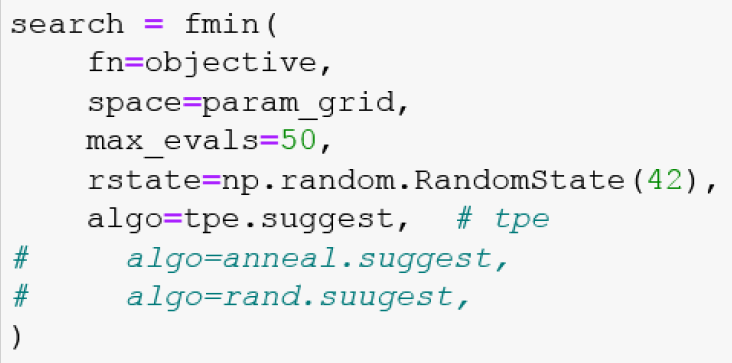

## Hyperopt –objective function





Objective function created by user

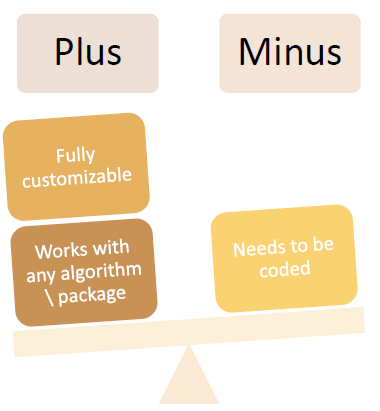

## Hyperopt –Sklearn

Alternative library to work with Scikit-learn classes
*   http://hyperopt.github.io/hyperopt-sklearn/
*   Thin documentation
*   Haven’t seen it widely adopted


## Hyperopt –Search Space

Built-in module to create hyperparameter sample spaces -hp
*   Samples Reals, Integers and Categories
*   Extremely versatile, allows multiple distributions and combinations of them
*   Accepts lists, tuples and dictionaries
*   Accepts nested hyperparameter spaces

## Search Space Configuration

Accepts lists, tuples and dictionaries

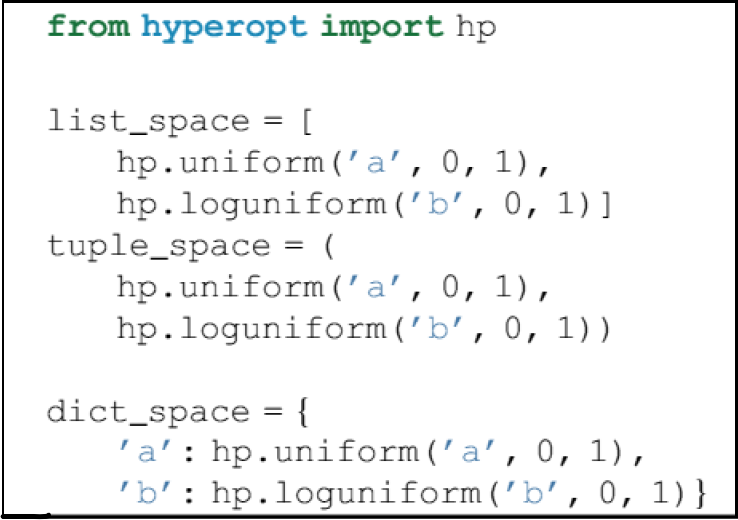

## Search Space –nested spaces

Accepts nested hyperparameter spaces

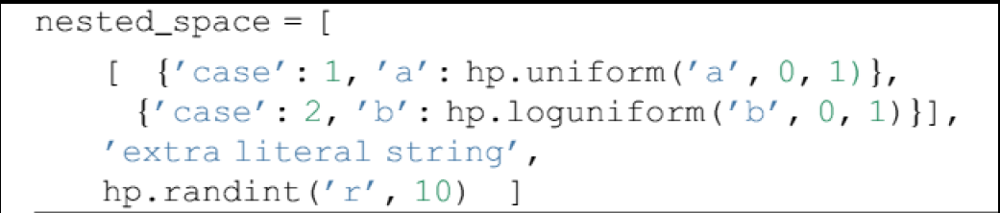

## Hyperopt –Acquisition Function

Built-in Acquisition functions
*    Expected Improvement (EI)
*    EI evaluated at binomial distributions of the input space for discrete and categorical hyperparameters
*    EI evaluated with CMA-ES for the continuous hyperparameter space

## Hyperopt –Analysis: Trials
*   Trials object allows you to store as much information as you like
*   Built-in functions for plotting
    *   Not very useful
    *   No documentation

## Parallelization -MongoDB

*   Allows search in parallel utilizing MongoDB
    *   Reduced efficiency per (single) evaluation
    *   Increased overall efficiency by saving time

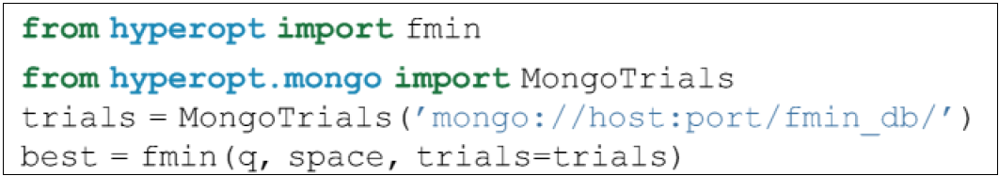

## Implementation

### Hyperopt: Space Configuration

One of the most valuable offers of Hyperopt is the flexibility it provides to create priors over the hyperparameters distributions.

Hyperopt offers:

- Multiple distributions
- Possibility to combine distributions
- Possibility to create nested spaces
- Multiple configuration ways including lists, dictionaries and tuples


#### Distributions

Taken from [hp documentation](http://hyperopt.github.io/hyperopt/getting-started/search_spaces/) 

- **hp.choice**: returns one of several options (suitable for categorical hyperparams)
- **hp.randint**: returns a random integer between 0 and an upper limit
- **hp.uniform**: returns a value uniformly between specified limits
- **hp.quniform**: Returns a value like round(uniform(low, high) / q) * q

**hp.quniform** would be an equivalent of randint (if q=1), but the upper **and lower** limits can be specified. hp.quniform also offers the possibility to use bigger values of q. So if we search for the optimal number of trees in a random forest, we could search hp.quniform('n_estimators', 10, 1000, 50), in which case we would sample between 10 and 1000 trees in increments of 50.

- **hp.loguniform**: draws values from exp(uniform(low, high)) so that the logarithm of the returned value is uniformly distributed
- **hp.qloguniform**: Returns a value like round(exp(uniform(low, high)) / q) * q (similar use and cautions to hp.quniform but for log-uniform distributions)
- **hp.normal**: draws from a normal distribution with specified mu and sigma
- **hp.qnormal**: Returns a value like round(normal(mu, sigma) / q) * q
- **hp.lognormal**: Returns a value drawn according to exp(normal(mu, sigma)) so that the logarithm of the return value is normally distributed
- **hp.qlognormal**: Returns a value like round(exp(normal(mu, sigma)) / q) * q

#### Important for q distributions
Another thing to notice is that q-distributions (qnormal, quniform, etc) return floats, where the value of the hyperparameter needs to be an integer (otherwise most models will return an error). Thus, some re-casting is necessary to pass this value to the models.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from hyperopt import hp
from hyperopt.pyll.stochastic import sample

### Distributions

#### Numerical hyperparameters

In [ ]:
# function to extract samples from the hyperparameter
# space and plot their distribution

def sample_and_plot(space, title):
    
    vals_ls = []
    
    for i in range(500):
        v = sample(space)
        v = v[0]['example']
        vals_ls.append(v)

    pd.Series(vals_ls).hist(bins=50)
    plt.title(title)
    plt.show()
    
    print('example values: ', vals_ls[0:5])

#### randint

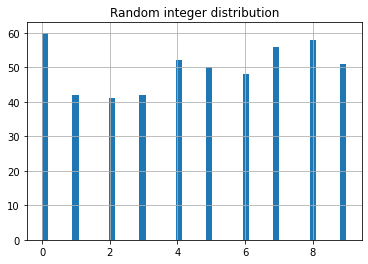

example values:  [array(9), array(5), array(0), array(2), array(1)]


In [ ]:
# randint

space = [{'example' : hp.randint('example', 10)}]

sample_and_plot(space, 'Random integer distribution')

#### uniform

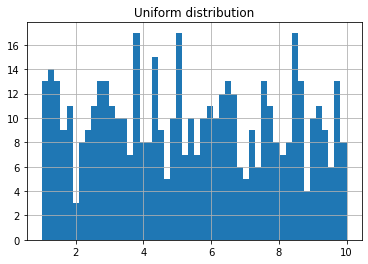

example values:  [9.666291230280084, 6.3437844426231225, 8.507591407135138, 2.2780203015942986, 3.016241228288695]


In [ ]:
# uniform

space = [{'example' : hp.uniform('example', 1, 10)}]

sample_and_plot(space, 'Uniform distribution')

#### quniform

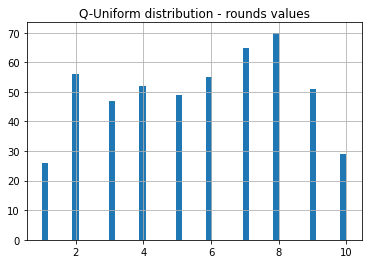

example values:  [7.0, 7.0, 7.0, 7.0, 7.0]


In [ ]:
# quniform

space = [{'example' : hp.quniform('example', 1, 10, 1)}]

sample_and_plot(space, 'Q-Uniform distribution - rounds values')

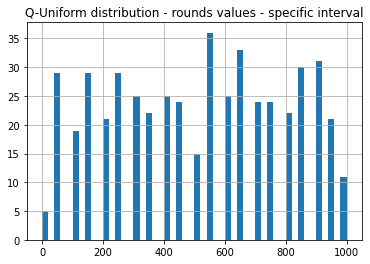

example values:  [700.0, 250.0, 300.0, 400.0, 600.0]


In [ ]:
# with quniform we can change the limits (respect to randint)

space = [{'example' : hp.quniform('example', 10, 1000, 50)}]

sample_and_plot(space, 'Q-Uniform distribution - rounds values - specific interval')

#### loguniform

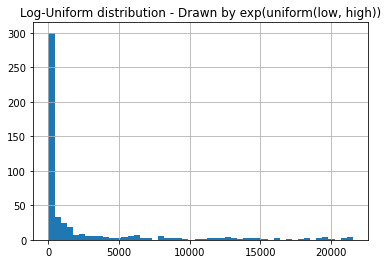

example values:  [473.9864349144676, 3.6612727114922916, 177.4854786799673, 6357.021504577825, 14657.565540211055]


In [ ]:
# loguniform

space = [{'example' : hp.loguniform('example', 1, 10)}]

sample_and_plot(space, 'Log-Uniform distribution - Drawn by exp(uniform(low, high))')

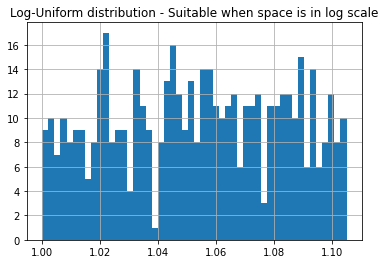

example values:  [1.034899161995344, 1.1050990464359915, 1.003120329132001, 1.0493419860698059, 1.028266562731713]


In [ ]:
# Attention, the use of loguniform for floats < 1 is unintuitive
# (at least for me)

space = [{'example' : hp.loguniform('example', 0.000001, 0.1)}]

sample_and_plot(space, 'Log-Uniform distribution - Suitable when space is in log scale')

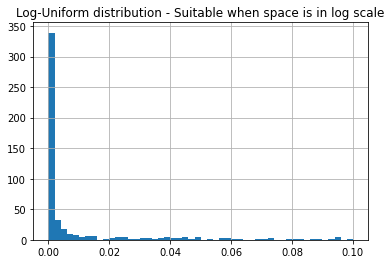

example values:  [3.4641206582308716e-05, 0.0036528170526602902, 0.014567465180859884, 2.5523431453410437e-06, 0.000658937633759833]


In [ ]:
# if we want a log distribution over 0.000001, 0.1
# we need to enter it like this:

space = [{'example' : hp.loguniform('example', np.log(0.000001), np.log(0.1))}]

sample_and_plot(space, 'Log-Uniform distribution - Suitable when space is in log scale')

#### q log uniform

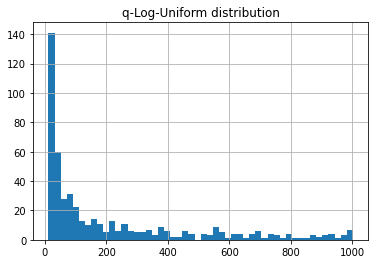

example values:  [50.856299070565896, 23.472138032568875, 82.15248311399107, 31.296184043425168, 74.32843710313477]


In [ ]:
# qloguniform
# example we want to sample trees between 10 and 1000, in increments of 50
# but we think that better values are closer to smaller number of trees,
# so we want to sample more of those

space = [{'example': hp.qloguniform('example', np.log(10), np.log(1000), np.log(50))}]

sample_and_plot(space, 'q-Log-Uniform distribution')

#### normal

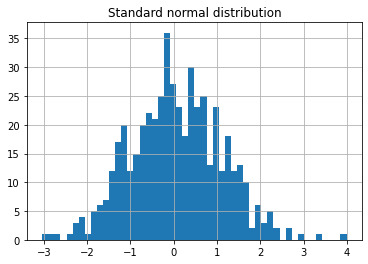

example values:  [-0.09843432524608378, -1.3357107311723113, -0.16978617141969352, 1.4982996378882862, 1.420729505241354]


In [ ]:
# normal

# the standard normal
space = [{'example': hp.normal('example', 0, 1)}]

sample_and_plot(space, 'Standard normal distribution')

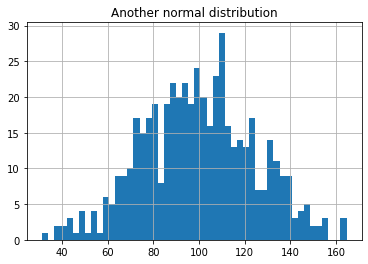

example values:  [91.77777780413346, 104.52000111967203, 116.24418873490889, 101.62502298410314, 66.8127420724104]


In [ ]:
# normal

space = [{'example': hp.normal('example', 100, 25)}]

sample_and_plot(space, 'Another normal distribution')

#### q normal

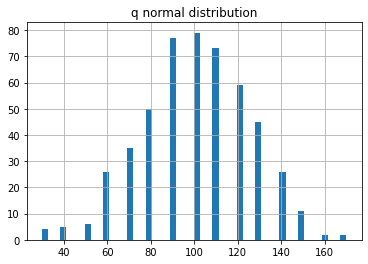

example values:  [110.0, 120.0, 90.0, 120.0, 90.0]


In [ ]:
# qnormal
# same as previous but at discrete intervals

space = [{'example': hp.qnormal('example', 100, 25, 10)}]

sample_and_plot(space, 'q normal distribution')

#### log normal

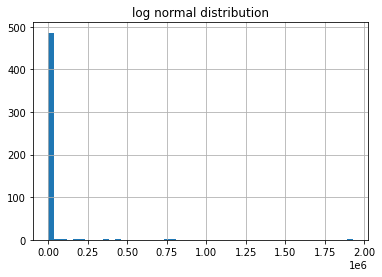

example values:  [3977.4356771270495, 108.52657050364566, 2.1912333162956266, 72.00855197934914, 4.618185713604202]


In [ ]:
# lognormal

space = [{'example': hp.lognormal('example', np.log(100), np.log(25))}]

sample_and_plot(space, 'log normal distribution')

#### q log normal

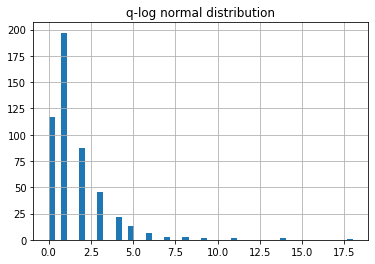

example values:  [0.0, 1.0, 2.0, 0.0, 1.0]


In [ ]:
# q-lognormal

space = [{'example': hp.qlognormal('example', 0, 1, 1)}]

sample_and_plot(space, 'q-log normal distribution')

#### Categorical hyperparameters

In [ ]:
def sample_and_plot(space, title):
    
    vals_ls = []
    
    for i in range(500):
        v = sample(space)
        v = v[0]['example']
        vals_ls.append(v)

    pd.Series(vals_ls).value_counts().plot.bar()
    plt.title(title)
    plt.ylabel('Number of draws')
    plt.show()
    
    print('example values: ', vals_ls[0:5])

#### choice

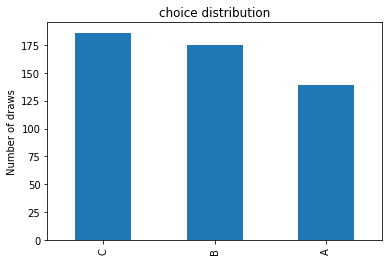

example values:  ['B', 'A', 'A', 'C', 'C']


In [ ]:
# choice

space = [{'example': hp.choice('example', ['A', 'B', 'C'])}]

sample_and_plot(space, 'choice distribution')

#### pchoice

Draws from a list with a user specified probability.

In [ ]:
# pchoice

# example from the Hyperopt article

space = hp.pchoice('example', [
    (0.8, {'use_var': 'x', 'x': hp.normal('x', 0, 1)}),
    (0.2, {'use_var': 'y', 'y': hp.uniform('y', 1, 3)})])

In [ ]:
# draw samples from space

for i in range(20):
        v = sample(space)
        print(v)

{'use_var': 'x', 'x': -0.9627664115073786}
{'use_var': 'y', 'y': 2.834109752208942}
{'use_var': 'y', 'y': 1.753719445630446}
{'use_var': 'y', 'y': 1.1471214853874536}
{'use_var': 'x', 'x': -0.9538104881315168}
{'use_var': 'x', 'x': -0.5738544011498543}
{'use_var': 'x', 'x': 0.09641371410637756}
{'use_var': 'x', 'x': -1.9879868441210828}
{'use_var': 'x', 'x': 1.3961076796605627}
{'use_var': 'y', 'y': 1.4991541882540904}
{'use_var': 'x', 'x': -2.2268068289313008}
{'use_var': 'y', 'y': 1.5792049889908168}
{'use_var': 'y', 'y': 2.542382825396989}
{'use_var': 'x', 'x': 1.5600440240878957}
{'use_var': 'x', 'x': -1.245852518910933}
{'use_var': 'x', 'x': -0.2609440890992606}
{'use_var': 'x', 'x': -0.06510607342001155}
{'use_var': 'x', 'x': 0.8424982676658782}
{'use_var': 'x', 'x': -0.9332204823708482}
{'use_var': 'y', 'y': 2.3764046541653414}


In [ ]:
# our own example, realistic, 

# if we want to sample
# a loss function but think that deviance is likely better
# than exponential

space = hp.pchoice('example', [
    (0.8, {'loss': 'deviance'}),
    (0.2, {'loss': 'exponential'})])

# draw samples from space

for i in range(20):
        v = sample(space)
        print(v)

{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'exponential'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'exponential'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'deviance'}
{'loss': 'exponential'}
{'loss': 'deviance'}
{'loss': 'exponential'}


In [ ]:
# our own example, continuing from choice

space = hp.pchoice('example', [
    (0.8, {'use_var': 'x', 'x': hp.choice('a', ['A', 'B'])}),
    (0.2, {'use_var': 'y', 'y': hp.choice('a', ['C', 'D'])})])

In [ ]:
# draw samples from space

for i in range(20):
        v = sample(space)
        print(v)

{'use_var': 'x', 'x': 'B'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'x', 'x': 'B'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'x', 'x': 'B'}
{'use_var': 'y', 'y': 'C'}
{'use_var': 'x', 'x': 'B'}
{'use_var': 'y', 'y': 'C'}
{'use_var': 'x', 'x': 'B'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'y', 'y': 'D'}
{'use_var': 'x', 'x': 'B'}
{'use_var': 'y', 'y': 'C'}
{'use_var': 'x', 'x': 'B'}
{'use_var': 'x', 'x': 'A'}
{'use_var': 'x', 'x': 'B'}


In [ ]:
# capture data in a dataframe

vals_ls = []
for i in range(500):
        v = sample(space)
        vals_ls.append(v)
        
v = pd.DataFrame(vals_ls)
v.head()

,use_var,x,y
0,x,B,NaN
1,y,NaN,C
2,y,NaN,C
3,x,A,NaN
4,y,NaN,D


In [ ]:
v['use_var'].value_counts(normalize=True)

x    0.776
y    0.224
Name: use_var, dtype: float64

In [ ]:
v['x'].value_counts(normalize=True, dropna=True)

B    0.512887
A    0.487113
Name: x, dtype: float64

In [ ]:
v['x'].value_counts(normalize=True, dropna=False)

B      0.398
A      0.378
NaN    0.224
Name: x, dtype: float64

In [ ]:
v['y'].value_counts(normalize=True)

D    0.5
C    0.5
Name: y, dtype: float64

In [ ]:
v['y'].value_counts(normalize=True, dropna=False)

NaN    0.776
D      0.112
C      0.112
Name: y, dtype: float64

#### Nested spaces

In [ ]:
space = hp.choice('classifier_type', [
    {
        'type': 'naive_bayes',
    },
    {
        'type': 'svm',
        'C': hp.lognormal('svm_C', 0, 1),
        'kernel': hp.choice('svm_kernel', [
            {'ktype': 'linear'},
            {'ktype': 'RBF', 'width': hp.lognormal('svm_rbf_width', 0, 1)},
            ]),
    },
    {
        'type': 'dtree',
        'criterion': hp.choice('dtree_criterion', ['gini', 'entropy']),
        'max_depth': hp.choice('dtree_max_depth',
            [None, hp.qlognormal('dtree_max_depth_int', 3, 1, 1)]),
        'min_samples_split': hp.qlognormal('dtree_min_samples_split', 2, 1, 1),
    },
    ])

In [ ]:
for i in range(20):
        v = sample(space)
        print(v)
        print()

{'type': 'naive_bayes'}

{'C': 0.23137349726677672, 'kernel': {'ktype': 'linear'}, 'type': 'svm'}

{'type': 'naive_bayes'}

{'C': 2.719034009530467, 'kernel': {'ktype': 'linear'}, 'type': 'svm'}

{'type': 'naive_bayes'}

{'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 11.0, 'type': 'dtree'}

{'type': 'naive_bayes'}

{'criterion': 'gini', 'max_depth': 20.0, 'min_samples_split': 3.0, 'type': 'dtree'}

{'C': 8.85595117321934, 'kernel': {'ktype': 'RBF', 'width': 0.08223478467564992}, 'type': 'svm'}

{'type': 'naive_bayes'}

{'C': 0.2468621325735123, 'kernel': {'ktype': 'RBF', 'width': 3.331291692028551}, 'type': 'svm'}

{'criterion': 'gini', 'max_depth': 2.0, 'min_samples_split': 29.0, 'type': 'dtree'}

{'C': 0.13958245411848003, 'kernel': {'ktype': 'RBF', 'width': 1.5644677090849661}, 'type': 'svm'}

{'criterion': 'entropy', 'max_depth': 2.0, 'min_samples_split': 5.0, 'type': 'dtree'}

{'type': 'naive_bayes'}

{'type': 'naive_bayes'}

{'type': 'naive_bayes'}

{'criterion'

### Search algorithms within Hyperopt

[Hyperopt](http://hyperopt.github.io/hyperopt/) provides 3 search algorithms:

- Randomized search
- Annealing
- Tree-structured Parzen Estimators


I find the documentation for Hyperopt quite unintuitive, so it helps to refer to the [original article](https://iopscience.iop.org/article/10.1088/1749-4699/8/1/014008/pdf) to understand the different parameters and classes.

#### Procedure

To tune the hyper-parameters of our model we need to:

- define a model
- define the hyperparameter space
- define the objective function we want to minimize.
- Run the minimization

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import cross_val_score, train_test_split

import xgboost as xgb

In [ ]:
# hp: define the hyperparameter space
# fmin: optimization function
# Trials: to evaluate the different searched hyperparameters
from hyperopt import hp, fmin

# the search algorithms
from hyperopt import rand, anneal, tpe

In [ ]:
# load dataset

breast_cancer_X, breast_cancer_y = load_breast_cancer(return_X_y=True)
X = pd.DataFrame(breast_cancer_X)
y = pd.Series(breast_cancer_y).map({0:1, 1:0})

X.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
# the target:
# percentage of benign (0) and malign tumors (1)

y.value_counts() / len(y)

0    0.627417
1    0.372583
dtype: float64

In [ ]:
# split dataset into a train and test set

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

X_train.shape, X_test.shape

((398, 30), (171, 30))

#### Define the Hyperparameter Space

- [Hyperopt search space](http://hyperopt.github.io/hyperopt/getting-started/search_spaces/)

- [xgb.XGBClassifier hyperparameters](https://xgboost.readthedocs.io/en/latest/python/python_api.html#xgboost.XGBClassifier)

- [xgb general parameters](https://xgboost.readthedocs.io/en/latest/parameter.html)

In [ ]:
# determine the hyperparameter space

param_grid = {
    'n_estimators': hp.quniform('n_estimators', 200, 2500, 100),
    'max_depth': hp.quniform('max_depth', 1, 10, 1),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(1)),
    'booster': hp.choice('booster', ['gbtree', 'dart']),
    'gamma': hp.loguniform('gamma', np.log(0.01), np.log(10)),
    'subsample': hp.uniform('subsample', 0.50, 0.90),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.50, 0.99),
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.50, 0.99),
    'colsample_bynode': hp.uniform('colsample_bynode', 0.50, 0.99),
    'reg_lambda': hp.uniform('reg_lambda', 1, 20)
}

#### Define the objective function

This is the hyperparameter response space, the function we want to minimize.

In [ ]:
# the objective function takes the hyperparameter space
# as input

def objective(params):

    # we need a dictionary to indicate which value from the space
    # to attribute to each value of the hyperparameter in the xgb
    params_dict = {
        # important int, as it takes integers only
        'n_estimators': int(params['n_estimators']),
        # important int, as it takes integers only
        'max_depth': int(params['max_depth']),
        'learning_rate': params['learning_rate'],
        'booster': params['booster'],
        'gamma': params['gamma'],
        'subsample': params['subsample'],
        'colsample_bytree': params['colsample_bytree'],
        'colsample_bylevel': params['colsample_bylevel'],
        'colsample_bynode': params['colsample_bynode'],
        'random_state': 1000,
    }

    # with ** we pass the items in the dictionary as parameters
    # to the xgb
    gbm = xgb.XGBClassifier(**params_dict)

    # train with cv
    score = cross_val_score(gbm, X_train, y_train,
                            scoring='accuracy', cv=3, n_jobs=4).mean()

    # to minimize, we negate the score
    return -score

#### Randomized Search

[fmin](http://hyperopt.github.io/hyperopt/getting-started/minimizing_functions/): returns the best hyperparameters found during the search.

**rand** performs randomized search

In [ ]:
# fmin performs the minimization
# rand.suggest samples the parameters at random
# i.e., performs the random search

random_search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=50,
    rstate=np.random.RandomState(42),
    algo=rand.suggest,  # randomized search
)

100%|████████████████████████████████████████████████████████| 50/50 [03:53<00:00,  4.67s/trial, best loss: -0.9673236120604543]


In [ ]:
# fmin returns a dictionary with the best parameters

type(random_search)

dict

In [ ]:
random_search

{'booster': 1,
 'colsample_bylevel': 0.649187022407888,
 'colsample_bynode': 0.862357074753306,
 'colsample_bytree': 0.6719563541005805,
 'gamma': 0.17472534129202025,
 'learning_rate': 0.10243393225105063,
 'max_depth': 4.0,
 'n_estimators': 2300.0,
 'reg_lambda': 14.826789120369174,
 'subsample': 0.6640415835413255}

In [ ]:
# create another dictionary to pass the search items as parameters
# to a new xgb

def create_param_grid(search, booster):
    best_hp_dict = {
            'n_estimators': int(search['n_estimators']), # important int, as it takes integers only
            'max_depth': int(search['max_depth']), # important int, as it takes integers only
            'learning_rate': search['learning_rate'],
            'booster': booster,
            'gamma': search['gamma'],
            'subsample': search['subsample'],
            'colsample_bytree': search['colsample_bytree'],
            'colsample_bylevel': search['colsample_bylevel'],
            'colsample_bynode': search['colsample_bynode'],
            'random_state': 1000,
    }
    return best_hp_dict

In [ ]:
# after the search we can train the model with the
# best parameters manually

best_params = create_param_grid(random_search, 'gbtree')

gbm_rand = xgb.XGBClassifier(**best_params)

gbm_rand.fit(X_train, y_train)

X_train_preds = gbm_rand.predict_proba(X_train)[:,1]
X_test_preds = gbm_rand.predict_proba(X_test)[:,1]

print()
print('Train roc_auc: ', roc_auc_score(y_train, X_train_preds))
print('Test roc_auc: ', roc_auc_score(y_test, X_test_preds))

[16:41:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


c:\users\sole\documents\repositories\envs\html\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Train roc_auc:  1.0
Test roc_auc:  0.9977954144620811


#### Annealing

**anneal**: performs annealing method as search

In [ ]:
# fmin performs the minimization
# anneal.suggest samples the parameters

anneal_search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=50,
    rstate=np.random.RandomState(42),
    algo=anneal.suggest,  # annealing search
)

anneal_search

100%|████████████████████████████████████████████████████████| 50/50 [02:40<00:00,  3.22s/trial, best loss: -0.9698868383078909]


{'booster': 1,
 'colsample_bylevel': 0.6698336654786516,
 'colsample_bynode': 0.5005757634252155,
 'colsample_bytree': 0.9416765773025605,
 'gamma': 0.5823754513798052,
 'learning_rate': 0.02591260376105093,
 'max_depth': 5.0,
 'n_estimators': 1100.0,
 'reg_lambda': 8.175051230085671,
 'subsample': 0.8154688140923786}

In [ ]:
# after the search we can train the model with the
# best parameters manually

best_params = create_param_grid(anneal_search, 'gbtree')

gbm_anneal = xgb.XGBClassifier(**best_params)

gbm_anneal.fit(X_train, y_train)

X_train_preds = gbm_anneal.predict_proba(X_train)[:,1]
X_test_preds = gbm_anneal.predict_proba(X_test)[:,1]

print()
print('Train roc_auc: ', roc_auc_score(y_train, X_train_preds))
print('Test roc_auc: ', roc_auc_score(y_test, X_test_preds))

[16:44:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


c:\users\sole\documents\repositories\envs\html\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Train roc_auc:  1.0
Test roc_auc:  0.9980893592004703


#### TPE

**tpe**: performs TPE search for hyperparameters

In [ ]:
# fmin performs the minimization
# tpe.suggest samples the parameters

tpe_search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=50,
    rstate=np.random.RandomState(42),
    algo=tpe.suggest,  # tpe
)

tpe_search

100%|████████████████████████████████████████████████████████| 50/50 [03:28<00:00,  4.17s/trial, best loss: -0.9673615857826384]


{'booster': 0,
 'colsample_bylevel': 0.6817085496128147,
 'colsample_bynode': 0.9894955547050464,
 'colsample_bytree': 0.5033210793823159,
 'gamma': 0.18941757449367247,
 'learning_rate': 0.04091478851196842,
 'max_depth': 6.0,
 'n_estimators': 2500.0,
 'reg_lambda': 16.67164153929186,
 'subsample': 0.620425040366303}

In [ ]:
# after the search we can train the model with the
# best parameters manually

best_hp_dict = create_param_grid(tpe_search, 'gbtree')

gbm_final = xgb.XGBClassifier(**best_hp_dict)

gbm_final.fit(X_train, y_train)

X_train_preds = gbm_final.predict_proba(X_train)[:,1]
X_test_preds = gbm_final.predict_proba(X_test)[:,1]

print()
print('Train roc_auc: ', roc_auc_score(y_train, X_train_preds))
print('Test roc_auc: ', roc_auc_score(y_test, X_test_preds))

[16:48:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


c:\users\sole\documents\repositories\envs\html\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Train roc_auc:  1.0
Test roc_auc:  0.9985302763080541


### Search Analysis with Hyperopt - Trials

Hyperopt comes with a few plotting functions that help analyze the search. We will showcase those here, although in my opinion they are not great, and also, there is no documentation other than the source code.

We will use the trials class to store information about the search.

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import cross_val_score, train_test_split

import xgboost as xgb

In [ ]:
# hp: define the hyperparameter space
# fmin: optimization function
# Trials: to evaluate the different searched hyperparameters
from hyperopt import hp, fmin, Trials

# the search algorithms
from hyperopt import rand, anneal, tpe

# for the search
from hyperopt import STATUS_OK, STATUS_FAIL

In [ ]:
# load dataset

breast_cancer_X, breast_cancer_y = load_breast_cancer(return_X_y=True)
X = pd.DataFrame(breast_cancer_X)
y = pd.Series(breast_cancer_y).map({0:1, 1:0})

X.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
# the target:
# percentage of benign (0) and malign tumors (1)

y.value_counts() / len(y)

0    0.627417
1    0.372583
dtype: float64

In [ ]:
# split dataset into a train and test set

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

X_train.shape, X_test.shape

((398, 30), (171, 30))

#### Define the Hyperparameter Space

- [Hyperopt search space](http://hyperopt.github.io/hyperopt/getting-started/search_spaces/)

- [xgb.XGBClassifier hyperparameters](https://xgboost.readthedocs.io/en/latest/python/python_api.html#xgboost.XGBClassifier)

- [xgb general parameters](https://xgboost.readthedocs.io/en/latest/parameter.html)

In [ ]:
# determine the hyperparameter space

param_grid = {
    'n_estimators': hp.quniform('n_estimators', 200, 2500, 100),
    'max_depth': hp.quniform('max_depth', 1, 10, 1),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(1)),
    'booster': hp.choice('booster', ['gbtree', 'dart']),
    'gamma': hp.loguniform('gamma', np.log(0.01), np.log(10)),
    'subsample': hp.uniform('subsample', 0.50, 0.90),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.50, 0.99),
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.50, 0.99),
    'colsample_bynode': hp.uniform('colsample_bynode', 0.50, 0.99),
    'reg_lambda': hp.uniform('reg_lambda', 1, 20)
}

#### Define the objective function

This is the hyperparameter response space, the function we want to minimize.

In [ ]:
# the objective function takes the hyperparameter space
# as input

def objective(params):

    # we need a dictionary to indicate which value from the space
    # to attribute to each value of the hyperparameter in the xgb
    params_dict = {
        # important int, as it takes integers only
        'n_estimators': int(params['n_estimators']),
        # important int, as it takes integers only
        'max_depth': int(params['max_depth']),
        'learning_rate': params['learning_rate'],
        'booster': params['booster'],
        'gamma': params['gamma'],
        'subsample': params['subsample'],
        'colsample_bytree': params['colsample_bytree'],
        'colsample_bylevel': params['colsample_bylevel'],
        'colsample_bynode': params['colsample_bynode'],
        'random_state': 1000,
    }

    # with ** we pass the items in the dictionary as parameters
    # to the xgb
    gbm = xgb.XGBClassifier(**params_dict)

    # train with cv
    cross_val_data = cross_val_score(
        gbm, X_train, y_train,
        scoring='accuracy', cv=3, n_jobs=4,
    )
    
    
    # === IMPORTANT ===
    # data to be returned by the search, we can add as much as we want
    
    loss = -cross_val_data.mean()
    loss_variance = cross_val_data.std()
    
    try:
        return {
            'loss': loss,
            'loss_variance':loss_variance,
            'status': STATUS_OK,
            }
    except Exception as e:
        return {
            'exception': str(e),
            'status': STATUS_FAIL,
            }

#### Randomized Search

- [fmin](http://hyperopt.github.io/hyperopt/getting-started/minimizing_functions/): returns the best hyperparameters found during the search.

- **rand** performs randomized search

- **Trials** captures the search information

In [ ]:
# fmin performs the minimization
# rand.suggest samples the parameters at random
# i.e., performs the random search

trials = Trials()

random_search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=50,
    rstate=np.random.RandomState(42),
    algo=rand.suggest,  # randomized search
    trials=trials,
)

100%|████████████████████████████████████████████████████████| 50/50 [04:19<00:00,  5.19s/trial, best loss: -0.9673236120604543]


In [ ]:
# the best hyperparameters

random_search

{'booster': 1,
 'colsample_bylevel': 0.649187022407888,
 'colsample_bynode': 0.862357074753306,
 'colsample_bytree': 0.6719563541005805,
 'gamma': 0.17472534129202025,
 'learning_rate': 0.10243393225105063,
 'max_depth': 4.0,
 'n_estimators': 2300.0,
 'reg_lambda': 14.826789120369174,
 'subsample': 0.6640415835413255}

In [ ]:
# the best hyperparameters can also be found in
# trials

trials.argmin

{'booster': 1,
 'colsample_bylevel': 0.649187022407888,
 'colsample_bynode': 0.862357074753306,
 'colsample_bytree': 0.6719563541005805,
 'gamma': 0.17472534129202025,
 'learning_rate': 0.10243393225105063,
 'max_depth': 4.0,
 'n_estimators': 2300.0,
 'reg_lambda': 14.826789120369174,
 'subsample': 0.6640415835413255}

In [ ]:
# the search hyperparameter combinations

pd.DataFrame(trials.vals).head()

,booster,colsample_bylevel,colsample_bynode,colsample_bytree,gamma,learning_rate,max_depth,n_estimators,reg_lambda,subsample
0,0,0.586348,0.581706,0.604089,0.078485,0.028547,4.0,400.0,16.820009,0.681880
1,1,0.649187,0.862357,0.671956,0.174725,0.102434,4.0,2300.0,14.826789,0.664042
2,0,0.811507,0.673258,0.567771,0.015379,0.391186,10.0,900.0,17.782990,0.834955
3,0,0.773097,0.868261,0.576170,0.229613,0.003663,5.0,400.0,18.455728,0.677933
4,1,0.946845,0.927589,0.870342,0.019336,0.037081,8.0,1600.0,4.265560,0.824958


In [ ]:
# the results

pd.DataFrame(trials.results).head()

,loss,loss_variance,status
0,-0.962330,0.006046,ok
1,-0.967324,0.007157,ok
2,-0.959824,0.019696,ok
3,-0.942223,0.012729,ok
4,-0.959805,0.009353,ok


In [ ]:
results = pd.concat([
    pd.DataFrame(trials.vals),
    pd.DataFrame(trials.results)],
    axis=1,
).sort_values(by='loss', ascending=False).reset_index(drop=True)

results.head()

,booster,colsample_bylevel,colsample_bynode,colsample_bytree,gamma,learning_rate,max_depth,n_estimators,reg_lambda,subsample,loss,loss_variance,status
0,0,0.773097,0.868261,0.576170,0.229613,0.003663,5.0,400.0,18.455728,0.677933,-0.942223,0.012729,ok
1,0,0.658331,0.529344,0.833983,6.659023,0.118395,8.0,1300.0,13.939743,0.776844,-0.942242,0.009226,ok
2,1,0.621646,0.683865,0.629344,0.412356,0.001027,4.0,2100.0,13.350835,0.760528,-0.944729,0.015429,ok
3,0,0.510049,0.824438,0.817319,0.384622,0.306273,8.0,500.0,13.191226,0.871029,-0.944729,0.009344,ok
4,0,0.812929,0.814021,0.716906,0.037867,0.002084,7.0,1000.0,12.272041,0.632247,-0.944748,0.014098,ok


#### Plotting with hyperopt

Unfortunately, the only documentation is in the source code :_(

[plotting](https://github.com/hyperopt/hyperopt/blob/master/hyperopt/plotting.py)

In [ ]:
from hyperopt import plotting as hpplot

avg best error: -0.9565237145895041


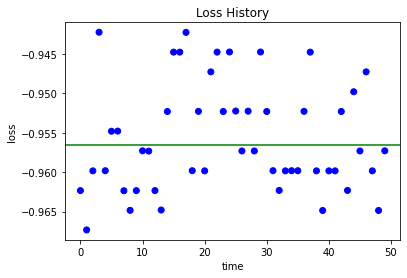

In [ ]:
hpplot.main_plot_history(trials)

Showing Histogram of 50 jobs


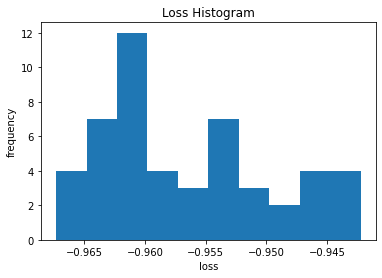

In [ ]:
hpplot.main_plot_histogram(trials)

finite loss range -0.9673236120604543 -0.942222981696666 -0.9648553201184781


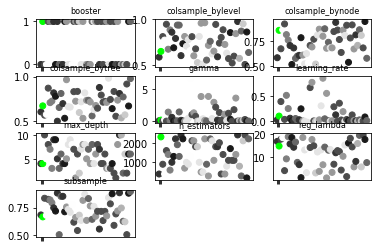

In [ ]:
hpplot.main_plot_vars(
    trials,
    do_show=True,
    fontsize=8,
    colorize_best=True,
    columns=3,
    arrange_by_loss=False,
)

#### Home made plots

In [ ]:
results = pd.concat([
    pd.DataFrame(trials.vals),
    pd.DataFrame(trials.results)],
    axis=1,
).sort_values(by='loss', ascending=False).reset_index(drop=True)

results['index'] = results.index

results.head()

,booster,colsample_bylevel,colsample_bynode,colsample_bytree,gamma,learning_rate,max_depth,n_estimators,reg_lambda,subsample,loss,loss_variance,status,index
0,0,0.773097,0.868261,0.576170,0.229613,0.003663,5.0,400.0,18.455728,0.677933,-0.942223,0.012729,ok,0
1,0,0.658331,0.529344,0.833983,6.659023,0.118395,8.0,1300.0,13.939743,0.776844,-0.942242,0.009226,ok,1
2,1,0.621646,0.683865,0.629344,0.412356,0.001027,4.0,2100.0,13.350835,0.760528,-0.944729,0.015429,ok,2
3,0,0.510049,0.824438,0.817319,0.384622,0.306273,8.0,500.0,13.191226,0.871029,-0.944729,0.009344,ok,3
4,0,0.812929,0.814021,0.716906,0.037867,0.002084,7.0,1000.0,12.272041,0.632247,-0.944748,0.014098,ok,4


Text(0.5, 0, 'Hyperparam combination')

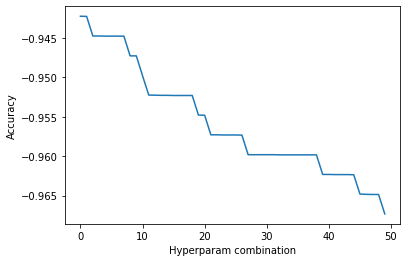

In [ ]:
results['loss'].plot()
plt.ylabel('Accuracy')
plt.xlabel('Hyperparam combination')

Text(0.5, 1.0, 'Random Search')

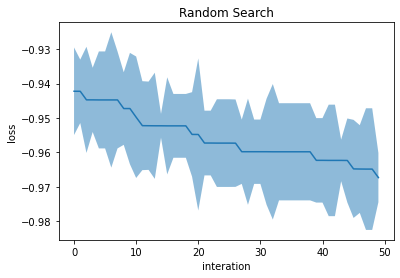

In [ ]:
ax = sns.lineplot(x=r'index', y='loss', data=results)
ax.fill_between(
    results["index"],
    y1=results["loss"] - results["loss_variance"],
    y2=results["loss"] + results["loss_variance"],
    alpha=.5,
)
plt.xlabel('interation')
plt.title('Random Search')

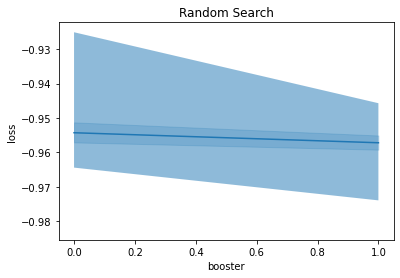

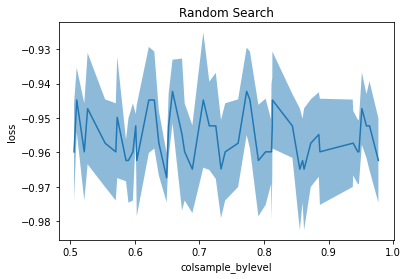

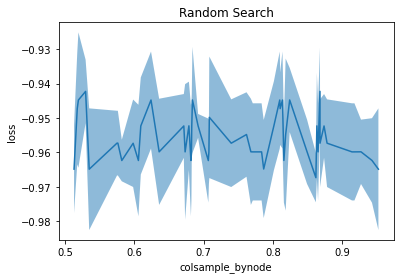

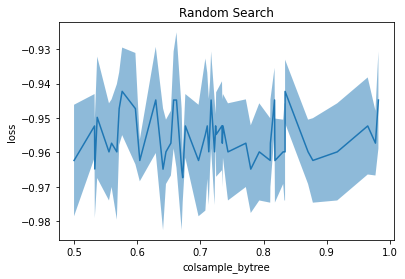

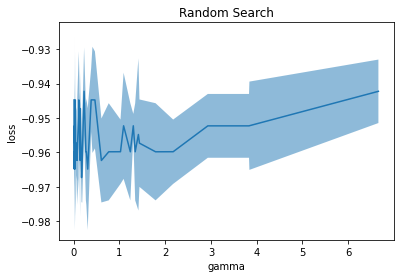

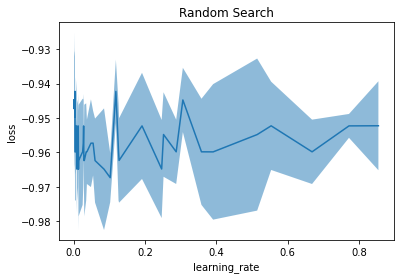

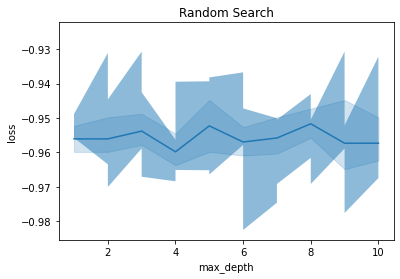

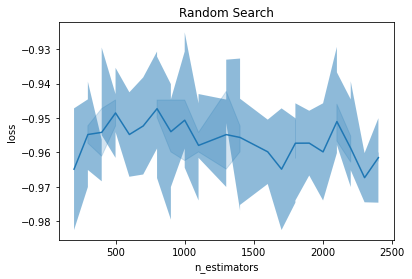

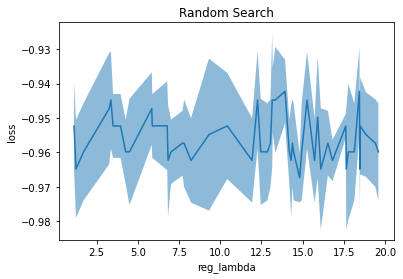

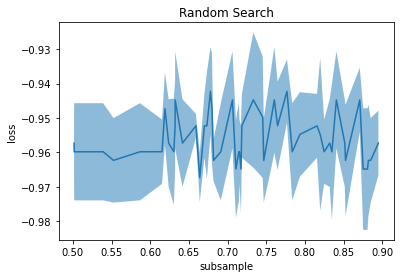

In [ ]:
for var in results.columns[:-4]:
    
    tmp = results.sort_values(by=var, ascending=True)
    
    ax = sns.lineplot(x=var, y='loss', data=tmp)
    ax.fill_between(
        tmp[var],
        y1=tmp["loss"] - tmp["loss_variance"],
        y2=tmp["loss"] + tmp["loss_variance"],
        alpha=.5,
    )
    plt.xlabel(var)
    plt.title('Random Search')
    plt.show()

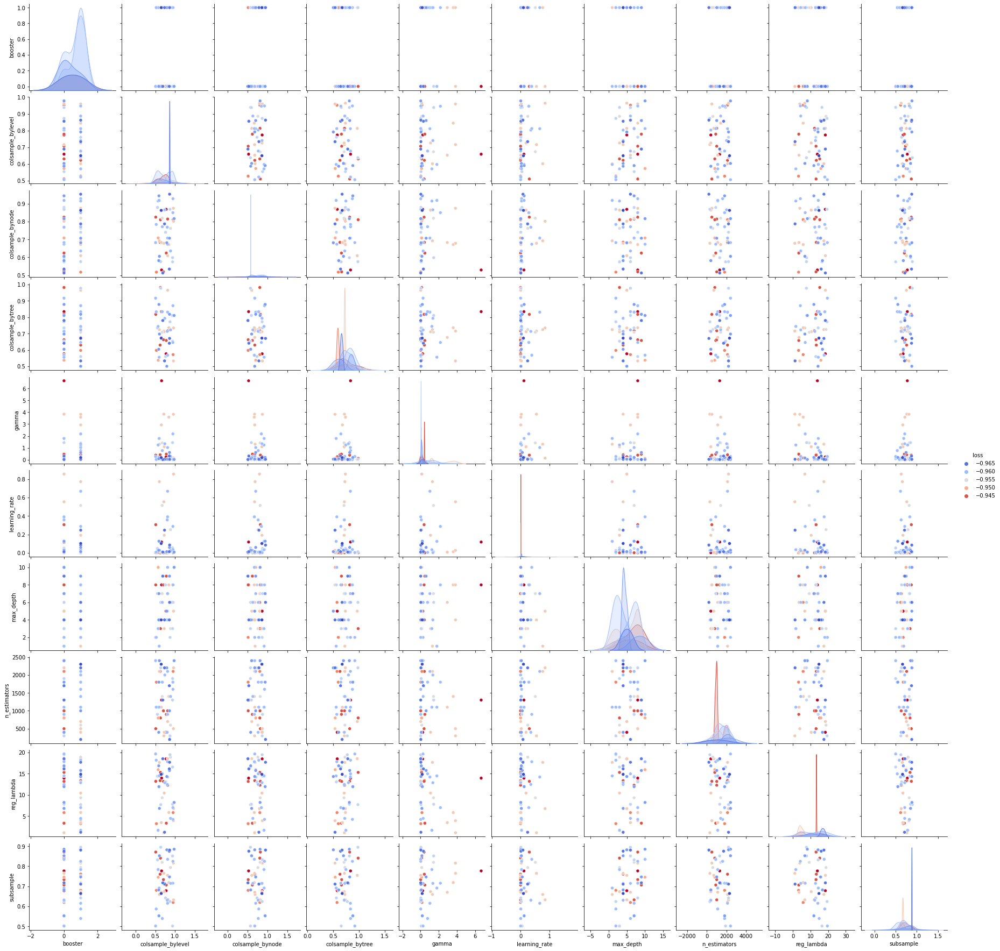

In [ ]:
sns.pairplot(results[results.columns[:-3]], hue ="loss", palette ='coolwarm')
plt.show()

#### TPE

**tpe**: performs TPE search for hyperparameters

In [ ]:
# fmin performs the minimization
# tpe.suggest samples the parameters

trials_tpe = Trials()

tpe_search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=50,
    rstate=np.random.RandomState(42),
    algo=tpe.suggest,  # tpe
    trials=trials_tpe
)

tpe_search

100%|████████████████████████████████████████████████████████| 50/50 [05:02<00:00,  6.05s/trial, best loss: -0.9673615857826384]


{'booster': 0,
 'colsample_bylevel': 0.6817085496128147,
 'colsample_bynode': 0.9894955547050464,
 'colsample_bytree': 0.5033210793823159,
 'gamma': 0.18941757449367247,
 'learning_rate': 0.04091478851196842,
 'max_depth': 6.0,
 'n_estimators': 2500.0,
 'reg_lambda': 16.67164153929186,
 'subsample': 0.620425040366303}

#### Plotting with hyperopt

Unfortunately, the only documentation is in the source code :_(

[plotting](https://github.com/hyperopt/hyperopt/blob/master/hyperopt/plotting.py)

avg best error: -0.9584190020505811


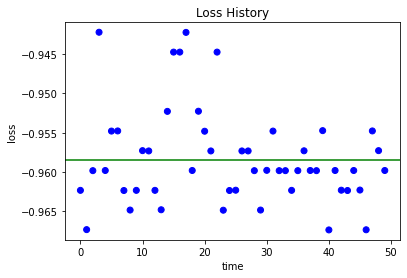

In [ ]:
hpplot.main_plot_history(trials_tpe)

Showing Histogram of 50 jobs


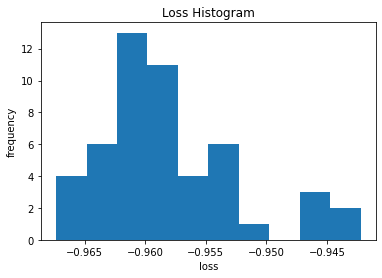

In [ ]:
hpplot.main_plot_histogram(trials_tpe)

finite loss range -0.9673615857826384 -0.942222981696666 -0.9673236120604543


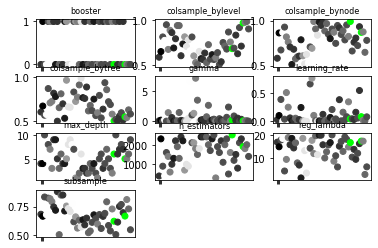

In [ ]:
hpplot.main_plot_vars(
    trials_tpe,
    do_show=True,
    fontsize=8,
    colorize_best=True,
    columns=3,
    arrange_by_loss=False,
)

#### Home made plots

In [ ]:
results = pd.concat([
    pd.DataFrame(trials_tpe.vals),
    pd.DataFrame(trials_tpe.results)],
    axis=1,
).sort_values(by='loss', ascending=False).reset_index(drop=True)

results['index'] = results.index

results.head()

,booster,colsample_bylevel,colsample_bynode,colsample_bytree,gamma,learning_rate,max_depth,n_estimators,reg_lambda,subsample,loss,loss_variance,status,index
0,0,0.773097,0.868261,0.576170,0.229613,0.003663,5.0,400.0,18.455728,0.677933,-0.942223,0.012729,ok,0
1,0,0.658331,0.529344,0.833983,6.659023,0.118395,8.0,1300.0,13.939743,0.776844,-0.942242,0.009226,ok,1
2,0,0.705984,0.518960,0.662133,0.010349,0.001221,8.0,1000.0,13.160190,0.733348,-0.944748,0.019677,ok,2
3,1,0.650865,0.837301,0.987609,0.010317,0.001032,6.0,1800.0,11.397829,0.569381,-0.944748,0.014098,ok,3
4,0,0.778141,0.623933,0.657586,0.466469,0.002374,9.0,900.0,3.369313,0.706333,-0.944748,0.014098,ok,4


Text(0.5, 0, 'Hyperparam combination')

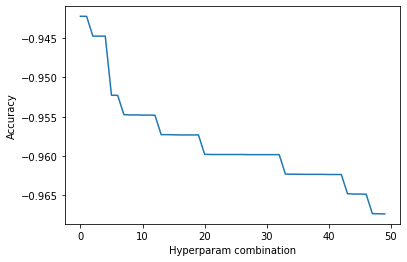

In [ ]:
results['loss'].plot()
plt.ylabel('Accuracy')
plt.xlabel('Hyperparam combination')

Text(0.5, 1.0, 'Random Search')

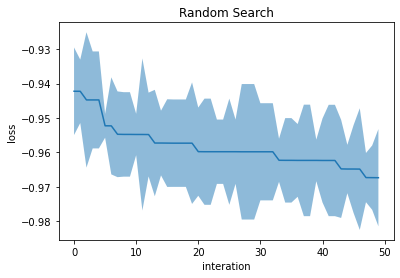

In [ ]:
ax = sns.lineplot(x=r'index', y='loss', data=results)
ax.fill_between(
    results["index"],
    y1=results["loss"] - results["loss_variance"],
    y2=results["loss"] + results["loss_variance"],
    alpha=.5,
)
plt.xlabel('interation')
plt.title('Random Search')

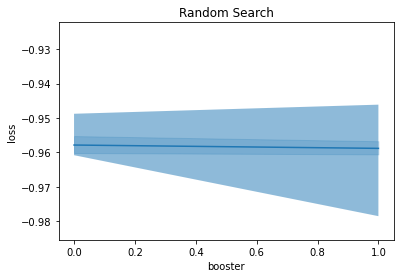

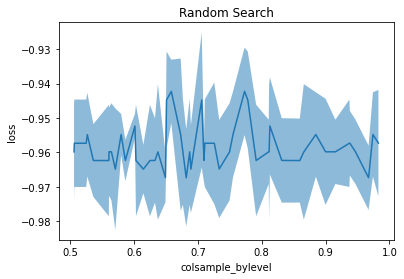

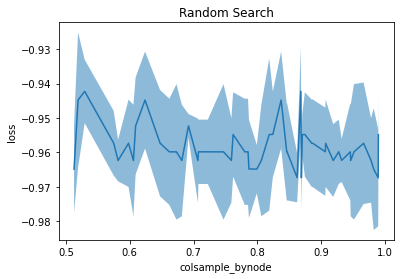

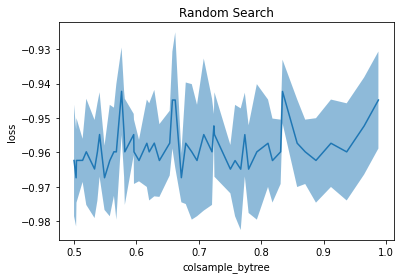

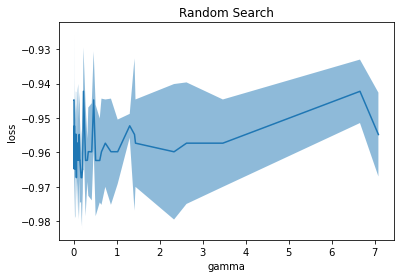

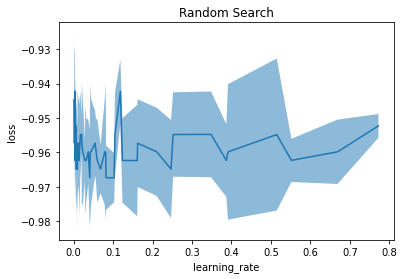

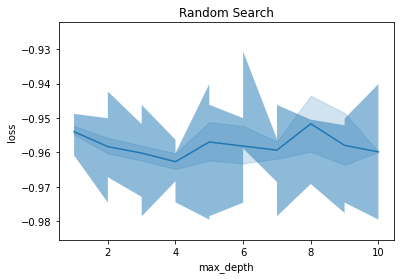

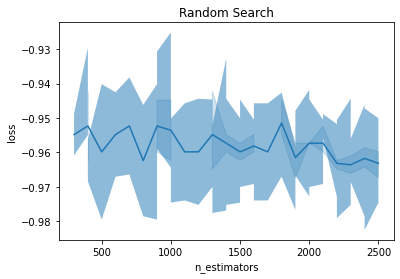

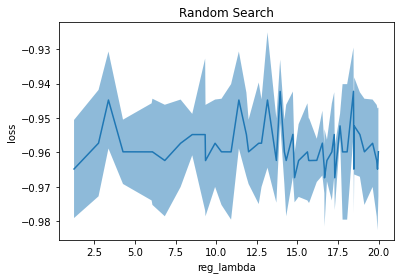

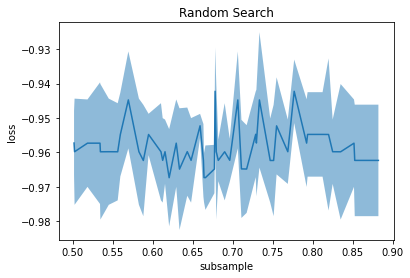

In [ ]:
for var in results.columns[:-4]:
    
    tmp = results.sort_values(by=var, ascending=True)
    
    ax = sns.lineplot(x=var, y='loss', data=tmp)
    ax.fill_between(
        tmp[var],
        y1=tmp["loss"] - tmp["loss_variance"],
        y2=tmp["loss"] + tmp["loss_variance"],
        alpha=.5,
    )
    plt.xlabel(var)
    plt.title('Random Search')
    plt.show()

In [ ]:
results.columns[:-2]

Index(['booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree',
       'gamma', 'learning_rate', 'max_depth', 'n_estimators', 'reg_lambda',
       'subsample', 'loss', 'loss_variance'],
      dtype='object')

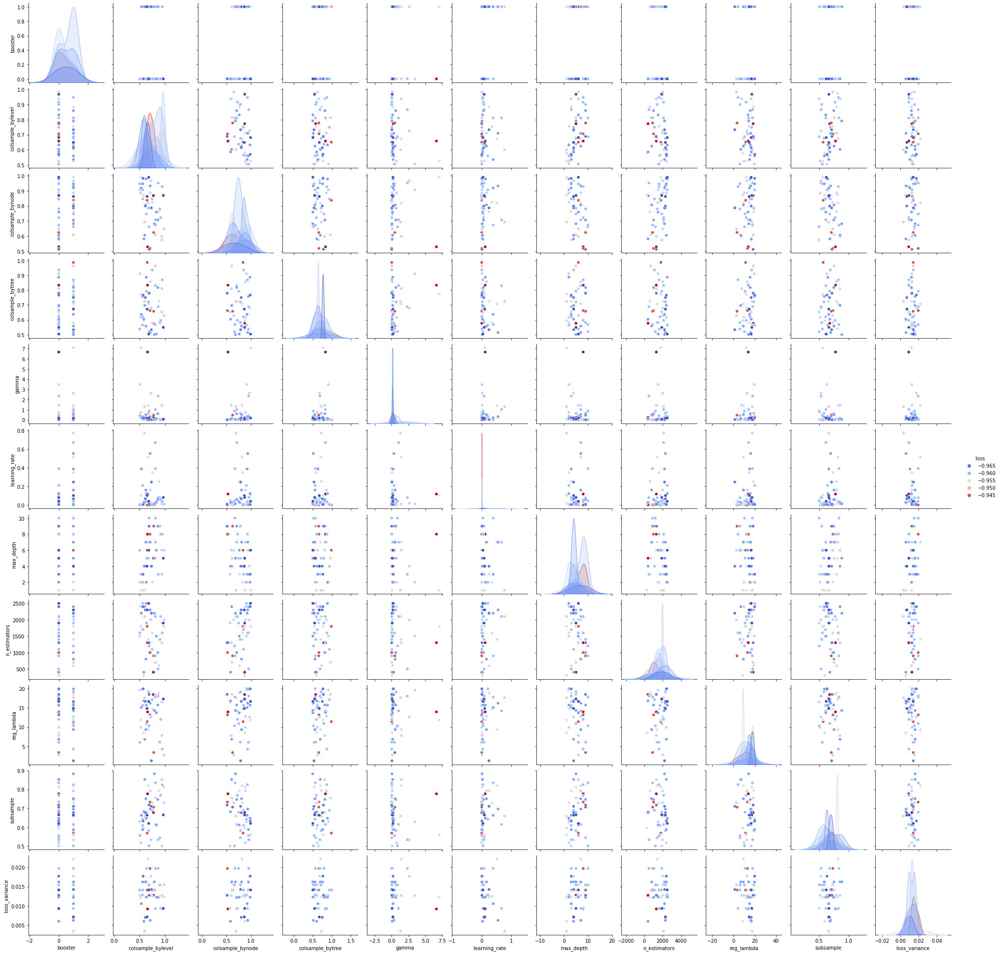

In [ ]:
sns.pairplot(results[results.columns[:-2]], hue ="loss", palette ='coolwarm')
plt.show()

### Conditional Search Spaces with Hyperopt

we will create a conditional (or nested) hyperparameter space to optimize the hyperparameters of 3 different off-the-shelf algorithms.

Utilizing the breast cancer dataset, we will optimize the hyperparameters for a linear regression, a random forest and a gradient boosting machine within the same search.

By the end of the search, we will know:

- which algorithm returns the best results
- which are the best hyperparameters for said algorithm

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import cross_val_score, train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [ ]:
# hp: define the hyperparameter space
# fmin: optimization function
# Trials: to evaluate the different searched hyperparameters
from hyperopt import hp, fmin, Trials

# the search algorithms
from hyperopt import anneal

In [ ]:
# load dataset

breast_cancer_X, breast_cancer_y = load_breast_cancer(return_X_y=True)
X = pd.DataFrame(breast_cancer_X)
y = pd.Series(breast_cancer_y).map({0:1, 1:0})

X.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
# the target:
# percentage of benign (0) and malign tumors (1)

y.value_counts() / len(y)

0    0.627417
1    0.372583
dtype: float64

In [ ]:
# split dataset into a train and test set

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

X_train.shape, X_test.shape

((398, 30), (171, 30))

#### Define the Hyperparameter Space

- [Hyperopt search space](http://hyperopt.github.io/hyperopt/getting-started/search_spaces/)

We need to define 3 spaces, 1 for each algorithm, nested or conditional to the algorithm. We create all this spaces in a master configuration.

In [ ]:
# ==================================
# determine the hyperparameter space
# ==================================

# we create dictionaries with 2 keys: "model" and "params"
# in "model" we specify the algorithm, in "params", we pass
# a dictionary with the space for that particular algorithm

# important: pass the model as class and not
# instantiated, thus LogisticRegression istead of
# LogisticRegression()

# within the params dictionaries, the keys should be
# the parameter names of the algos, as per their 
# documentation

# within the hp in each dictionary, give different names to
# later on identify to which model was the hyperparameter assigned
# see for example n_estimators_rf and n_estimators_gbm later


# the nested space
param_grid = hp.choice('classifier', [
    
    # algo 1
    {'model': LogisticRegression,
    'params': {
        'penalty': hp.choice('penalty', ['l1','l2']),
        'C' : hp.uniform('C', 0.001, 10),
        'solver': 'saga', # the only solver that works with both penalties
    }},
    
    # algo 2
    {'model': RandomForestClassifier,
    'params': {
        'n_estimators': hp.quniform('n_estimators_rf', 50, 1500, 50),
        'max_depth': hp.quniform('max_depth_rf', 1, 5, 1),
        'criterion': hp.choice('criterion_rf', ['gini', 'entropy']),
    }},
    
    # algo 3
    {'model': GradientBoostingClassifier,
    'params': {
        'n_estimators': hp.quniform('n_estimators_gbm', 50, 1500, 50),
        'max_depth': hp.quniform('max_depth_gbm', 1, 5, 1),
        'criterion': hp.choice('criterion_gbm', ['friedman_mse', 'mse']),
    }},
])

#### Define the objective function

This is the hyperparameter response space, the function we want to minimize.

In [ ]:
def objective(params):
    
    # instantiate the model
    model = params['model']() # don't forget the () to instantiate the class
    
    # capture the sampled hyperparameters
    hyperparams = params['params']
        
    try:        
        # for tree based algorithms
        hyperparams['n_estimators'] = int(hyperparams['n_estimators'])
        hyperparams['max_depth'] = int(hyperparams['max_depth'])
    except:
        pass        
        
    # in case you want to visualize what is being sampled:
    print(model, hyperparams)

    # pass the parameters to the model
    model.set_params(**hyperparams)

    # train with cv
    cross_val_data = cross_val_score(
        model,
        X_train,
        y_train,
        scoring='accuracy',
        cv=3,
        n_jobs=4,
    )

    # to minimize, we negate the score
    loss = -cross_val_data.mean()
    print(loss)
    print()
    
    return loss

In [ ]:
# fmin performs the minimization
# anneal.suggest samples the parameters

trials = Trials()

anneal_search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=50,
    rstate=np.random.RandomState(42),
    algo=anneal.suggest,  # annealing search
    trials=trials
)

RandomForestClassifier()                                                                                                        
{'criterion': 'entropy', 'max_depth': 1, 'n_estimators': 1250}                                                                  
-0.9171223513328776                                                                                                             
RandomForestClassifier()                                                                                                        
{'criterion': 'gini', 'max_depth': 5, 'n_estimators': 250}                                                                      
-0.9497797524113313                                                                                                             
RandomForestClassifier()                                                                                                        
{'criterion': 'entropy', 'max_depth': 2, 'n_estimators': 750}                                    

LogisticRegression()                                                                                                            
{'C': 7.239147733028732, 'penalty': 'l1', 'solver': 'saga'}                                                                     
-0.9120148856990963                                                                                                             
GradientBoostingClassifier()                                                                                                    
{'criterion': 'friedman_mse', 'max_depth': 2, 'n_estimators': 1300}                                                             
-0.959823801929065                                                                                                              
LogisticRegression()                                                                                                            
{'C': 6.052414940734376, 'penalty': 'l1', 'solver': 'saga'}                                      

GradientBoostingClassifier()                                                                                                    
{'criterion': 'friedman_mse', 'max_depth': 2, 'n_estimators': 1000}                                                             
-0.959823801929065                                                                                                              
GradientBoostingClassifier()                                                                                                    
{'criterion': 'mse', 'max_depth': 1, 'n_estimators': 700}                                                                       
-0.9698488645857067                                                                                                             
GradientBoostingClassifier()                                                                                                    
{'criterion': 'mse', 'max_depth': 2, 'n_estimators': 650}                                        

In [ ]:
anneal_search

{'classifier': 2,
 'criterion_gbm': 1,
 'max_depth_gbm': 1.0,
 'n_estimators_gbm': 850.0}

In [ ]:
trials.argmin

{'classifier': 2,
 'criterion_gbm': 1,
 'max_depth_gbm': 1.0,
 'n_estimators_gbm': 850.0}

In [ ]:
trials.average_best_error()

-0.9723551302498671

In [ ]:
trials.best_trial

{'state': 2,
 'tid': 27,
 'spec': None,
 'result': {'loss': -0.9723551302498671, 'status': 'ok'},
 'misc': {'tid': 27,
  'cmd': ('domain_attachment', 'FMinIter_Domain'),
  'workdir': None,
  'idxs': {'C': [],
   'classifier': [27],
   'criterion_gbm': [27],
   'criterion_rf': [],
   'max_depth_gbm': [27],
   'max_depth_rf': [],
   'n_estimators_gbm': [27],
   'n_estimators_rf': [],
   'penalty': []},
  'vals': {'C': [],
   'classifier': [2],
   'criterion_gbm': [1],
   'criterion_rf': [],
   'max_depth_gbm': [1.0],
   'max_depth_rf': [],
   'n_estimators_gbm': [850.0],
   'n_estimators_rf': [],
   'penalty': []}},
 'exp_key': None,
 'owner': None,
 'version': 0,
 'book_time': datetime.datetime(2021, 5, 13, 16, 45, 43, 647000),
 'refresh_time': datetime.datetime(2021, 5, 13, 16, 45, 45, 121000)}

<AxesSubplot:>

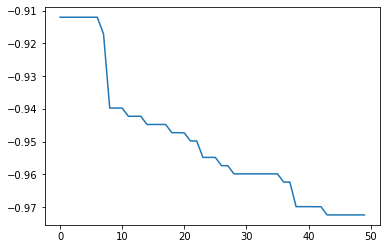

In [ ]:
# convergence

pd.Series(trials.losses()).sort_values(ascending=False).reset_index(drop=True).plot()

### TPE Hyperparameter Optimization of CNN - Hyperopt

we will use **TPE driven Bayesian Optimization** to select the best **hyperparameters** for a CNN that recognizes digits in images, using the MNIST dataset and the open source Python package [Hyperopt](http://hyperopt.github.io/hyperopt/).

The MNIST dataset is availale in [Kaggle](https://www.kaggle.com/c/digit-recognizer/data).


#### Download dataset

- Navigate to the [MNIST website in Kaggle](https://www.kaggle.com/c/digit-recognizer/data)
- Download the train.csv file
- Unzip and copy the train.csv file to where you see the SAVE_DATASETS-HERE.txt file
- Rename to mnist.csv

**Remember that you need to be logged in to be able to download the dataset**

#### Notebook content

- Data Preparation
- Set up the hyperparameter search shape
- Set up a simple CNN
- Set up the objective function
- Perform Bayesian Optimization
- Evaluate Model Performance

In [ ]:
# For reproducible results.
# See: 
# https://keras.io/getting_started/faq/#how-can-i-obtain-reproducible-results-using-keras-during-development

import os
os.environ['PYTHONHASHSEED'] = '0'

import numpy as np
import tensorflow as tf
import random as python_random

# The below is necessary for starting Numpy generated random numbers
# in a well-defined initial state.
np.random.seed(123)

# The below is necessary for starting core Python generated random numbers
# in a well-defined state.
python_random.seed(123)

# The below set_seed() will make random number generation
# in the TensorFlow backend have a well-defined initial state.
# For further details, see:
# https://www.tensorflow.org/api_docs/python/tf/random/set_seed
tf.random.set_seed(1234)

In [ ]:
import itertools
from functools import partial

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [ ]:
from keras.utils.np_utils import to_categorical
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau

In [ ]:
from hyperopt import hp, tpe, fmin, Trials

####  Data Preparation

The dataset contains information about images, each image is a hand-written digit. The aim is to have the computer predict which digit was written by the person, automatically, by "looking" at the image. 

Each image is 28 pixels in height and 28 pixels in width (28 x 28), making a total of 784 pixels. Each pixel value is an integer between 0 and 255, indicating the darkness in a gray-scale of that pixel.

The data is stored in a dataframe where each each pixel is a column (so it is flattened and not in the 28 x 28 format). 

The data set the has 785 columns. The first column, called "label", is the digit that was drawn by the user. The rest of the columns contain the pixel-values of the associated image.

In [ ]:
# Load the data

data = pd.read_csv("../mnist.csv")

# first column is the target, the rest of the columns
# are the pixels of the image

# each row is 1 image
data.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# split dataset into a train and test set

X_train, X_test, y_train, y_test = train_test_split(
    data.drop(['label'], axis=1), # the images
    data['label'], # the target
    test_size = 0.1,
    random_state=0)

X_train.shape, X_test.shape

((37800, 784), (4200, 784))

Text(0, 0.5, 'Number of images')

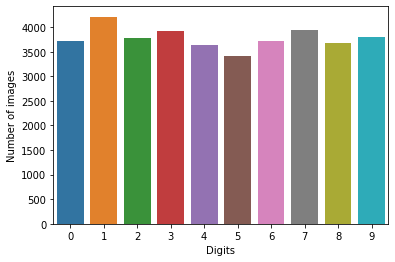

In [ ]:
# number of images for each digit

g = sns.countplot(x=y_train)
plt.xlabel('Digits')
plt.ylabel('Number of images')

There are roughly the same amount of images for each of the 10 digits.

#### Image re-scaling

We re-scale data for the CNN, between 0 and 1.

In [ ]:
# Re-scale the data

# 255 is the maximum value a pixel can take

X_train = X_train / 255
X_test = X_test / 255

#### Reshape

The images were stored in a pandas dataframe as 1-D vectors of 784 values. For a CNN with Keras, we need tensors with the following dimensions: width x height x channel. 

Thus, we reshape all data to 28 x 2 8 x 1, 3-D matrices. 

The 3rd dimension corresponds to the channel. RGB images have 3 channels. MNIST images are in gray-scale, thus they have only one channel in the 3rd dimension.

In [ ]:
# Reshape image in 3 dimensions:
# height: 28px X width: 28px X channel: 1 

X_train = X_train.values.reshape(-1,28,28,1)
X_test = X_test.values.reshape(-1,28,28,1)

#### Target encoding

In [ ]:
# the target is 1 variable with the 9 different digits
# as values

y_train.unique()

array([2, 0, 7, 4, 3, 5, 9, 6, 8, 1], dtype=int64)

In [ ]:
# For Keras, we need to create 10 dummy variables,
# one for each digit

# Encode labels to one hot vectors (ex : digit 2 -> [0,0,1,0,0,0,0,0,0,0])

y_train = to_categorical(y_train, num_classes = 10)
y_test = to_categorical(y_test, num_classes = 10)

# the new target
y_train

array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

Let's print some example images.

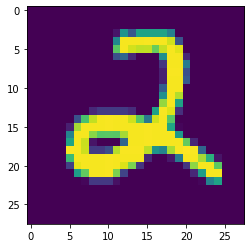

In [ ]:
# Some image examples 

g = plt.imshow(X_train[0][:,:,0])

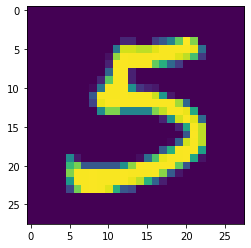

In [ ]:
# Some image examples 

g = plt.imshow(X_train[10][:,:,0])

#### Define the Hyperparameter Space

Hyperopt provides the hp module to create distributions to sample the hyperparameters. More details in [Defining a Search Space](http://hyperopt.github.io/hyperopt/getting-started/search_spaces/).


We want to find the following hyper-parameters:

- The learning rate of the optimizer.
- The number of convolutional layers.
- The number of fully-connected Dense layers.
- The number of nodes (neurons) for each of the dense layers.
- Whether to use 'sigmoid' or 'relu' activation in all the layers.

In [ ]:
# determine the hyperparameter space

param_grid = {
    'learning_rate': hp.uniform('learning_rate', 1e-6, 1e-2),
    'num_conv_layers': hp.quniform('num_conv_layers', 1, 3, 1),
    'num_dense_layers': hp.quniform('num_dense_layers', 1, 5, 1),
    'num_dense_nodes': hp.quniform('num_dense_nodes', 5, 512, 1),
    'activation': hp.choice('activation', ['relu', 'sigmoid']),
}

#### Define the CNN

We will create a CNN, with 2 Convolutional layers followed by Pooling, and varying number of fully-connected Dense layers. Each Convlutional layer, can itself have more than 1 conv layer.

In [ ]:
# function to create the CNN

def create_cnn(
    # the hyperparam to optimize are passed
    # as arguments
    learning_rate,
    num_conv_layers,
    num_dense_layers,
    num_dense_nodes,
    activation,
):
    """
    Hyper-parameters:
    learning_rate:        Learning-rate for the optimizer.
    convolutional layers: Number of conv layers.
    num_dense_layers:     Number of dense layers.
    num_dense_nodes:      Number of nodes in each dense layer.
    activation:           Activation function for all layers.
    """

    # Start construction of a Keras Sequential model.
    model = Sequential()

    # First convolutional layer.
    # There are many hyper-parameters in this layer
    # For this demo, we will optimize the activation function and
    # the number of convolutional layers that it can take.
    
    # We add the different number of conv layers in the following loop:
    
    for i in range(num_conv_layers):
        model.add(Conv2D(kernel_size=5, strides=1, filters=16, padding='same',
                         activation=activation))
    model.add(MaxPool2D(pool_size=2, strides=2))

    # Second convolutional layer.
    # Same hyperparameters to optimize as previous layer.
    for i in range(num_conv_layers):
        model.add(Conv2D(kernel_size=5, strides=1, filters=36, padding='same',
                         activation=activation))
    model.add(MaxPool2D(pool_size=2, strides=2))

    # Flatten the 4-rank output of the convolutional layers
    # to 2-rank that can be input to a fully-connected Dense layer.
    model.add(Flatten())

    # Add fully-connected Dense layers.
    # The number of layers is a hyper-parameter we want to optimize.
    # We add the different number of layers in the following loop:
    
    for i in range(num_dense_layers):
        
        # Add the dense fully-connected layer to the model.
        # This has two hyper-parameters we want to optimize:
        # The number of nodes (neurons) and the activation function.
        model.add(Dense(num_dense_nodes,
                        activation=activation,
                        ))

    # Last fully-connected dense layer with softmax-activation
    # for use in classification.
    model.add(Dense(10, activation='softmax'))

    # Use the Adam method for training the network.
    # We want to find the best learning-rate for the Adam method.
    optimizer = Adam(lr=learning_rate)

    # In Keras we need to compile the model so it can be trained.
    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

#### Define the Objective Function

In [ ]:
# we will save the model with this name
path_best_model = 'cnn_model.h5'

# starting point for the optimization
best_accuracy = 0

In [ ]:
def objective(params):
    
    """
    Hyper-parameters:
    learning_rate:        Learning-rate for the optimizer.
    convolutional layers: Number of conv layers.
    num_dense_layers:     Number of dense layers.
    num_dense_nodes:      Number of nodes in each dense layer.
    activation:           Activation function for all layers.
    """

    # Print the hyper-parameters.        
    print('learning rate: ', params['learning_rate'])
    print('num_conv_layers: ', int(params['num_conv_layers']))
    print('num_dense_layers: ',int(params['num_dense_layers']))
    print('num_dense_nodes: ', int(params['num_dense_nodes']))
    print('activation: ', params['activation'])
    print()
    
    # Create the neural network with the hyper-parameters.
    # We call the function we created previously.
    model = create_cnn(learning_rate=params['learning_rate'],
                       num_conv_layers=int(params['num_conv_layers']),
                       num_dense_layers=int(params['num_dense_layers']),
                       num_dense_nodes=int(params['num_dense_nodes']),
                       activation=params['activation'],
                       )

   
    # Set a learning rate annealer
    # this reduces the learning rate if learning does not improve
    # for a certain number of epochs
    learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                                patience=2, 
                                                verbose=1, 
                                                factor=0.5, 
                                                min_lr=0.00001)
   
    # train the model
    # we use 3 epochs to be able to run the notebook in a "reasonable"
    # time. If we increase the epochs, we will have better performance
    # this could be another parameter to optimize in fact.
    history = model.fit(x=X_train,
                        y=y_train,
                        epochs=3,
                        batch_size=128,
                        validation_split=0.1,
                        callbacks=learning_rate_reduction)

    # Get the classification accuracy on the validation-set
    # after the last training-epoch.
    accuracy = history.history['val_accuracy'][-1]

    # Print the classification accuracy.
    print()
    print("Accuracy: {0:.2%}".format(accuracy))
    print()

    # Save the model if it improves on the best-found performance.
    # We use the global keyword so we update the variable outside
    # of this function.
    global best_accuracy

    # If the classification accuracy of the saved model is improved ...
    if accuracy > best_accuracy:
        # Save the new model to harddisk.
        # Training CNNs is costly, so we want to avoid having to re-train
        # the network with the best found parameters. We save it instead
        # as we search for the best hyperparam space.
        model.save(path_best_model)
        
        # Update the classification accuracy.
        best_accuracy = accuracy

    # Delete the Keras model with these hyper-parameters from memory.
    del model

    
    # Remember that Scikit-optimize always minimizes the objective
    # function, so we need to negate the accuracy (because we want
    # the maximum accuracy)
    return -accuracy

#### Test run

In [ ]:
# Before we run the hyper-parameter optimization,
# let's first check that the everything is working
# by passing some default hyper-parameters.

default_parameters = {
    'learning_rate': 1e-5,
    'num_conv_layers': 1,
    'num_dense_layers': 1,
    'num_dense_nodes': 16,
    'activation': 'relu',
}


objective(default_parameters)

learning rate:  1e-05
num_conv_layers:  1
num_dense_layers:  1
num_dense_nodes:  16
activation:  relu

Epoch 1/3
266/266 [==============================] - 31s 112ms/step - loss: 2.2763 - accuracy: 0.1598 - val_loss: 2.1896 - val_accuracy: 0.4005
Epoch 2/3
266/266 [==============================] - 29s 108ms/step - loss: 2.1463 - accuracy: 0.4596 - val_loss: 1.9901 - val_accuracy: 0.5704
Epoch 3/3
266/266 [==============================] - 30s 111ms/step - loss: 1.9163 - accuracy: 0.6062 - val_loss: 1.6954 - val_accuracy: 0.6399

Accuracy: 63.99%



-0.6399471163749695

We obtained a mediocre accuracy, but all our code is working. So let's get started with the Optimization now!!

#### Bayesian Optimization with TPE

In [ ]:
# fmin performs the minimization
# tpe.suggest samples the parameters following tpe

# with default parameters for TPE
trials = Trials()

search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=30,
    rstate=np.random.RandomState(42),
    algo=tpe.suggest,  # tpe
    trials=trials
)

learning rate:                                                                                                                  
0.0031951530631466342                                                                                                           
num_conv_layers:                                                                                                                
1                                                                                                                               
num_dense_layers:                                                                                                               
4                                                                                                                               
num_dense_nodes:                                                                                                                
236                                                                                              

 - ETA: 39s - loss: 1.9607 - accuracy: 0.2582                                                                                   
                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 39s - loss: 1.9326 - accuracy: 0.2693                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                                                        
 - ETA: 39s - loss: 1.9048 - accuracy: 0.2802                                                                                   
                                                                                                 

 - ETA: 35s - loss: 1.5141 - accuracy: 0.4333                                                                                   
                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 34s - loss: 1.4988 - accuracy: 0.4393                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                                                        
 - ETA: 34s - loss: 1.4839 - accuracy: 0.4452                                                                                   
                                                                                                 

 - ETA: 29s - loss: 1.2561 - accuracy: 0.5345                                                                                   
                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 29s - loss: 1.2465 - accuracy: 0.5382                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                                                        
 - ETA: 29s - loss: 1.2371 - accuracy: 0.5419                                                                                   
                                                                                                 

 - ETA: 26s - loss: 1.0876 - accuracy: 0.5998                                                                                   
                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 26s - loss: 1.0810 - accuracy: 0.6023                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                                                        
 - ETA: 25s - loss: 1.0745 - accuracy: 0.6048                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.9665 - accuracy: 0.6462                                                                                   
                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 22s - loss: 0.9616 - accuracy: 0.6481                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 22s - loss: 0.9567 - accuracy: 0.6499                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.8744 - accuracy: 0.6812                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 0.8706 - accuracy: 0.6826                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 19s - loss: 0.8668 - accuracy: 0.6841                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.8017 - accuracy: 0.7086                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 16s - loss: 0.7987 - accuracy: 0.7098                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 16s - loss: 0.7956 - accuracy: 0.7109                                                                                   
                                                                                                 

 - ETA: 13s - loss: 0.7428 - accuracy: 0.7308                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.7403 - accuracy: 0.7318                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.7378 - accuracy: 0.7327                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.6941 - accuracy: 0.7491                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.6920 - accuracy: 0.7499                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.6899 - accuracy: 0.7507                                                                                   
                                                                                                 

 - ETA: 8s - loss: 0.6528 - accuracy: 0.7645                                                                                    
                                                                                                                               
208/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6510 - accuracy: 0.7652                                                                                    
                                                                                                                               
209/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6492 - accuracy: 0.7659                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.6175 - accuracy: 0.7777                                                                                    
                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.6160 - accuracy: 0.7783                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.6144 - accuracy: 0.7789                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.5869 - accuracy: 0.7892                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.5855 - accuracy: 0.7897                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.5841 - accuracy: 0.7902                                                                                    
                                                                                                   

 - ETA: 33s - loss: 0.0556 - accuracy: 0.9900                                                                                   
                                                                                                                                
  4/266 [..............................]                                                                                        
 - ETA: 35s - loss: 0.0634 - accuracy: 0.9871                                                                                   
                                                                                                                                
  5/266 [..............................]                                                                                        
 - ETA: 35s - loss: 0.0668 - accuracy: 0.9853                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.0791 - accuracy: 0.9774                                                                                   
                                                                                                                                
 25/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 0.0789 - accuracy: 0.9775                                                                                   
                                                                                                                                
 26/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 0.0787 - accuracy: 0.9775                                                                                   
                                                                                                 

 - ETA: 28s - loss: 0.0738 - accuracy: 0.9788                                                                                   
                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0736 - accuracy: 0.9789                                                                                   
                                                                                                                                
 47/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0733 - accuracy: 0.9789                                                                                   
                                                                                                 

 - ETA: 25s - loss: 0.0711 - accuracy: 0.9792                                                                                   
                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0710 - accuracy: 0.9792                                                                                   
                                                                                                                                
 68/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0709 - accuracy: 0.9792                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.0705 - accuracy: 0.9793                                                                                   
                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 0.0705 - accuracy: 0.9793                                                                                   
                                                                                                                                
 89/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 0.0705 - accuracy: 0.9793                                                                                   
                                                                                                 

 - ETA: 20s - loss: 0.0705 - accuracy: 0.9793                                                                                   
                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 20s - loss: 0.0705 - accuracy: 0.9793                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                                                        
 - ETA: 20s - loss: 0.0705 - accuracy: 0.9793                                                                                   
                                                                                                 

 - ETA: 17s - loss: 0.0704 - accuracy: 0.9793                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0704 - accuracy: 0.9793                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0704 - accuracy: 0.9794                                                                                   
                                                                                                 

 - ETA: 15s - loss: 0.0701 - accuracy: 0.9795                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0701 - accuracy: 0.9795                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0700 - accuracy: 0.9795                                                                                   
                                                                                                 

 - ETA: 12s - loss: 0.0698 - accuracy: 0.9796                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0698 - accuracy: 0.9796                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0698 - accuracy: 0.9796                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0697 - accuracy: 0.9797                                                                                    
                                                                                                                               
193/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0697 - accuracy: 0.9797                                                                                    
                                                                                                                               
194/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0697 - accuracy: 0.9797                                                                                    
                                                                                                   

 - ETA: 6s - loss: 0.0697 - accuracy: 0.9798                                                                                    
                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0697 - accuracy: 0.9798                                                                                    
                                                                                                                               
215/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0697 - accuracy: 0.9798                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0695 - accuracy: 0.9799                                                                                    
                                                                                                                               
235/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0694 - accuracy: 0.9799                                                                                    
                                                                                                                               
236/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0694 - accuracy: 0.9799                                                                                    
                                                                                                   

 - ETA: 1s - loss: 0.0693 - accuracy: 0.9800                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0693 - accuracy: 0.9800                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0693 - accuracy: 0.9800                                                                                    
                                                                                                   

 - ETA: 31s - loss: 0.0549 - accuracy: 0.9882                                                                                   
                                                                                                                                
 10/266 [>.............................]                                                                                        
 - ETA: 31s - loss: 0.0541 - accuracy: 0.9884                                                                                   
                                                                                                                                
 11/266 [>.............................]                                                                                        
 - ETA: 31s - loss: 0.0531 - accuracy: 0.9886                                                                                   
                                                                                                 

 - ETA: 29s - loss: 0.0488 - accuracy: 0.9887                                                                                   
                                                                                                                                
 31/266 [==>...........................]                                                                                        
 - ETA: 29s - loss: 0.0487 - accuracy: 0.9886                                                                                   
                                                                                                                                
 32/266 [==>...........................]                                                                                        
 - ETA: 28s - loss: 0.0486 - accuracy: 0.9886                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.0471 - accuracy: 0.9881                                                                                   
                                                                                                                                
 52/266 [====>.........................]                                                                                        
 - ETA: 26s - loss: 0.0470 - accuracy: 0.9881                                                                                   
                                                                                                                                
 53/266 [====>.........................]                                                                                        
 - ETA: 26s - loss: 0.0469 - accuracy: 0.9881                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0464 - accuracy: 0.9879                                                                                   
                                                                                                                                
 73/266 [=======>......................]                                                                                        
 - ETA: 24s - loss: 0.0464 - accuracy: 0.9879                                                                                   
                                                                                                                                
 74/266 [=======>......................]                                                                                        
 - ETA: 23s - loss: 0.0464 - accuracy: 0.9879                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.0465 - accuracy: 0.9878                                                                                   
                                                                                                                                
 94/266 [=========>....................]                                                                                        
 - ETA: 21s - loss: 0.0466 - accuracy: 0.9877                                                                                   
                                                                                                                                
 95/266 [=========>....................]                                                                                        
 - ETA: 21s - loss: 0.0466 - accuracy: 0.9877                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.0466 - accuracy: 0.9877                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 0.0466 - accuracy: 0.9877                                                                                   
                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 0.0466 - accuracy: 0.9877                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.0470 - accuracy: 0.9876                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0470 - accuracy: 0.9876                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0470 - accuracy: 0.9876                                                                                   
                                                                                                 

 - ETA: 13s - loss: 0.0471 - accuracy: 0.9875                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0472 - accuracy: 0.9875                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0472 - accuracy: 0.9875                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0472 - accuracy: 0.9875                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.0472 - accuracy: 0.9875                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.0472 - accuracy: 0.9875                                                                                   
                                                                                                 

 - ETA: 8s - loss: 0.0473 - accuracy: 0.9875                                                                                    
                                                                                                                               
199/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0473 - accuracy: 0.9875                                                                                    
                                                                                                                               
200/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0473 - accuracy: 0.9875                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.0473 - accuracy: 0.9875                                                                                    
                                                                                                                               
220/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0473 - accuracy: 0.9875                                                                                    
                                                                                                                               
221/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0473 - accuracy: 0.9875                                                                                    
                                                                                                   

 - ETA: 3s - loss: 0.0472 - accuracy: 0.9875                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0471 - accuracy: 0.9875                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0471 - accuracy: 0.9875                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.0470 - accuracy: 0.9875                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0470 - accuracy: 0.9875                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0470 - accuracy: 0.9875                                                                                    
                                                                                                   

                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 2:31 - loss: 2.3070 - accuracy: 0.1310                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 2:30 - loss: 2.3069 - accuracy: 0.1306                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                            

                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 2:18 - loss: 2.3054 - accuracy: 0.1233                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 2:17 - loss: 2.3054 - accuracy: 0.1231                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                            

                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 2:05 - loss: 2.3046 - accuracy: 0.1208                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 2:04 - loss: 2.3046 - accuracy: 0.1207                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                            

                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:52 - loss: 2.3041 - accuracy: 0.1194                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:52 - loss: 2.3041 - accuracy: 0.1194                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                            

                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:40 - loss: 2.3038 - accuracy: 0.1184                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:39 - loss: 2.3038 - accuracy: 0.1184                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                            

                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:27 - loss: 2.3036 - accuracy: 0.1178                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:27 - loss: 2.3036 - accuracy: 0.1178                                                                                  
                                                                                                                               
119/266 [============>.................]                                                            

                                                                                                                               
138/266 [==============>...............]                                                                                        
 - ETA: 1:15 - loss: 2.3034 - accuracy: 0.1172                                                                                  
                                                                                                                               
139/266 [==============>...............]                                                                                        
 - ETA: 1:14 - loss: 2.3034 - accuracy: 0.1172                                                                                  
                                                                                                                               
140/266 [==============>...............]                                                            

                                                                                                                               
159/266 [================>.............]                                                                                        
 - ETA: 1:03 - loss: 2.3033 - accuracy: 0.1168                                                                                  
                                                                                                                               
160/266 [=================>............]                                                                                        
 - ETA: 1:02 - loss: 2.3033 - accuracy: 0.1168                                                                                  
                                                                                                                               
161/266 [=================>............]                                                            

                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 50s - loss: 2.3032 - accuracy: 0.1164                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 50s - loss: 2.3032 - accuracy: 0.1164                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                         

                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 38s - loss: 2.3031 - accuracy: 0.1160                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 37s - loss: 2.3031 - accuracy: 0.1159                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                         

                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 25s - loss: 2.3030 - accuracy: 0.1156                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 25s - loss: 2.3030 - accuracy: 0.1156                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                         

                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 13s - loss: 2.3030 - accuracy: 0.1154                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                                                        
 - ETA: 12s - loss: 2.3030 - accuracy: 0.1153                                                                                   
                                                                                                                                
245/266 [==========================>...]                                                         

                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3029 - accuracy: 0.1150                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3029 - accuracy: 0.1150                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 2:25 - loss: 2.3006 - accuracy: 0.1062                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 2:25 - loss: 2.3006 - accuracy: 0.1061                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                            

                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 2:13 - loss: 2.3007 - accuracy: 0.1071                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 2:12 - loss: 2.3007 - accuracy: 0.1071                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                            

                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 2:02 - loss: 2.3010 - accuracy: 0.1070                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 2:01 - loss: 2.3010 - accuracy: 0.1070                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                            

                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:49 - loss: 2.3011 - accuracy: 0.1069                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:49 - loss: 2.3011 - accuracy: 0.1069                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                            

                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:36 - loss: 2.3012 - accuracy: 0.1069                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:36 - loss: 2.3012 - accuracy: 0.1069                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                            

                                                                                                                               
123/266 [============>.................]                                                                                        
 - ETA: 1:24 - loss: 2.3013 - accuracy: 0.1071                                                                                  
                                                                                                                               
124/266 [============>.................]                                                                                        
 - ETA: 1:23 - loss: 2.3013 - accuracy: 0.1071                                                                                  
                                                                                                                               
125/266 [=============>................]                                                            

                                                                                                                               
144/266 [===============>..............]                                                                                        
 - ETA: 1:11 - loss: 2.3014 - accuracy: 0.1072                                                                                  
                                                                                                                               
145/266 [===============>..............]                                                                                        
 - ETA: 1:11 - loss: 2.3014 - accuracy: 0.1072                                                                                  
                                                                                                                               
146/266 [===============>..............]                                                            

                                                                                                                               
165/266 [=================>............]                                                                                        
 - ETA: 59s - loss: 2.3014 - accuracy: 0.1071                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 59s - loss: 2.3014 - accuracy: 0.1071                                                                                   
                                                                                                                                
167/266 [=================>............]                                                          

                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 47s - loss: 2.3015 - accuracy: 0.1073                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 46s - loss: 2.3015 - accuracy: 0.1073                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                         

                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 34s - loss: 2.3015 - accuracy: 0.1074                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 34s - loss: 2.3015 - accuracy: 0.1074                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                         

                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 22s - loss: 2.3015 - accuracy: 0.1076                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 21s - loss: 2.3015 - accuracy: 0.1076                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                         

                                                                                                                                
249/266 [===========================>..]                                                                                        
 - ETA: 10s - loss: 2.3015 - accuracy: 0.1077                                                                                   
                                                                                                                                
250/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 2.3015 - accuracy: 0.1077                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                          

                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 2:33 - loss: 2.3034 - accuracy: 0.1059                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 2:33 - loss: 2.3031 - accuracy: 0.1077                                                                                  
                                                                                                                               
  5/266 [..............................]                                                            

                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 2:22 - loss: 2.3008 - accuracy: 0.1170                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 2:22 - loss: 2.3008 - accuracy: 0.1170                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                            

                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 2:10 - loss: 2.3008 - accuracy: 0.1166                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 2:10 - loss: 2.3008 - accuracy: 0.1165                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                            

                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:58 - loss: 2.3008 - accuracy: 0.1157                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:57 - loss: 2.3008 - accuracy: 0.1157                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                            

                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:45 - loss: 2.3009 - accuracy: 0.1150                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:45 - loss: 2.3009 - accuracy: 0.1150                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                            

                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 1:33 - loss: 2.3009 - accuracy: 0.1145                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:32 - loss: 2.3009 - accuracy: 0.1145                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                            

                                                                                                                               
129/266 [=============>................]                                                                                        
 - ETA: 1:21 - loss: 2.3010 - accuracy: 0.1141                                                                                  
                                                                                                                               
130/266 [=============>................]                                                                                        
 - ETA: 1:20 - loss: 2.3010 - accuracy: 0.1141                                                                                  
                                                                                                                               
131/266 [=============>................]                                                            

                                                                                                                               
150/266 [===============>..............]                                                                                        
 - ETA: 1:08 - loss: 2.3010 - accuracy: 0.1140                                                                                  
                                                                                                                               
151/266 [================>.............]                                                                                        
 - ETA: 1:08 - loss: 2.3010 - accuracy: 0.1140                                                                                  
                                                                                                                               
152/266 [================>.............]                                                            

                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 56s - loss: 2.3010 - accuracy: 0.1139                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 55s - loss: 2.3010 - accuracy: 0.1139                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                         

                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 43s - loss: 2.3009 - accuracy: 0.1138                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 43s - loss: 2.3009 - accuracy: 0.1138                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                         

                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 31s - loss: 2.3010 - accuracy: 0.1136                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 30s - loss: 2.3010 - accuracy: 0.1136                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                         

                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 18s - loss: 2.3010 - accuracy: 0.1135                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 18s - loss: 2.3010 - accuracy: 0.1135                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                         

                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3010 - accuracy: 0.1134                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 2.3010 - accuracy: 0.1134                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                            

                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:36 - loss: 8.5489 - accuracy: 0.0855                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:36 - loss: 8.1853 - accuracy: 0.0855                                                                                  
                                                                                                                               
  7/266 [..............................]                                                            

                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:29 - loss: 4.9777 - accuracy: 0.0895                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:29 - loss: 4.9121 - accuracy: 0.0896                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                            

                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 4.0854 - accuracy: 0.0933                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:20 - loss: 4.0588 - accuracy: 0.0935                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                            

                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:13 - loss: 3.6661 - accuracy: 0.0967                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:12 - loss: 3.6515 - accuracy: 0.0969                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                            

                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:05 - loss: 3.4177 - accuracy: 0.0989                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:05 - loss: 3.4083 - accuracy: 0.0990                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                            

                                                                                                                                
110/266 [===========>..................]                                                                                        
 - ETA: 57s - loss: 3.2516 - accuracy: 0.1007                                                                                   
                                                                                                                                
111/266 [===========>..................]                                                                                        
 - ETA: 57s - loss: 3.2450 - accuracy: 0.1007                                                                                   
                                                                                                                                
112/266 [===========>..................]                                                         

                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 49s - loss: 3.1318 - accuracy: 0.1019                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 49s - loss: 3.1269 - accuracy: 0.1020                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                         

                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 3.0410 - accuracy: 0.1030                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 3.0372 - accuracy: 0.1030                                                                                   
                                                                                                                                
154/266 [================>.............]                                                         

                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 2.9696 - accuracy: 0.1037                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 33s - loss: 2.9665 - accuracy: 0.1037                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                         

                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 26s - loss: 2.9117 - accuracy: 0.1042                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 26s - loss: 2.9092 - accuracy: 0.1042                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                         

                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 2.8638 - accuracy: 0.1045                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 2.8618 - accuracy: 0.1045                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                         

                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.8235 - accuracy: 0.1048                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 2.8217 - accuracy: 0.1048                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                         

                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 2.7890 - accuracy: 0.1049                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.7875 - accuracy: 0.1049                                                                                    
                                                                                                                               
259/266 [============================>.]                                                            

                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 1:33 - loss: 2.3002 - accuracy: 0.1038                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:33 - loss: 2.3002 - accuracy: 0.1045                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                            

                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 1:25 - loss: 2.3008 - accuracy: 0.1085                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:25 - loss: 2.3008 - accuracy: 0.1086                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                            

                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 1:18 - loss: 2.3010 - accuracy: 0.1093                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:17 - loss: 2.3011 - accuracy: 0.1093                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                            

                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 1:10 - loss: 2.3013 - accuracy: 0.1085                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:10 - loss: 2.3013 - accuracy: 0.1084                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                            

                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:03 - loss: 2.3014 - accuracy: 0.1078                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:02 - loss: 2.3014 - accuracy: 0.1078                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                            

                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 2.3015 - accuracy: 0.1076                                                                                   
                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 54s - loss: 2.3015 - accuracy: 0.1076                                                                                   
                                                                                                                                
118/266 [============>.................]                                                         

                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 2.3016 - accuracy: 0.1075                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 2.3016 - accuracy: 0.1075                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                         

                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 39s - loss: 2.3016 - accuracy: 0.1073                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 39s - loss: 2.3017 - accuracy: 0.1073                                                                                   
                                                                                                                                
160/266 [=================>............]                                                         

                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.3017 - accuracy: 0.1072                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 2.3017 - accuracy: 0.1072                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                         

                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.3017 - accuracy: 0.1071                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 23s - loss: 2.3017 - accuracy: 0.1071                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                         

                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 16s - loss: 2.3018 - accuracy: 0.1071                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3018 - accuracy: 0.1071                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                         

                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3018 - accuracy: 0.1071                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3018 - accuracy: 0.1071                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                            

                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3018 - accuracy: 0.1073                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3018 - accuracy: 0.1073                                                                                    
                                                                                                                               
265/266 [============================>.]                                                            

                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 1:31 - loss: 2.3010 - accuracy: 0.1170                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 2.3010 - accuracy: 0.1169                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                            

                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:23 - loss: 2.3010 - accuracy: 0.1169                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:23 - loss: 2.3010 - accuracy: 0.1169                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                            

                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:15 - loss: 2.3011 - accuracy: 0.1159                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:15 - loss: 2.3011 - accuracy: 0.1159                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                            

                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 2.3012 - accuracy: 0.1152                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 2.3012 - accuracy: 0.1152                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                            

                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:00 - loss: 2.3012 - accuracy: 0.1146                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:00 - loss: 2.3012 - accuracy: 0.1146                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                            

                                                                                                                                
122/266 [============>.................]                                                                                        
 - ETA: 52s - loss: 2.3013 - accuracy: 0.1142                                                                                   
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 52s - loss: 2.3013 - accuracy: 0.1142                                                                                   
                                                                                                                                
124/266 [============>.................]                                                         

                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 45s - loss: 2.3013 - accuracy: 0.1140                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 2.3013 - accuracy: 0.1140                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                         

                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 37s - loss: 2.3013 - accuracy: 0.1139                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 37s - loss: 2.3013 - accuracy: 0.1139                                                                                   
                                                                                                                                
166/266 [=================>............]                                                         

                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 29s - loss: 2.3013 - accuracy: 0.1138                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 29s - loss: 2.3013 - accuracy: 0.1138                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                         

                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 2.3013 - accuracy: 0.1137                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 2.3013 - accuracy: 0.1137                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                         

                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 2.3013 - accuracy: 0.1135                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 13s - loss: 2.3013 - accuracy: 0.1135                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                         

                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 6s - loss: 2.3013 - accuracy: 0.1133                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3013 - accuracy: 0.1133                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                            

num_conv_layers:                                                                                                                
1                                                                                                                               
num_dense_layers:                                                                                                               
5                                                                                                                               
num_dense_nodes:                                                                                                                
231                                                                                                                             
activation:                                                                                                                     
sigmoid                                                                                          

 19/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 2.4608 - accuracy: 0.1059                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 2.4573 - accuracy: 0.1061                                                                                   
                                                                                                                                
 21/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 2.4540 - accuracy: 0.1063                                                    

 40/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 2.4166 - accuracy: 0.1072                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 2.4153 - accuracy: 0.1072                                                                                   
                                                                                                                                
 42/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 2.4140 - accuracy: 0.1072                                                    

 61/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 2.3953 - accuracy: 0.1072                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 2.3945 - accuracy: 0.1072                                                                                   
                                                                                                                                
 63/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 2.3938 - accuracy: 0.1072                                                    

 82/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 2.3824 - accuracy: 0.1069                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 2.3819 - accuracy: 0.1069                                                                                   
                                                                                                                                
 84/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 2.3814 - accuracy: 0.1069                                                    

103/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 2.3737 - accuracy: 0.1065                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 2.3733 - accuracy: 0.1064                                                                                   
                                                                                                                                
105/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 2.3730 - accuracy: 0.1064                                                    

124/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 2.3674 - accuracy: 0.1059                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 2.3671 - accuracy: 0.1059                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 2.3669 - accuracy: 0.1058                                                    

145/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 2.3626 - accuracy: 0.1055                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 2.3624 - accuracy: 0.1055                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 2.3622 - accuracy: 0.1054                                                    

166/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 2.3587 - accuracy: 0.1051                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 2.3585 - accuracy: 0.1051                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 2.3584 - accuracy: 0.1050                                                    

187/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 2.3555 - accuracy: 0.1048                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 2.3554 - accuracy: 0.1048                                                                                    
                                                                                                                               
189/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 2.3553 - accuracy: 0.1048                                                      

208/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 2.3529 - accuracy: 0.1046                                                                                    
                                                                                                                               
209/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 2.3528 - accuracy: 0.1046                                                                                    
                                                                                                                               
210/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 2.3526 - accuracy: 0.1046                                                       

229/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 2.3506 - accuracy: 0.1044                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 2.3505 - accuracy: 0.1044                                                                                    
                                                                                                                               
231/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 2.3504 - accuracy: 0.1044                                                       

250/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 2.3485 - accuracy: 0.1042                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 2.3484 - accuracy: 0.1042                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 2.3484 - accuracy: 0.1042                                                       

  4/266 [..............................]                                                                                        
 - ETA: 32s - loss: 2.2984 - accuracy: 0.1040                                                                                   
                                                                                                                                
  5/266 [..............................]                                                                                        
 - ETA: 32s - loss: 2.2992 - accuracy: 0.1007                                                                                   
                                                                                                                                
  6/266 [..............................]                                                                                        
 - ETA: 32s - loss: 2.2997 - accuracy: 0.0991                                                    

 25/266 [=>............................]                                                                                        
 - ETA: 30s - loss: 2.3038 - accuracy: 0.1015                                                                                   
                                                                                                                                
 26/266 [=>............................]                                                                                        
 - ETA: 30s - loss: 2.3038 - accuracy: 0.1016                                                                                   
                                                                                                                                
 27/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 2.3038 - accuracy: 0.1018                                                    

 46/266 [====>.........................]                                                                                        
 - ETA: 28s - loss: 2.3040 - accuracy: 0.1018                                                                                   
                                                                                                                                
 47/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 2.3040 - accuracy: 0.1018                                                                                   
                                                                                                                                
 48/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 2.3040 - accuracy: 0.1017                                                    

 67/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 2.3039 - accuracy: 0.1014                                                                                   
                                                                                                                                
 68/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 2.3039 - accuracy: 0.1014                                                                                   
                                                                                                                                
 69/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 2.3039 - accuracy: 0.1014                                                    

 88/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 2.3038 - accuracy: 0.1013                                                                                   
                                                                                                                                
 89/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 2.3038 - accuracy: 0.1014                                                                                   
                                                                                                                                
 90/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 2.3038 - accuracy: 0.1014                                                    

109/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 2.3037 - accuracy: 0.1016                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 2.3037 - accuracy: 0.1016                                                                                   
                                                                                                                                
111/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 2.3037 - accuracy: 0.1017                                                    

130/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 2.3036 - accuracy: 0.1020                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 2.3036 - accuracy: 0.1021                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 2.3036 - accuracy: 0.1021                                                    

151/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 2.3035 - accuracy: 0.1024                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 2.3035 - accuracy: 0.1024                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 2.3035 - accuracy: 0.1024                                                    

172/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 2.3034 - accuracy: 0.1026                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 2.3034 - accuracy: 0.1026                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 2.3034 - accuracy: 0.1026                                                    

193/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 2.3034 - accuracy: 0.1028                                                                                    
                                                                                                                               
194/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 2.3034 - accuracy: 0.1028                                                                                    
                                                                                                                               
195/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 2.3034 - accuracy: 0.1028                                                       

214/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 2.3033 - accuracy: 0.1031                                                                                    
                                                                                                                               
215/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 2.3033 - accuracy: 0.1031                                                                                    
                                                                                                                               
216/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 2.3033 - accuracy: 0.1031                                                       

235/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 2.3032 - accuracy: 0.1034                                                                                    
                                                                                                                               
236/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 2.3032 - accuracy: 0.1034                                                                                    
                                                                                                                               
237/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 2.3032 - accuracy: 0.1034                                                       

256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 2.3032 - accuracy: 0.1037                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 2.3032 - accuracy: 0.1037                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3032 - accuracy: 0.1037                                                       

 10/266 [>.............................]                                                                                        
 - ETA: 33s - loss: 2.3007 - accuracy: 0.1166                                                                                   
                                                                                                                                
 11/266 [>.............................]                                                                                        
 - ETA: 32s - loss: 2.3007 - accuracy: 0.1168                                                                                   
                                                                                                                                
 12/266 [>.............................]                                                                                        
 - ETA: 32s - loss: 2.3007 - accuracy: 0.1171                                                    

 31/266 [==>...........................]                                                                                        
 - ETA: 29s - loss: 2.3009 - accuracy: 0.1170                                                                                   
                                                                                                                                
 32/266 [==>...........................]                                                                                        
 - ETA: 29s - loss: 2.3009 - accuracy: 0.1170                                                                                   
                                                                                                                                
 33/266 [==>...........................]                                                                                        
 - ETA: 29s - loss: 2.3009 - accuracy: 0.1170                                                    

 52/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 2.3010 - accuracy: 0.1161                                                                                   
                                                                                                                                
 53/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 2.3010 - accuracy: 0.1161                                                                                   
                                                                                                                                
 54/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 2.3010 - accuracy: 0.1160                                                    

 73/266 [=======>......................]                                                                                        
 - ETA: 25s - loss: 2.3010 - accuracy: 0.1155                                                                                   
                                                                                                                                
 74/266 [=======>......................]                                                                                        
 - ETA: 25s - loss: 2.3010 - accuracy: 0.1154                                                                                   
                                                                                                                                
 75/266 [=======>......................]                                                                                        
 - ETA: 24s - loss: 2.3010 - accuracy: 0.1154                                                    

 94/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 2.3011 - accuracy: 0.1148                                                                                   
                                                                                                                                
 95/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 2.3011 - accuracy: 0.1148                                                                                   
                                                                                                                                
 96/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 2.3011 - accuracy: 0.1148                                                    

115/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 2.3011 - accuracy: 0.1143                                                                                   
                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 2.3011 - accuracy: 0.1143                                                                                   
                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 2.3011 - accuracy: 0.1143                                                    

136/266 [==============>...............]                                                                                        
 - ETA: 17s - loss: 2.3011 - accuracy: 0.1141                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 2.3011 - accuracy: 0.1141                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 2.3011 - accuracy: 0.1140                                                    

157/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 2.3011 - accuracy: 0.1140                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 2.3011 - accuracy: 0.1140                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 2.3011 - accuracy: 0.1139                                                    

178/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 2.3011 - accuracy: 0.1139                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 2.3011 - accuracy: 0.1139                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 2.3011 - accuracy: 0.1139                                                    

199/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 2.3011 - accuracy: 0.1137                                                                                    
                                                                                                                               
200/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 2.3011 - accuracy: 0.1137                                                                                    
                                                                                                                               
201/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 2.3011 - accuracy: 0.1137                                                       

220/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 2.3011 - accuracy: 0.1136                                                                                    
                                                                                                                               
221/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 2.3011 - accuracy: 0.1136                                                                                    
                                                                                                                               
222/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 2.3011 - accuracy: 0.1136                                                       

241/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 2.3011 - accuracy: 0.1135                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 2.3011 - accuracy: 0.1135                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 2.3011 - accuracy: 0.1135                                                       

262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3011 - accuracy: 0.1134                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3011 - accuracy: 0.1133                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3012 - accuracy: 0.1133                                                       

                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 3.4987 - accuracy: 0.1152                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 3.4669 - accuracy: 0.1141                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                            

                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:29 - loss: 3.0561 - accuracy: 0.1052                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 3.0435 - accuracy: 0.1050                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                            

                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:21 - loss: 2.8646 - accuracy: 0.1037                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 2.8582 - accuracy: 0.1037                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                            

                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 2.7584 - accuracy: 0.1033                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 2.7545 - accuracy: 0.1033                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                            

                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:05 - loss: 2.6898 - accuracy: 0.1031                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 2.6872 - accuracy: 0.1031                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                            

                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 2.6417 - accuracy: 0.1027                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.6398 - accuracy: 0.1027                                                                                   
                                                                                                                                
119/266 [============>.................]                                                         

                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 2.6059 - accuracy: 0.1023                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 2.6044 - accuracy: 0.1023                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                         

                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 2.5779 - accuracy: 0.1020                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 2.5767 - accuracy: 0.1020                                                                                   
                                                                                                                                
161/266 [=================>............]                                                         

                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.5554 - accuracy: 0.1018                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.5545 - accuracy: 0.1018                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                         

                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 2.5370 - accuracy: 0.1016                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.5362 - accuracy: 0.1016                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                         

                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 2.5215 - accuracy: 0.1014                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.5209 - accuracy: 0.1014                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                         

                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.5085 - accuracy: 0.1013                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.5079 - accuracy: 0.1012                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                            

                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.4972 - accuracy: 0.1012                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.4967 - accuracy: 0.1012                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:36 - loss: 2.3415 - accuracy: 0.1138                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:35 - loss: 2.3418 - accuracy: 0.1128                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                            

                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:29 - loss: 2.3420 - accuracy: 0.1033                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:28 - loss: 2.3419 - accuracy: 0.1031                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                            

                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 2.3399 - accuracy: 0.1002                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 2.3398 - accuracy: 0.1002                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                            

                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:12 - loss: 2.3386 - accuracy: 0.0994                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:12 - loss: 2.3386 - accuracy: 0.0994                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                            

                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 2.3385 - accuracy: 0.0991                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 2.3385 - accuracy: 0.0991                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                            

                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3385 - accuracy: 0.0992                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 2.3385 - accuracy: 0.0992                                                                                   
                                                                                                                                
125/266 [=============>................]                                                         

                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 47s - loss: 2.3385 - accuracy: 0.0993                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 47s - loss: 2.3385 - accuracy: 0.0994                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                         

                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 2.3384 - accuracy: 0.0996                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 2.3384 - accuracy: 0.0996                                                                                   
                                                                                                                                
167/266 [=================>............]                                                         

                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 2.3382 - accuracy: 0.0997                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 2.3382 - accuracy: 0.0997                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                         

                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3382 - accuracy: 0.0997                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 2.3382 - accuracy: 0.0997                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                         

                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 2.3384 - accuracy: 0.0996                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 2.3385 - accuracy: 0.0996                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                         

                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3386 - accuracy: 0.0995                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3386 - accuracy: 0.0995                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                            

                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 1:46 - loss: 2.3236 - accuracy: 0.0942                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 2.3236 - accuracy: 0.0936                                                                                  
                                                                                                                               
  5/266 [..............................]                                                            

                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 1:34 - loss: 2.3275 - accuracy: 0.0945                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:34 - loss: 2.3276 - accuracy: 0.0946                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                            

                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 1:26 - loss: 2.3300 - accuracy: 0.0959                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:26 - loss: 2.3301 - accuracy: 0.0959                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                            

                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:19 - loss: 2.3305 - accuracy: 0.0970                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:18 - loss: 2.3305 - accuracy: 0.0970                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                            

                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:10 - loss: 2.3307 - accuracy: 0.0977                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:10 - loss: 2.3307 - accuracy: 0.0978                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                            

                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 2.3304 - accuracy: 0.0982                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 2.3304 - accuracy: 0.0982                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                            

                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 54s - loss: 2.3306 - accuracy: 0.0984                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 53s - loss: 2.3306 - accuracy: 0.0984                                                                                   
                                                                                                                                
131/266 [=============>................]                                                         

                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 45s - loss: 2.3309 - accuracy: 0.0986                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 45s - loss: 2.3309 - accuracy: 0.0986                                                                                   
                                                                                                                                
152/266 [================>.............]                                                         

                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 37s - loss: 2.3310 - accuracy: 0.0987                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3310 - accuracy: 0.0987                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                         

                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 2.3310 - accuracy: 0.0988                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.3310 - accuracy: 0.0988                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                         

                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.3310 - accuracy: 0.0989                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.3310 - accuracy: 0.0989                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                         

                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3310 - accuracy: 0.0989                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3310 - accuracy: 0.0989                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                         

                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 2.3311 - accuracy: 0.0989                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 2.3311 - accuracy: 0.0989                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                            

                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:39 - loss: 3.3616 - accuracy: 0.0983                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:42 - loss: 3.3870 - accuracy: 0.0982                                                                                  
                                                                                                                               
  7/266 [..............................]                                                            

                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:35 - loss: 3.0554 - accuracy: 0.1006                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:34 - loss: 3.0423 - accuracy: 0.1006                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                            

                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:26 - loss: 2.8566 - accuracy: 0.1005                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:26 - loss: 2.8500 - accuracy: 0.1004                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                            

                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 2.7475 - accuracy: 0.0999                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 2.7435 - accuracy: 0.0998                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                            

                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:09 - loss: 2.6782 - accuracy: 0.0998                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:09 - loss: 2.6755 - accuracy: 0.0998                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                            

                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:01 - loss: 2.6297 - accuracy: 0.0999                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:01 - loss: 2.6278 - accuracy: 0.0999                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                            

                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 53s - loss: 2.5937 - accuracy: 0.1002                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 2.5922 - accuracy: 0.1002                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                         

                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 45s - loss: 2.5656 - accuracy: 0.1005                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 2.5645 - accuracy: 0.1005                                                                                   
                                                                                                                                
154/266 [================>.............]                                                         

                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.5432 - accuracy: 0.1007                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.5422 - accuracy: 0.1007                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                         

                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.5247 - accuracy: 0.1008                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.5239 - accuracy: 0.1008                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                         

                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.5092 - accuracy: 0.1009                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 2.5085 - accuracy: 0.1009                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                         

                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.4959 - accuracy: 0.1010                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.4954 - accuracy: 0.1010                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                         

                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 2.4845 - accuracy: 0.1011                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.4840 - accuracy: 0.1011                                                                                    
                                                                                                                               
259/266 [============================>.]                                                            

                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 1:38 - loss: 2.2992 - accuracy: 0.1085                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:38 - loss: 2.2995 - accuracy: 0.1088                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                            

                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 1:33 - loss: 2.3020 - accuracy: 0.1093                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:32 - loss: 2.3021 - accuracy: 0.1092                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                            

                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 1:24 - loss: 2.3025 - accuracy: 0.1076                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:24 - loss: 2.3025 - accuracy: 0.1075                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                            

                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 1:15 - loss: 2.3028 - accuracy: 0.1067                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:15 - loss: 2.3028 - accuracy: 0.1066                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                            

                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:07 - loss: 2.3030 - accuracy: 0.1057                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:07 - loss: 2.3030 - accuracy: 0.1057                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                            

                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 59s - loss: 2.3032 - accuracy: 0.1052                                                                                   
                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 2.3032 - accuracy: 0.1052                                                                                   
                                                                                                                                
118/266 [============>.................]                                                         

                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 51s - loss: 2.3032 - accuracy: 0.1051                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 2.3032 - accuracy: 0.1051                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                         

                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 2.3033 - accuracy: 0.1049                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 2.3033 - accuracy: 0.1049                                                                                   
                                                                                                                                
160/266 [=================>............]                                                         

                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 2.3033 - accuracy: 0.1048                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.3033 - accuracy: 0.1048                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                         

                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 2.3034 - accuracy: 0.1047                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 2.3034 - accuracy: 0.1047                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                         

                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 17s - loss: 2.3034 - accuracy: 0.1048                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 2.3034 - accuracy: 0.1048                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                         

                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 2.3034 - accuracy: 0.1048                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 2.3034 - accuracy: 0.1048                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                            

                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3033 - accuracy: 0.1049                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3033 - accuracy: 0.1049                                                                                    
                                                                                                                               
265/266 [============================>.]                                                            

                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 2.3018 - accuracy: 0.1170                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:36 - loss: 2.3019 - accuracy: 0.1169                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                            

                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:29 - loss: 2.3018 - accuracy: 0.1169                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:28 - loss: 2.3018 - accuracy: 0.1169                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                            

                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:21 - loss: 2.3018 - accuracy: 0.1159                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 2.3018 - accuracy: 0.1159                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                            

                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:13 - loss: 2.3018 - accuracy: 0.1152                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:12 - loss: 2.3018 - accuracy: 0.1152                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                            

                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 2.3018 - accuracy: 0.1145                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 2.3018 - accuracy: 0.1145                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                            

                                                                                                                                
122/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3019 - accuracy: 0.1139                                                                                   
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3019 - accuracy: 0.1139                                                                                   
                                                                                                                                
124/266 [============>.................]                                                         

                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 2.3018 - accuracy: 0.1137                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 2.3018 - accuracy: 0.1137                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                         

                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 2.3018 - accuracy: 0.1135                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 2.3018 - accuracy: 0.1135                                                                                   
                                                                                                                                
166/266 [=================>............]                                                         

                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 2.3018 - accuracy: 0.1134                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 2.3018 - accuracy: 0.1134                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                         

                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3018 - accuracy: 0.1132                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3018 - accuracy: 0.1132                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                         

                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3018 - accuracy: 0.1129                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3018 - accuracy: 0.1129                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                         

                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 2.3018 - accuracy: 0.1127                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3018 - accuracy: 0.1127                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                            

0.0018850644923625356                                                                                                           
num_conv_layers:                                                                                                                
1                                                                                                                               
num_dense_layers:                                                                                                               
5                                                                                                                               
num_dense_nodes:                                                                                                                
377                                                                                                                             
activation:                                                                                      

                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 37s - loss: 2.0546 - accuracy: 0.2371                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                                                        
 - ETA: 37s - loss: 2.0335 - accuracy: 0.2449                                                                                   
                                                                                                                                
 21/266 [=>............................]                                                         

                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 34s - loss: 1.6676 - accuracy: 0.3809                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                                                        
 - ETA: 34s - loss: 1.6526 - accuracy: 0.3866                                                                                   
                                                                                                                                
 42/266 [===>..........................]                                                         

                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 31s - loss: 1.4078 - accuracy: 0.4800                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                                                        
 - ETA: 31s - loss: 1.3978 - accuracy: 0.4838                                                                                   
                                                                                                                                
 63/266 [======>.......................]                                                         

                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 27s - loss: 1.2298 - accuracy: 0.5479                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                                                        
 - ETA: 27s - loss: 1.2227 - accuracy: 0.5506                                                                                   
                                                                                                                                
 84/266 [========>.....................]                                                         

                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 24s - loss: 1.0986 - accuracy: 0.5977                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 24s - loss: 1.0932 - accuracy: 0.5998                                                                                   
                                                                                                                                
105/266 [==========>...................]                                                         

                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 21s - loss: 0.9974 - accuracy: 0.6361                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 21s - loss: 0.9931 - accuracy: 0.6377                                                                                   
                                                                                                                                
126/266 [=============>................]                                                         

                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 18s - loss: 0.9164 - accuracy: 0.6666                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 18s - loss: 0.9129 - accuracy: 0.6679                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                         

                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 14s - loss: 0.8502 - accuracy: 0.6915                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 14s - loss: 0.8473 - accuracy: 0.6926                                                                                   
                                                                                                                                
168/266 [=================>............]                                                         

                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 11s - loss: 0.7950 - accuracy: 0.7123                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 11s - loss: 0.7926 - accuracy: 0.7132                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                         

                                                                                                                               
208/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 0.7480 - accuracy: 0.7299                                                                                    
                                                                                                                               
209/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 0.7460 - accuracy: 0.7307                                                                                    
                                                                                                                               
210/266 [======================>.......]                                                            

                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.7076 - accuracy: 0.7451                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.7058 - accuracy: 0.7457                                                                                    
                                                                                                                               
231/266 [=========================>....]                                                            

                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.6724 - accuracy: 0.7582                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.6708 - accuracy: 0.7588                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                            

                                                                                                                                
  4/266 [..............................]                                                                                        
 - ETA: 36s - loss: 0.0950 - accuracy: 0.9668                                                                                   
                                                                                                                                
  5/266 [..............................]                                                                                        
 - ETA: 36s - loss: 0.0951 - accuracy: 0.9678                                                                                   
                                                                                                                                
  6/266 [..............................]                                                         

                                                                                                                                
 25/266 [=>............................]                                                                                        
 - ETA: 34s - loss: 0.0851 - accuracy: 0.9709                                                                                   
                                                                                                                                
 26/266 [=>............................]                                                                                        
 - ETA: 34s - loss: 0.0847 - accuracy: 0.9710                                                                                   
                                                                                                                                
 27/266 [==>...........................]                                                         

                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 31s - loss: 0.0784 - accuracy: 0.9730                                                                                   
                                                                                                                                
 47/266 [====>.........................]                                                                                        
 - ETA: 31s - loss: 0.0782 - accuracy: 0.9730                                                                                   
                                                                                                                                
 48/266 [====>.........................]                                                         

                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 28s - loss: 0.0756 - accuracy: 0.9742                                                                                   
                                                                                                                                
 68/266 [======>.......................]                                                                                        
 - ETA: 28s - loss: 0.0755 - accuracy: 0.9743                                                                                   
                                                                                                                                
 69/266 [======>.......................]                                                         

                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 25s - loss: 0.0740 - accuracy: 0.9752                                                                                   
                                                                                                                                
 89/266 [=========>....................]                                                                                        
 - ETA: 25s - loss: 0.0739 - accuracy: 0.9752                                                                                   
                                                                                                                                
 90/266 [=========>....................]                                                         

                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 22s - loss: 0.0729 - accuracy: 0.9760                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                                                        
 - ETA: 22s - loss: 0.0729 - accuracy: 0.9760                                                                                   
                                                                                                                                
111/266 [===========>..................]                                                         

                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 19s - loss: 0.0721 - accuracy: 0.9765                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 19s - loss: 0.0721 - accuracy: 0.9766                                                                                   
                                                                                                                                
132/266 [=============>................]                                                         

                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 16s - loss: 0.0715 - accuracy: 0.9770                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 16s - loss: 0.0714 - accuracy: 0.9770                                                                                   
                                                                                                                                
153/266 [================>.............]                                                         

                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.0708 - accuracy: 0.9774                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.0708 - accuracy: 0.9774                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                         

                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.0703 - accuracy: 0.9777                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.0703 - accuracy: 0.9777                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                         

                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 0.0700 - accuracy: 0.9780                                                                                    
                                                                                                                               
215/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 0.0700 - accuracy: 0.9780                                                                                    
                                                                                                                               
216/266 [=======================>......]                                                            

                                                                                                                               
235/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0696 - accuracy: 0.9782                                                                                    
                                                                                                                               
236/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0696 - accuracy: 0.9782                                                                                    
                                                                                                                               
237/266 [=========================>....]                                                            

                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0693 - accuracy: 0.9784                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0693 - accuracy: 0.9784                                                                                    
                                                                                                                               
258/266 [============================>.]                                                            

                                                                                                                                
 10/266 [>.............................]                                                                                        
 - ETA: 36s - loss: 0.0223 - accuracy: 0.9922                                                                                   
                                                                                                                                
 11/266 [>.............................]                                                                                        
 - ETA: 36s - loss: 0.0227 - accuracy: 0.9920                                                                                   
                                                                                                                                
 12/266 [>.............................]                                                         

                                                                                                                                
 31/266 [==>...........................]                                                                                        
 - ETA: 34s - loss: 0.0371 - accuracy: 0.9881                                                                                   
                                                                                                                                
 32/266 [==>...........................]                                                                                        
 - ETA: 34s - loss: 0.0375 - accuracy: 0.9879                                                                                   
                                                                                                                                
 33/266 [==>...........................]                                                         

                                                                                                                                
 52/266 [====>.........................]                                                                                        
 - ETA: 31s - loss: 0.0417 - accuracy: 0.9868                                                                                   
                                                                                                                                
 53/266 [====>.........................]                                                                                        
 - ETA: 31s - loss: 0.0418 - accuracy: 0.9868                                                                                   
                                                                                                                                
 54/266 [=====>........................]                                                         

                                                                                                                                
 73/266 [=======>......................]                                                                                        
 - ETA: 28s - loss: 0.0425 - accuracy: 0.9867                                                                                   
                                                                                                                                
 74/266 [=======>......................]                                                                                        
 - ETA: 28s - loss: 0.0426 - accuracy: 0.9867                                                                                   
                                                                                                                                
 75/266 [=======>......................]                                                         

                                                                                                                                
 94/266 [=========>....................]                                                                                        
 - ETA: 25s - loss: 0.0431 - accuracy: 0.9866                                                                                   
                                                                                                                                
 95/266 [=========>....................]                                                                                        
 - ETA: 24s - loss: 0.0431 - accuracy: 0.9866                                                                                   
                                                                                                                                
 96/266 [=========>....................]                                                         

                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 22s - loss: 0.0437 - accuracy: 0.9865                                                                                   
                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 21s - loss: 0.0437 - accuracy: 0.9865                                                                                   
                                                                                                                                
117/266 [============>.................]                                                         

                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 0.0439 - accuracy: 0.9865                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 0.0439 - accuracy: 0.9865                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                         

                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 15s - loss: 0.0440 - accuracy: 0.9865                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 15s - loss: 0.0440 - accuracy: 0.9865                                                                                   
                                                                                                                                
159/266 [================>.............]                                                         

                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 12s - loss: 0.0439 - accuracy: 0.9866                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 12s - loss: 0.0439 - accuracy: 0.9866                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                         

                                                                                                                               
199/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0438 - accuracy: 0.9867                                                                                    
                                                                                                                               
200/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0438 - accuracy: 0.9867                                                                                    
                                                                                                                               
201/266 [=====================>........]                                                            

                                                                                                                               
220/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0438 - accuracy: 0.9867                                                                                    
                                                                                                                               
221/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0438 - accuracy: 0.9867                                                                                    
                                                                                                                               
222/266 [========================>.....]                                                            

                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0439 - accuracy: 0.9868                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0439 - accuracy: 0.9868                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                            

                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0439 - accuracy: 0.9868                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0439 - accuracy: 0.9868                                                                                    
                                                                                                                               
264/266 [============================>.]                                                            

 12/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 3.0664 - accuracy: 0.0898                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 3.0464 - accuracy: 0.0901                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:35 - loss: 3.0269 - accuracy: 0.0903                                                     

 33/266 [==>...........................]                                                                                        
 - ETA: 1:30 - loss: 2.7908 - accuracy: 0.0944                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:29 - loss: 2.7830 - accuracy: 0.0945                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 2.7755 - accuracy: 0.0947                                                     

 54/266 [=====>........................]                                                                                        
 - ETA: 1:21 - loss: 2.6707 - accuracy: 0.0978                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:21 - loss: 2.6667 - accuracy: 0.0978                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:21 - loss: 2.6627 - accuracy: 0.0979                                                     

 75/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 2.6029 - accuracy: 0.0986                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 2.6004 - accuracy: 0.0986                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 2.5979 - accuracy: 0.0986                                                     

 96/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 2.5584 - accuracy: 0.0990                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:05 - loss: 2.5567 - accuracy: 0.0990                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:05 - loss: 2.5550 - accuracy: 0.0991                                                     

117/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 2.5267 - accuracy: 0.0993                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 2.5254 - accuracy: 0.0994                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 2.5241 - accuracy: 0.0994                                                    

138/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 2.5028 - accuracy: 0.0997                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 2.5018 - accuracy: 0.0997                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 2.5008 - accuracy: 0.0997                                                    

159/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 2.4840 - accuracy: 0.1000                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.4832 - accuracy: 0.1000                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.4824 - accuracy: 0.1001                                                    

180/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.4688 - accuracy: 0.1004                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.4681 - accuracy: 0.1004                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.4675 - accuracy: 0.1004                                                    

201/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 2.4561 - accuracy: 0.1007                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.4556 - accuracy: 0.1007                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.4550 - accuracy: 0.1008                                                    

222/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 2.4455 - accuracy: 0.1011                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.4450 - accuracy: 0.1011                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.4445 - accuracy: 0.1011                                                    

243/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 2.4363 - accuracy: 0.1014                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.4359 - accuracy: 0.1014                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.4355 - accuracy: 0.1015                                                       

264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.4284 - accuracy: 0.1017                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.4281 - accuracy: 0.1017                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 2.4277 - accuracy: 0.1017                                                       

 18/266 [=>............................]                                                                                        
 - ETA: 1:46 - loss: 2.3006 - accuracy: 0.1007                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:46 - loss: 2.3007 - accuracy: 0.1010                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:46 - loss: 2.3008 - accuracy: 0.1012                                                     

 39/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 2.3013 - accuracy: 0.1053                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 2.3013 - accuracy: 0.1054                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:35 - loss: 2.3013 - accuracy: 0.1055                                                     

 60/266 [=====>........................]                                                                                        
 - ETA: 1:27 - loss: 2.3016 - accuracy: 0.1061                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:27 - loss: 2.3016 - accuracy: 0.1061                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:26 - loss: 2.3016 - accuracy: 0.1061                                                     

 81/266 [========>.....................]                                                                                        
 - ETA: 1:18 - loss: 2.3018 - accuracy: 0.1058                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:17 - loss: 2.3019 - accuracy: 0.1058                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:17 - loss: 2.3019 - accuracy: 0.1058                                                     

102/266 [==========>...................]                                                                                        
 - ETA: 1:08 - loss: 2.3020 - accuracy: 0.1058                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:07 - loss: 2.3020 - accuracy: 0.1058                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:07 - loss: 2.3020 - accuracy: 0.1058                                                     

123/266 [============>.................]                                                                                        
 - ETA: 59s - loss: 2.3021 - accuracy: 0.1059                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 2.3021 - accuracy: 0.1059                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 2.3021 - accuracy: 0.1059                                                    

144/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 2.3021 - accuracy: 0.1061                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 49s - loss: 2.3021 - accuracy: 0.1061                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 49s - loss: 2.3021 - accuracy: 0.1061                                                    

165/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.3022 - accuracy: 0.1060                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 2.3022 - accuracy: 0.1060                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 2.3022 - accuracy: 0.1060                                                    

186/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.3022 - accuracy: 0.1060                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 2.3022 - accuracy: 0.1060                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 2.3022 - accuracy: 0.1060                                                    

207/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3023 - accuracy: 0.1060                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3023 - accuracy: 0.1060                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3023 - accuracy: 0.1060                                                    

228/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3023 - accuracy: 0.1061                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 2.3023 - accuracy: 0.1061                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 2.3023 - accuracy: 0.1061                                                    

249/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3023 - accuracy: 0.1062                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3023 - accuracy: 0.1062                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3023 - accuracy: 0.1062                                                       

  3/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 2.3042 - accuracy: 0.1059                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:37 - loss: 2.3038 - accuracy: 0.1077                                                                                  
                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 2.3031 - accuracy: 0.1099                                                     

 24/266 [=>............................]                                                                                        
 - ETA: 1:33 - loss: 2.3013 - accuracy: 0.1170                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:33 - loss: 2.3013 - accuracy: 0.1170                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:32 - loss: 2.3013 - accuracy: 0.1170                                                     

 45/266 [====>.........................]                                                                                        
 - ETA: 1:25 - loss: 2.3013 - accuracy: 0.1166                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:24 - loss: 2.3013 - accuracy: 0.1165                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:24 - loss: 2.3013 - accuracy: 0.1165                                                     

 66/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 2.3013 - accuracy: 0.1157                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:16 - loss: 2.3013 - accuracy: 0.1157                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:16 - loss: 2.3013 - accuracy: 0.1156                                                     

 87/266 [========>.....................]                                                                                        
 - ETA: 1:09 - loss: 2.3014 - accuracy: 0.1150                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:09 - loss: 2.3014 - accuracy: 0.1150                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:08 - loss: 2.3014 - accuracy: 0.1150                                                     

108/266 [===========>..................]                                                                                        
 - ETA: 1:01 - loss: 2.3014 - accuracy: 0.1145                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:00 - loss: 2.3014 - accuracy: 0.1145                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:00 - loss: 2.3014 - accuracy: 0.1144                                                     

129/266 [=============>................]                                                                                        
 - ETA: 53s - loss: 2.3015 - accuracy: 0.1141                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 2.3015 - accuracy: 0.1141                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 2.3015 - accuracy: 0.1141                                                    

150/266 [===============>..............]                                                                                        
 - ETA: 45s - loss: 2.3014 - accuracy: 0.1140                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 2.3014 - accuracy: 0.1140                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 2.3014 - accuracy: 0.1140                                                    

171/266 [==================>...........]                                                                                        
 - ETA: 37s - loss: 2.3014 - accuracy: 0.1139                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3014 - accuracy: 0.1139                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3014 - accuracy: 0.1139                                                    

192/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 2.3014 - accuracy: 0.1138                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.3014 - accuracy: 0.1138                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.3014 - accuracy: 0.1138                                                    

213/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.3014 - accuracy: 0.1136                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.3014 - accuracy: 0.1136                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 2.3014 - accuracy: 0.1136                                                    

234/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3014 - accuracy: 0.1134                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3014 - accuracy: 0.1134                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.3014 - accuracy: 0.1134                                                    

255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 2.3014 - accuracy: 0.1132                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 2.3015 - accuracy: 0.1132                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 2.3015 - accuracy: 0.1132                                                       

 - ETA: 1:40 - loss: 3.0086 - accuracy: 0.1088                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 3.0025 - accuracy: 0.1081                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:38 - loss: 2.9890 - accuracy: 0.1074                                                                                  
                                                                                                   

 - ETA: 1:34 - loss: 2.7500 - accuracy: 0.1049                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:34 - loss: 2.7425 - accuracy: 0.1048                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:34 - loss: 2.7353 - accuracy: 0.1047                                                                                  
                                                                                                   

 - ETA: 1:28 - loss: 2.6350 - accuracy: 0.1026                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 2.6312 - accuracy: 0.1025                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:27 - loss: 2.6274 - accuracy: 0.1024                                                                                  
                                                                                                   

 - ETA: 1:20 - loss: 2.5715 - accuracy: 0.1013                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 2.5692 - accuracy: 0.1013                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 2.5669 - accuracy: 0.1013                                                                                  
                                                                                                   

 - ETA: 1:12 - loss: 2.5311 - accuracy: 0.1010                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:12 - loss: 2.5296 - accuracy: 0.1010                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 2.5280 - accuracy: 0.1010                                                                                  
                                                                                                   

 - ETA: 1:04 - loss: 2.5028 - accuracy: 0.1008                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:03 - loss: 2.5016 - accuracy: 0.1007                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:03 - loss: 2.5005 - accuracy: 0.1007                                                                                  
                                                                                                   

 - ETA: 55s - loss: 2.4816 - accuracy: 0.1007                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 2.4807 - accuracy: 0.1007                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 2.4799 - accuracy: 0.1007                                                                                   
                                                                                                 

 - ETA: 47s - loss: 2.4651 - accuracy: 0.1008                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 46s - loss: 2.4644 - accuracy: 0.1008                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 46s - loss: 2.4637 - accuracy: 0.1008                                                                                   
                                                                                                 

 - ETA: 38s - loss: 2.4517 - accuracy: 0.1009                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 2.4511 - accuracy: 0.1009                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 37s - loss: 2.4506 - accuracy: 0.1010                                                                                   
                                                                                                 

 - ETA: 29s - loss: 2.4406 - accuracy: 0.1010                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 2.4401 - accuracy: 0.1011                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 2.4397 - accuracy: 0.1011                                                                                   
                                                                                                 

 - ETA: 21s - loss: 2.4313 - accuracy: 0.1011                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.4308 - accuracy: 0.1011                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.4304 - accuracy: 0.1011                                                                                   
                                                                                                 

 - ETA: 12s - loss: 2.4232 - accuracy: 0.1012                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.4229 - accuracy: 0.1012                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.4225 - accuracy: 0.1013                                                                                   
                                                                                                 

 - ETA: 3s - loss: 2.4163 - accuracy: 0.1013                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.4159 - accuracy: 0.1013                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.4156 - accuracy: 0.1013                                                                                    
                                                                                                   

 - ETA: 1:49 - loss: 2.3002 - accuracy: 0.0924                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:48 - loss: 2.3003 - accuracy: 0.0932                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:48 - loss: 2.3005 - accuracy: 0.0939                                                                                  
                                                                                                   

 - ETA: 1:38 - loss: 2.3014 - accuracy: 0.1008                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:38 - loss: 2.3014 - accuracy: 0.1010                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:38 - loss: 2.3014 - accuracy: 0.1013                                                                                  
                                                                                                   

 - ETA: 1:27 - loss: 2.3016 - accuracy: 0.1036                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:27 - loss: 2.3016 - accuracy: 0.1036                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:26 - loss: 2.3016 - accuracy: 0.1036                                                                                  
                                                                                                   

 - ETA: 1:17 - loss: 2.3018 - accuracy: 0.1040                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:17 - loss: 2.3018 - accuracy: 0.1040                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:16 - loss: 2.3018 - accuracy: 0.1041                                                                                  
                                                                                                   

 - ETA: 1:08 - loss: 2.3019 - accuracy: 0.1044                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:08 - loss: 2.3019 - accuracy: 0.1044                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:07 - loss: 2.3019 - accuracy: 0.1044                                                                                  
                                                                                                   

 - ETA: 59s - loss: 2.3020 - accuracy: 0.1048                                                                                   
                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 59s - loss: 2.3020 - accuracy: 0.1048                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 2.3020 - accuracy: 0.1048                                                                                   
                                                                                                 

 - ETA: 51s - loss: 2.3021 - accuracy: 0.1051                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 2.3021 - accuracy: 0.1051                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 2.3021 - accuracy: 0.1051                                                                                   
                                                                                                 

 - ETA: 42s - loss: 2.3021 - accuracy: 0.1052                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 2.3021 - accuracy: 0.1052                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.3021 - accuracy: 0.1052                                                                                   
                                                                                                 

 - ETA: 34s - loss: 2.3021 - accuracy: 0.1053                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.3021 - accuracy: 0.1053                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.3021 - accuracy: 0.1053                                                                                   
                                                                                                 

 - ETA: 26s - loss: 2.3022 - accuracy: 0.1054                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 2.3022 - accuracy: 0.1054                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 2.3022 - accuracy: 0.1054                                                                                   
                                                                                                 

 - ETA: 17s - loss: 2.3022 - accuracy: 0.1056                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 2.3022 - accuracy: 0.1056                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 2.3022 - accuracy: 0.1056                                                                                   
                                                                                                 

 - ETA: 9s - loss: 2.3022 - accuracy: 0.1057                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 2.3022 - accuracy: 0.1057                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3022 - accuracy: 0.1057                                                                                    
                                                                                                   

 - ETA: 1s - loss: 2.3022 - accuracy: 0.1059                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3022 - accuracy: 0.1059                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3022 - accuracy: 0.1059                                                                                    
                                                                                                   

 - ETA: 1:43 - loss: 2.3011 - accuracy: 0.1170                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:43 - loss: 2.3011 - accuracy: 0.1169                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:42 - loss: 2.3011 - accuracy: 0.1170                                                                                  
                                                                                                   

 - ETA: 1:32 - loss: 2.3011 - accuracy: 0.1169                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:32 - loss: 2.3011 - accuracy: 0.1169                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:32 - loss: 2.3011 - accuracy: 0.1169                                                                                  
                                                                                                   

 - ETA: 1:25 - loss: 2.3012 - accuracy: 0.1159                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:24 - loss: 2.3012 - accuracy: 0.1159                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:24 - loss: 2.3012 - accuracy: 0.1159                                                                                  
                                                                                                   

 - ETA: 1:15 - loss: 2.3012 - accuracy: 0.1152                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 2.3012 - accuracy: 0.1152                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 2.3012 - accuracy: 0.1152                                                                                  
                                                                                                   

 - ETA: 1:06 - loss: 2.3013 - accuracy: 0.1146                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 2.3013 - accuracy: 0.1146                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:05 - loss: 2.3013 - accuracy: 0.1146                                                                                  
                                                                                                   

 - ETA: 57s - loss: 2.3013 - accuracy: 0.1142                                                                                   
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 2.3013 - accuracy: 0.1142                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3013 - accuracy: 0.1142                                                                                   
                                                                                                 

 - ETA: 48s - loss: 2.3013 - accuracy: 0.1140                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 2.3013 - accuracy: 0.1140                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 2.3013 - accuracy: 0.1140                                                                                   
                                                                                                 

 - ETA: 40s - loss: 2.3013 - accuracy: 0.1139                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 2.3013 - accuracy: 0.1139                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 2.3013 - accuracy: 0.1139                                                                                   
                                                                                                 

 - ETA: 32s - loss: 2.3013 - accuracy: 0.1138                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 2.3013 - accuracy: 0.1138                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 2.3013 - accuracy: 0.1138                                                                                   
                                                                                                 

 - ETA: 23s - loss: 2.3013 - accuracy: 0.1137                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3013 - accuracy: 0.1137                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 2.3013 - accuracy: 0.1136                                                                                   
                                                                                                 

 - ETA: 15s - loss: 2.3013 - accuracy: 0.1135                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3013 - accuracy: 0.1135                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 2.3013 - accuracy: 0.1135                                                                                   
                                                                                                 

 - ETA: 7s - loss: 2.3013 - accuracy: 0.1133                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3013 - accuracy: 0.1133                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3013 - accuracy: 0.1133                                                                                    
                                                                                                   

num_dense_layers:                                                                                                               
4                                                                                                                               
num_dense_nodes:                                                                                                                
489                                                                                                                             
activation:                                                                                                                     
sigmoid                                                                                                                         
Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                         

                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 2:51 - loss: 2.8249 - accuracy: 0.0984                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 2:49 - loss: 2.8126 - accuracy: 0.0985                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                            

                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 2:35 - loss: 2.6613 - accuracy: 0.0989                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 2:35 - loss: 2.6564 - accuracy: 0.0989                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                            

                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 2:22 - loss: 2.5845 - accuracy: 0.0982                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 2:21 - loss: 2.5818 - accuracy: 0.0982                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                            

                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 2:05 - loss: 2.5391 - accuracy: 0.0977                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 2:05 - loss: 2.5373 - accuracy: 0.0977                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                            

                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:50 - loss: 2.5086 - accuracy: 0.0977                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:49 - loss: 2.5074 - accuracy: 0.0977                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                            

                                                                                                                               
125/266 [=============>................]                                                                                        
 - ETA: 1:35 - loss: 2.4871 - accuracy: 0.0975                                                                                  
                                                                                                                               
126/266 [=============>................]                                                                                        
 - ETA: 1:34 - loss: 2.4863 - accuracy: 0.0975                                                                                  
                                                                                                                               
127/266 [=============>................]                                                            

                                                                                                                               
146/266 [===============>..............]                                                                                        
 - ETA: 1:20 - loss: 2.4707 - accuracy: 0.0976                                                                                  
                                                                                                                               
147/266 [===============>..............]                                                                                        
 - ETA: 1:20 - loss: 2.4700 - accuracy: 0.0976                                                                                  
                                                                                                                               
148/266 [===============>..............]                                                            

                                                                                                                               
167/266 [=================>............]                                                                                        
 - ETA: 1:06 - loss: 2.4576 - accuracy: 0.0978                                                                                  
                                                                                                                               
168/266 [=================>............]                                                                                        
 - ETA: 1:06 - loss: 2.4570 - accuracy: 0.0978                                                                                  
                                                                                                                               
169/266 [==================>...........]                                                            

                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 52s - loss: 2.4467 - accuracy: 0.0980                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 52s - loss: 2.4463 - accuracy: 0.0980                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                         

                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 38s - loss: 2.4377 - accuracy: 0.0982                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 37s - loss: 2.4373 - accuracy: 0.0982                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                         

                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 24s - loss: 2.4299 - accuracy: 0.0984                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 23s - loss: 2.4296 - accuracy: 0.0984                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                         

                                                                                                                                
251/266 [===========================>..]                                                                                        
 - ETA: 10s - loss: 2.4232 - accuracy: 0.0985                                                                                   
                                                                                                                                
252/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 2.4229 - accuracy: 0.0985                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                          

                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 2:54 - loss: 2.3052 - accuracy: 0.1029                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 2:54 - loss: 2.3051 - accuracy: 0.1022                                                                                  
                                                                                                                               
  7/266 [..............................]                                                            

                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 2:36 - loss: 2.3077 - accuracy: 0.1044                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 2:36 - loss: 2.3077 - accuracy: 0.1044                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                            

                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 2:23 - loss: 2.3073 - accuracy: 0.1032                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 2:22 - loss: 2.3073 - accuracy: 0.1031                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                            

                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 2:10 - loss: 2.3069 - accuracy: 0.1032                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 2:10 - loss: 2.3069 - accuracy: 0.1032                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                            

                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:58 - loss: 2.3066 - accuracy: 0.1029                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:57 - loss: 2.3066 - accuracy: 0.1029                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                            

                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:44 - loss: 2.3063 - accuracy: 0.1027                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:44 - loss: 2.3063 - accuracy: 0.1028                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                            

                                                                                                                               
131/266 [=============>................]                                                                                        
 - ETA: 1:31 - loss: 2.3060 - accuracy: 0.1029                                                                                  
                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:30 - loss: 2.3060 - accuracy: 0.1029                                                                                  
                                                                                                                               
133/266 [==============>...............]                                                            

                                                                                                                               
152/266 [================>.............]                                                                                        
 - ETA: 1:17 - loss: 2.3058 - accuracy: 0.1030                                                                                  
                                                                                                                               
153/266 [================>.............]                                                                                        
 - ETA: 1:16 - loss: 2.3058 - accuracy: 0.1030                                                                                  
                                                                                                                               
154/266 [================>.............]                                                            

                                                                                                                               
173/266 [==================>...........]                                                                                        
 - ETA: 1:03 - loss: 2.3056 - accuracy: 0.1030                                                                                  
                                                                                                                               
174/266 [==================>...........]                                                                                        
 - ETA: 1:02 - loss: 2.3056 - accuracy: 0.1030                                                                                  
                                                                                                                               
175/266 [==================>...........]                                                            

                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 48s - loss: 2.3054 - accuracy: 0.1031                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 47s - loss: 2.3054 - accuracy: 0.1031                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                         

                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 34s - loss: 2.3052 - accuracy: 0.1032                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 33s - loss: 2.3052 - accuracy: 0.1032                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                         

                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 20s - loss: 2.3051 - accuracy: 0.1034                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 19s - loss: 2.3051 - accuracy: 0.1034                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                         

                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3050 - accuracy: 0.1036                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 5s - loss: 2.3049 - accuracy: 0.1036                                                                                    
                                                                                                                               
259/266 [============================>.]                                                            

                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 2:51 - loss: 2.3009 - accuracy: 0.1168                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 2:51 - loss: 2.3009 - accuracy: 0.1171                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                            

                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 2:42 - loss: 2.3012 - accuracy: 0.1170                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 2:41 - loss: 2.3012 - accuracy: 0.1170                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                            

                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 2:27 - loss: 2.3013 - accuracy: 0.1161                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 2:27 - loss: 2.3013 - accuracy: 0.1160                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                            

                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 2:13 - loss: 2.3013 - accuracy: 0.1154                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 2:12 - loss: 2.3013 - accuracy: 0.1154                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                            

                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:57 - loss: 2.3013 - accuracy: 0.1148                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:56 - loss: 2.3013 - accuracy: 0.1148                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                            

                                                                                                                               
116/266 [============>.................]                                                                                        
 - ETA: 1:43 - loss: 2.3013 - accuracy: 0.1143                                                                                  
                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:42 - loss: 2.3013 - accuracy: 0.1143                                                                                  
                                                                                                                               
118/266 [============>.................]                                                            

                                                                                                                               
137/266 [==============>...............]                                                                                        
 - ETA: 1:29 - loss: 2.3013 - accuracy: 0.1141                                                                                  
                                                                                                                               
138/266 [==============>...............]                                                                                        
 - ETA: 1:28 - loss: 2.3013 - accuracy: 0.1140                                                                                  
                                                                                                                               
139/266 [==============>...............]                                                            

                                                                                                                               
158/266 [================>.............]                                                                                        
 - ETA: 1:14 - loss: 2.3013 - accuracy: 0.1140                                                                                  
                                                                                                                               
159/266 [================>.............]                                                                                        
 - ETA: 1:14 - loss: 2.3013 - accuracy: 0.1139                                                                                  
                                                                                                                               
160/266 [=================>............]                                                            

                                                                                                                               
179/266 [===================>..........]                                                                                        
 - ETA: 1:00 - loss: 2.3013 - accuracy: 0.1139                                                                                  
                                                                                                                               
180/266 [===================>..........]                                                                                        
 - ETA: 59s - loss: 2.3013 - accuracy: 0.1139                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                           

                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 45s - loss: 2.3013 - accuracy: 0.1137                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 45s - loss: 2.3013 - accuracy: 0.1137                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                         

                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 31s - loss: 2.3013 - accuracy: 0.1136                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 30s - loss: 2.3013 - accuracy: 0.1136                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                         

                                                                                                                                
242/266 [==========================>...]                                                                                        
 - ETA: 16s - loss: 2.3013 - accuracy: 0.1135                                                                                   
                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 15s - loss: 2.3013 - accuracy: 0.1135                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                         

                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.3013 - accuracy: 0.1133                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3013 - accuracy: 0.1133                                                                                    
                                                                                                                               
265/266 [============================>.]                                                            

                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:32 - loss: 2.2642 - accuracy: 0.1210                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:32 - loss: 2.2600 - accuracy: 0.1216                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                            

                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:25 - loss: 2.1819 - accuracy: 0.1481                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:25 - loss: 2.1783 - accuracy: 0.1493                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                            

                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:19 - loss: 2.1075 - accuracy: 0.1710                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:19 - loss: 2.1041 - accuracy: 0.1721                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                            

                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 2.0404 - accuracy: 0.1932                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 2.0374 - accuracy: 0.1941                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                            

                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 1.9809 - accuracy: 0.2131                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 1.9782 - accuracy: 0.2141                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                            

                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 1.9273 - accuracy: 0.2336                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 1.9249 - accuracy: 0.2346                                                                                   
                                                                                                                                
120/266 [============>.................]                                                         

                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 1.8774 - accuracy: 0.2544                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 1.8751 - accuracy: 0.2554                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                         

                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 1.8294 - accuracy: 0.2752                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 1.8272 - accuracy: 0.2762                                                                                   
                                                                                                                                
162/266 [=================>............]                                                         

                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 1.7839 - accuracy: 0.2954                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 1.7818 - accuracy: 0.2963                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                         

                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 1.7413 - accuracy: 0.3145                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 1.7393 - accuracy: 0.3153                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                         

                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 1.7017 - accuracy: 0.3322                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 1.6999 - accuracy: 0.3330                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                         

                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 1.6646 - accuracy: 0.3488                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 1.6629 - accuracy: 0.3496                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                            

                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 1.6295 - accuracy: 0.3644                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 1.6279 - accuracy: 0.3652                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:34 - loss: 0.5253 - accuracy: 0.8149                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:33 - loss: 0.5231 - accuracy: 0.8157                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                            

                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:25 - loss: 0.4870 - accuracy: 0.8359                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:24 - loss: 0.4855 - accuracy: 0.8366                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                            

                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:16 - loss: 0.4566 - accuracy: 0.8488                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:16 - loss: 0.4553 - accuracy: 0.8494                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                            

                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:09 - loss: 0.4321 - accuracy: 0.8594                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 0.4311 - accuracy: 0.8598                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                            

                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:01 - loss: 0.4122 - accuracy: 0.8682                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:01 - loss: 0.4113 - accuracy: 0.8686                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                            

                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 53s - loss: 0.3959 - accuracy: 0.8753                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 53s - loss: 0.3952 - accuracy: 0.8756                                                                                   
                                                                                                                                
126/266 [=============>................]                                                         

                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 46s - loss: 0.3819 - accuracy: 0.8812                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 45s - loss: 0.3813 - accuracy: 0.8815                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                         

                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 38s - loss: 0.3695 - accuracy: 0.8863                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 37s - loss: 0.3689 - accuracy: 0.8866                                                                                   
                                                                                                                                
168/266 [=================>............]                                                         

                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 0.3582 - accuracy: 0.8908                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 0.3577 - accuracy: 0.8910                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                         

                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.3480 - accuracy: 0.8948                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.3476 - accuracy: 0.8949                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                         

                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.3386 - accuracy: 0.8983                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 13s - loss: 0.3382 - accuracy: 0.8984                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                         

                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.3301 - accuracy: 0.9014                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.3297 - accuracy: 0.9016                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                            

                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:46 - loss: 0.0893 - accuracy: 0.9810                                                                                  
                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:44 - loss: 0.0953 - accuracy: 0.9791                                                                                  
                                                                                                                               
  6/266 [..............................]                                                            

                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:36 - loss: 0.1138 - accuracy: 0.9703                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:35 - loss: 0.1138 - accuracy: 0.9702                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                            

                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:27 - loss: 0.1165 - accuracy: 0.9688                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:27 - loss: 0.1166 - accuracy: 0.9688                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                            

                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 0.1185 - accuracy: 0.9684                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 0.1185 - accuracy: 0.9684                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                            

                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 0.1189 - accuracy: 0.9682                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:08 - loss: 0.1189 - accuracy: 0.9682                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                            

                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:00 - loss: 0.1189 - accuracy: 0.9682                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.1189 - accuracy: 0.9682                                                                                   
                                                                                                                                
111/266 [===========>..................]                                                           

                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 0.1191 - accuracy: 0.9682                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 51s - loss: 0.1191 - accuracy: 0.9682                                                                                   
                                                                                                                                
132/266 [=============>................]                                                         

                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 0.1192 - accuracy: 0.9682                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 43s - loss: 0.1192 - accuracy: 0.9682                                                                                   
                                                                                                                                
153/266 [================>.............]                                                         

                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 0.1191 - accuracy: 0.9684                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.1191 - accuracy: 0.9684                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                         

                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 0.1188 - accuracy: 0.9686                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 27s - loss: 0.1188 - accuracy: 0.9686                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                         

                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.1184 - accuracy: 0.9688                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.1184 - accuracy: 0.9688                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                         

                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.1178 - accuracy: 0.9690                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.1178 - accuracy: 0.9690                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                         

                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 0.1174 - accuracy: 0.9691                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 0.1173 - accuracy: 0.9691                                                                                    
                                                                                                                               
258/266 [============================>.]                                                            

  6/266 [..............................]                                                                                        
 - ETA: 1:40 - loss: 2.4050 - accuracy: 0.1168                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:40 - loss: 2.3988 - accuracy: 0.1140                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 2.3934 - accuracy: 0.1112                                                     

 27/266 [==>...........................]                                                                                        
 - ETA: 1:35 - loss: 2.1868 - accuracy: 0.1910                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:34 - loss: 2.1695 - accuracy: 0.1978                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:34 - loss: 2.1522 - accuracy: 0.2046                                                     

 48/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 1.8419 - accuracy: 0.3257                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 1.8275 - accuracy: 0.3313                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:27 - loss: 1.8133 - accuracy: 0.3368                                                     

 69/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 1.5820 - accuracy: 0.4256                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:19 - loss: 1.5716 - accuracy: 0.4296                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:19 - loss: 1.5614 - accuracy: 0.4334                                                     

 90/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 1.3941 - accuracy: 0.4967                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 1.3865 - accuracy: 0.4996                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:10 - loss: 1.3789 - accuracy: 0.5024                                                     

111/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 1.2530 - accuracy: 0.5498                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:01 - loss: 1.2471 - accuracy: 0.5520                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                                                        
 - ETA: 1:01 - loss: 1.2413 - accuracy: 0.5541                                                     

132/266 [=============>................]                                                                                        
 - ETA: 53s - loss: 1.1423 - accuracy: 0.5911                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 53s - loss: 1.1376 - accuracy: 0.5928                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 52s - loss: 1.1329 - accuracy: 0.5945                                                    

153/266 [================>.............]                                                                                        
 - ETA: 45s - loss: 1.0528 - accuracy: 0.6243                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 1.0489 - accuracy: 0.6257                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 1.0451 - accuracy: 0.6271                                                    

174/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 0.9789 - accuracy: 0.6516                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 0.9757 - accuracy: 0.6527                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.9725 - accuracy: 0.6539                                                    

195/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 0.9168 - accuracy: 0.6744                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.9141 - accuracy: 0.6754                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.9114 - accuracy: 0.6764                                                    

216/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.8637 - accuracy: 0.6938                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.8614 - accuracy: 0.6947                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.8591 - accuracy: 0.6955                                                    

237/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.8179 - accuracy: 0.7106                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.8158 - accuracy: 0.7114                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 0.8138 - accuracy: 0.7121                                                    

258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.7777 - accuracy: 0.7253                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.7759 - accuracy: 0.7260                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.7741 - accuracy: 0.7267                                                       

 12/266 [>.............................]                                                                                        
 - ETA: 1:43 - loss: 0.0692 - accuracy: 0.9744                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:43 - loss: 0.0708 - accuracy: 0.9741                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:43 - loss: 0.0719 - accuracy: 0.9740                                                     

 33/266 [==>...........................]                                                                                        
 - ETA: 1:35 - loss: 0.0826 - accuracy: 0.9718                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:34 - loss: 0.0827 - accuracy: 0.9718                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:34 - loss: 0.0828 - accuracy: 0.9718                                                     

 54/266 [=====>........................]                                                                                        
 - ETA: 1:27 - loss: 0.0834 - accuracy: 0.9721                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:27 - loss: 0.0835 - accuracy: 0.9721                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:26 - loss: 0.0835 - accuracy: 0.9721                                                     

 75/266 [=======>......................]                                                                                        
 - ETA: 1:19 - loss: 0.0840 - accuracy: 0.9723                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:18 - loss: 0.0840 - accuracy: 0.9724                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:18 - loss: 0.0841 - accuracy: 0.9724                                                     

 96/266 [=========>....................]                                                                                        
 - ETA: 1:10 - loss: 0.0849 - accuracy: 0.9724                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:10 - loss: 0.0849 - accuracy: 0.9724                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:09 - loss: 0.0850 - accuracy: 0.9724                                                     

117/266 [============>.................]                                                                                        
 - ETA: 1:01 - loss: 0.0854 - accuracy: 0.9725                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:01 - loss: 0.0854 - accuracy: 0.9725                                                                                  
                                                                                                                               
119/266 [============>.................]                                                                                        
 - ETA: 1:01 - loss: 0.0855 - accuracy: 0.9725                                                     

138/266 [==============>...............]                                                                                        
 - ETA: 52s - loss: 0.0856 - accuracy: 0.9727                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 52s - loss: 0.0855 - accuracy: 0.9727                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 51s - loss: 0.0855 - accuracy: 0.9727                                                    

159/266 [================>.............]                                                                                        
 - ETA: 43s - loss: 0.0851 - accuracy: 0.9729                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 0.0851 - accuracy: 0.9730                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 0.0851 - accuracy: 0.9730                                                    

180/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0846 - accuracy: 0.9732                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.0846 - accuracy: 0.9732                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.0846 - accuracy: 0.9732                                                    

201/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 0.0842 - accuracy: 0.9735                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 0.0842 - accuracy: 0.9735                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 0.0841 - accuracy: 0.9735                                                    

222/266 [========================>.....]                                                                                        
 - ETA: 18s - loss: 0.0837 - accuracy: 0.9737                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0837 - accuracy: 0.9737                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0836 - accuracy: 0.9737                                                    

243/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0832 - accuracy: 0.9740                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0831 - accuracy: 0.9740                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0831 - accuracy: 0.9740                                                       

264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0827 - accuracy: 0.9742                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0827 - accuracy: 0.9742                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0826 - accuracy: 0.9742                                                       

 18/266 [=>............................]                                                                                        
 - ETA: 1:40 - loss: 0.0425 - accuracy: 0.9873                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:40 - loss: 0.0438 - accuracy: 0.9870                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:40 - loss: 0.0449 - accuracy: 0.9867                                                     

 39/266 [===>..........................]                                                                                        
 - ETA: 1:31 - loss: 0.0548 - accuracy: 0.9843                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:31 - loss: 0.0551 - accuracy: 0.9843                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:31 - loss: 0.0553 - accuracy: 0.9842                                                     

 60/266 [=====>........................]                                                                                        
 - ETA: 1:23 - loss: 0.0586 - accuracy: 0.9834                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:23 - loss: 0.0587 - accuracy: 0.9834                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:23 - loss: 0.0588 - accuracy: 0.9833                                                     

 81/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 0.0603 - accuracy: 0.9829                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 0.0603 - accuracy: 0.9829                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:14 - loss: 0.0603 - accuracy: 0.9829                                                     

102/266 [==========>...................]                                                                                        
 - ETA: 1:07 - loss: 0.0608 - accuracy: 0.9827                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 0.0608 - accuracy: 0.9827                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 0.0608 - accuracy: 0.9826                                                     

123/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 0.0607 - accuracy: 0.9826                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 0.0607 - accuracy: 0.9826                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 57s - loss: 0.0607 - accuracy: 0.9826                                                    

144/266 [===============>..............]                                                                                        
 - ETA: 49s - loss: 0.0606 - accuracy: 0.9826                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 49s - loss: 0.0606 - accuracy: 0.9826                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 49s - loss: 0.0605 - accuracy: 0.9826                                                    

165/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 0.0602 - accuracy: 0.9827                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 0.0602 - accuracy: 0.9827                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 0.0601 - accuracy: 0.9827                                                    

186/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 0.0597 - accuracy: 0.9827                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.0597 - accuracy: 0.9827                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.0597 - accuracy: 0.9827                                                    

207/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0594 - accuracy: 0.9828                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0594 - accuracy: 0.9828                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0594 - accuracy: 0.9828                                                    

228/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 0.0592 - accuracy: 0.9828                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.0592 - accuracy: 0.9828                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.0592 - accuracy: 0.9828                                                    

249/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0591 - accuracy: 0.9828                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0591 - accuracy: 0.9828                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0591 - accuracy: 0.9828                                                       

num_dense_nodes:                                                                                                                
452                                                                                                                             
activation:                                                                                                                     
sigmoid                                                                                                                         
Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 6:04 - loss: 2.5667 - accuracy: 0.1406                                                                                  
                                                                                                 

 - ETA: 2:46 - loss: 2.7331 - accuracy: 0.1095                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 2:45 - loss: 2.7240 - accuracy: 0.1093                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 2:45 - loss: 2.7155 - accuracy: 0.1091                                                                                  
                                                                                                   

 - ETA: 2:32 - loss: 2.6063 - accuracy: 0.1069                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 2:31 - loss: 2.6024 - accuracy: 0.1068                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 2:30 - loss: 2.5986 - accuracy: 0.1068                                                                                  
                                                                                                   

 - ETA: 2:19 - loss: 2.5436 - accuracy: 0.1059                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 2:18 - loss: 2.5413 - accuracy: 0.1059                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 2:17 - loss: 2.5392 - accuracy: 0.1058                                                                                  
                                                                                                   

 - ETA: 2:04 - loss: 2.5057 - accuracy: 0.1053                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 2:04 - loss: 2.5042 - accuracy: 0.1053                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 2:03 - loss: 2.5028 - accuracy: 0.1053                                                                                  
                                                                                                   

 - ETA: 1:51 - loss: 2.4799 - accuracy: 0.1046                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:50 - loss: 2.4789 - accuracy: 0.1046                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:49 - loss: 2.4779 - accuracy: 0.1046                                                                                  
                                                                                                   

 - ETA: 1:36 - loss: 2.4612 - accuracy: 0.1041                                                                                  
                                                                                                                               
126/266 [=============>................]                                                                                        
 - ETA: 1:35 - loss: 2.4605 - accuracy: 0.1041                                                                                  
                                                                                                                               
127/266 [=============>................]                                                                                        
 - ETA: 1:34 - loss: 2.4597 - accuracy: 0.1041                                                                                  
                                                                                                   

 - ETA: 1:21 - loss: 2.4468 - accuracy: 0.1037                                                                                  
                                                                                                                               
147/266 [===============>..............]                                                                                        
 - ETA: 1:21 - loss: 2.4462 - accuracy: 0.1036                                                                                  
                                                                                                                               
148/266 [===============>..............]                                                                                        
 - ETA: 1:20 - loss: 2.4456 - accuracy: 0.1036                                                                                  
                                                                                                   

 - ETA: 1:07 - loss: 2.4353 - accuracy: 0.1033                                                                                  
                                                                                                                               
168/266 [=================>............]                                                                                        
 - ETA: 1:06 - loss: 2.4348 - accuracy: 0.1032                                                                                  
                                                                                                                               
169/266 [==================>...........]                                                                                        
 - ETA: 1:06 - loss: 2.4343 - accuracy: 0.1032                                                                                  
                                                                                                   

 - ETA: 53s - loss: 2.4259 - accuracy: 0.1030                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 52s - loss: 2.4255 - accuracy: 0.1030                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 52s - loss: 2.4251 - accuracy: 0.1030                                                                                   
                                                                                                 

 - ETA: 38s - loss: 2.4180 - accuracy: 0.1028                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 38s - loss: 2.4177 - accuracy: 0.1028                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 37s - loss: 2.4173 - accuracy: 0.1028                                                                                   
                                                                                                 

 - ETA: 24s - loss: 2.4113 - accuracy: 0.1026                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 23s - loss: 2.4110 - accuracy: 0.1026                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 23s - loss: 2.4107 - accuracy: 0.1025                                                                                   
                                                                                                 

 - ETA: 10s - loss: 2.4055 - accuracy: 0.1024                                                                                   
                                                                                                                                
252/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 2.4052 - accuracy: 0.1024                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 8s - loss: 2.4050 - accuracy: 0.1024                                                                                    
                                                                                                  

 - ETA: 2:55 - loss: 2.3229 - accuracy: 0.1029                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 2:50 - loss: 2.3219 - accuracy: 0.1025                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 2:50 - loss: 2.3221 - accuracy: 0.1017                                                                                  
                                                                                                   

 - ETA: 2:36 - loss: 2.3185 - accuracy: 0.1053                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 2:36 - loss: 2.3184 - accuracy: 0.1054                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 2:36 - loss: 2.3183 - accuracy: 0.1055                                                                                  
                                                                                                   

 - ETA: 2:26 - loss: 2.3170 - accuracy: 0.1057                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 2:26 - loss: 2.3170 - accuracy: 0.1057                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 2:25 - loss: 2.3169 - accuracy: 0.1056                                                                                  
                                                                                                   

 - ETA: 2:16 - loss: 2.3160 - accuracy: 0.1055                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 2:15 - loss: 2.3159 - accuracy: 0.1055                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 2:15 - loss: 2.3159 - accuracy: 0.1055                                                                                  
                                                                                                   

 - ETA: 2:02 - loss: 2.3151 - accuracy: 0.1053                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 2:01 - loss: 2.3151 - accuracy: 0.1053                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 2:01 - loss: 2.3151 - accuracy: 0.1052                                                                                  
                                                                                                   

 - ETA: 1:48 - loss: 2.3145 - accuracy: 0.1048                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:47 - loss: 2.3145 - accuracy: 0.1048                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:47 - loss: 2.3145 - accuracy: 0.1048                                                                                  
                                                                                                   

 - ETA: 1:34 - loss: 2.3141 - accuracy: 0.1045                                                                                  
                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:33 - loss: 2.3141 - accuracy: 0.1045                                                                                  
                                                                                                                               
133/266 [==============>...............]                                                                                        
 - ETA: 1:32 - loss: 2.3140 - accuracy: 0.1044                                                                                  
                                                                                                   

 - ETA: 1:19 - loss: 2.3137 - accuracy: 0.1042                                                                                  
                                                                                                                               
153/266 [================>.............]                                                                                        
 - ETA: 1:18 - loss: 2.3137 - accuracy: 0.1042                                                                                  
                                                                                                                               
154/266 [================>.............]                                                                                        
 - ETA: 1:18 - loss: 2.3136 - accuracy: 0.1042                                                                                  
                                                                                                   

 - ETA: 1:04 - loss: 2.3133 - accuracy: 0.1041                                                                                  
                                                                                                                               
174/266 [==================>...........]                                                                                        
 - ETA: 1:04 - loss: 2.3133 - accuracy: 0.1041                                                                                  
                                                                                                                               
175/266 [==================>...........]                                                                                        
 - ETA: 1:03 - loss: 2.3133 - accuracy: 0.1041                                                                                  
                                                                                                   

 - ETA: 50s - loss: 2.3131 - accuracy: 0.1042                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 49s - loss: 2.3131 - accuracy: 0.1042                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 48s - loss: 2.3130 - accuracy: 0.1042                                                                                   
                                                                                                 

 - ETA: 35s - loss: 2.3128 - accuracy: 0.1042                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 34s - loss: 2.3128 - accuracy: 0.1042                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 34s - loss: 2.3128 - accuracy: 0.1042                                                                                   
                                                                                                 

 - ETA: 20s - loss: 2.3126 - accuracy: 0.1042                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 20s - loss: 2.3126 - accuracy: 0.1042                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 19s - loss: 2.3126 - accuracy: 0.1042                                                                                   
                                                                                                 

 - ETA: 6s - loss: 2.3125 - accuracy: 0.1042                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 5s - loss: 2.3125 - accuracy: 0.1042                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 4s - loss: 2.3124 - accuracy: 0.1042                                                                                    
                                                                                                   

 - ETA: 3:02 - loss: 2.3056 - accuracy: 0.1039                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 3:02 - loss: 2.3057 - accuracy: 0.1044                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 3:01 - loss: 2.3059 - accuracy: 0.1047                                                                                  
                                                                                                   

 - ETA: 2:43 - loss: 2.3073 - accuracy: 0.1065                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 2:42 - loss: 2.3073 - accuracy: 0.1065                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 2:40 - loss: 2.3073 - accuracy: 0.1066                                                                                  
                                                                                                   

 - ETA: 2:24 - loss: 2.3077 - accuracy: 0.1075                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 2:23 - loss: 2.3077 - accuracy: 0.1075                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 2:22 - loss: 2.3077 - accuracy: 0.1075                                                                                  
                                                                                                   

 - ETA: 2:08 - loss: 2.3077 - accuracy: 0.1079                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 2:08 - loss: 2.3077 - accuracy: 0.1079                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 2:07 - loss: 2.3078 - accuracy: 0.1079                                                                                  
                                                                                                   

 - ETA: 1:53 - loss: 2.3078 - accuracy: 0.1078                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:53 - loss: 2.3078 - accuracy: 0.1078                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:52 - loss: 2.3078 - accuracy: 0.1078                                                                                  
                                                                                                   

 - ETA: 1:40 - loss: 2.3078 - accuracy: 0.1075                                                                                  
                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:39 - loss: 2.3078 - accuracy: 0.1074                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:38 - loss: 2.3078 - accuracy: 0.1074                                                                                  
                                                                                                   

 - ETA: 1:26 - loss: 2.3078 - accuracy: 0.1072                                                                                  
                                                                                                                               
138/266 [==============>...............]                                                                                        
 - ETA: 1:25 - loss: 2.3078 - accuracy: 0.1072                                                                                  
                                                                                                                               
139/266 [==============>...............]                                                                                        
 - ETA: 1:25 - loss: 2.3078 - accuracy: 0.1072                                                                                  
                                                                                                   

 - ETA: 1:12 - loss: 2.3078 - accuracy: 0.1071                                                                                  
                                                                                                                               
159/266 [================>.............]                                                                                        
 - ETA: 1:11 - loss: 2.3078 - accuracy: 0.1071                                                                                  
                                                                                                                               
160/266 [=================>............]                                                                                        
 - ETA: 1:11 - loss: 2.3078 - accuracy: 0.1071                                                                                  
                                                                                                   

 - ETA: 58s - loss: 2.3077 - accuracy: 0.1070                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 57s - loss: 2.3077 - accuracy: 0.1070                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 57s - loss: 2.3077 - accuracy: 0.1070                                                                                   
                                                                                                 

 - ETA: 44s - loss: 2.3077 - accuracy: 0.1069                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 43s - loss: 2.3077 - accuracy: 0.1069                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 43s - loss: 2.3077 - accuracy: 0.1069                                                                                   
                                                                                                 

 - ETA: 30s - loss: 2.3076 - accuracy: 0.1069                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 29s - loss: 2.3076 - accuracy: 0.1069                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 28s - loss: 2.3076 - accuracy: 0.1069                                                                                   
                                                                                                 

 - ETA: 16s - loss: 2.3076 - accuracy: 0.1069                                                                                   
                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 15s - loss: 2.3076 - accuracy: 0.1069                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                                                        
 - ETA: 14s - loss: 2.3076 - accuracy: 0.1069                                                                                   
                                                                                                 

 - ETA: 2s - loss: 2.3076 - accuracy: 0.1069                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3076 - accuracy: 0.1069                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3076 - accuracy: 0.1069                                                                                    
                                                                                                   

 - ETA: 2:40 - loss: 2.2182 - accuracy: 0.1908                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 2:39 - loss: 2.1945 - accuracy: 0.2039                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 2:40 - loss: 2.1690 - accuracy: 0.2168                                                                                  
                                                                                                   

 - ETA: 2:31 - loss: 1.7177 - accuracy: 0.4072                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 2:31 - loss: 1.6989 - accuracy: 0.4144                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 2:30 - loss: 1.6807 - accuracy: 0.4213                                                                                  
                                                                                                   

 - ETA: 2:18 - loss: 1.4095 - accuracy: 0.5212                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 2:18 - loss: 1.3982 - accuracy: 0.5253                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 2:17 - loss: 1.3870 - accuracy: 0.5293                                                                                  
                                                                                                   

 - ETA: 2:05 - loss: 1.2097 - accuracy: 0.5926                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 2:04 - loss: 1.2019 - accuracy: 0.5953                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 2:04 - loss: 1.1942 - accuracy: 0.5980                                                                                  
                                                                                                   

 - ETA: 1:52 - loss: 1.0684 - accuracy: 0.6422                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:51 - loss: 1.0627 - accuracy: 0.6442                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:51 - loss: 1.0570 - accuracy: 0.6461                                                                                  
                                                                                                   

 - ETA: 1:38 - loss: 0.9622 - accuracy: 0.6789                                                                                  
                                                                                                                               
119/266 [============>.................]                                                                                        
 - ETA: 1:37 - loss: 0.9577 - accuracy: 0.6805                                                                                  
                                                                                                                               
120/266 [============>.................]                                                                                        
 - ETA: 1:37 - loss: 0.9534 - accuracy: 0.6820                                                                                  
                                                                                                   

 - ETA: 1:23 - loss: 0.8789 - accuracy: 0.7077                                                                                  
                                                                                                                               
140/266 [==============>...............]                                                                                        
 - ETA: 1:23 - loss: 0.8754 - accuracy: 0.7089                                                                                  
                                                                                                                               
141/266 [==============>...............]                                                                                        
 - ETA: 1:22 - loss: 0.8719 - accuracy: 0.7101                                                                                  
                                                                                                   

 - ETA: 1:09 - loss: 0.8116 - accuracy: 0.7307                                                                                  
                                                                                                                               
161/266 [=================>............]                                                                                        
 - ETA: 1:08 - loss: 0.8087 - accuracy: 0.7317                                                                                  
                                                                                                                               
162/266 [=================>............]                                                                                        
 - ETA: 1:08 - loss: 0.8058 - accuracy: 0.7327                                                                                  
                                                                                                   

 - ETA: 55s - loss: 0.7560 - accuracy: 0.7497                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 54s - loss: 0.7536 - accuracy: 0.7505                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 54s - loss: 0.7512 - accuracy: 0.7514                                                                                   
                                                                                                 

 - ETA: 41s - loss: 0.7093 - accuracy: 0.7657                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 41s - loss: 0.7072 - accuracy: 0.7664                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 40s - loss: 0.7052 - accuracy: 0.7670                                                                                   
                                                                                                 

 - ETA: 28s - loss: 0.6694 - accuracy: 0.7792                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 27s - loss: 0.6676 - accuracy: 0.7798                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 26s - loss: 0.6659 - accuracy: 0.7804                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.6348 - accuracy: 0.7910                                                                                   
                                                                                                                                
245/266 [==========================>...]                                                                                        
 - ETA: 13s - loss: 0.6333 - accuracy: 0.7915                                                                                   
                                                                                                                                
246/266 [==========================>...]                                                                                        
 - ETA: 13s - loss: 0.6317 - accuracy: 0.7920                                                                                   
                                                                                                 

 - ETA: 0s - loss: 0.6044 - accuracy: 0.8012                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.6031 - accuracy: 0.8017                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 181s 676ms/step - loss: 0.6017 - accuracy: 0.8022 - val_loss: 0.0812 - val_accuracy: 0.9775                                  

Epoch 2/3                                                                                         

 - ETA: 2:40 - loss: 0.0525 - accuracy: 0.9819                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 2:40 - loss: 0.0528 - accuracy: 0.9818                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 2:39 - loss: 0.0529 - accuracy: 0.9818                                                                                  
                                                                                                   

 - ETA: 2:27 - loss: 0.0522 - accuracy: 0.9830                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 2:25 - loss: 0.0522 - accuracy: 0.9830                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 2:25 - loss: 0.0522 - accuracy: 0.9830                                                                                  
                                                                                                   

 - ETA: 2:11 - loss: 0.0548 - accuracy: 0.9824                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 2:11 - loss: 0.0550 - accuracy: 0.9823                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 2:10 - loss: 0.0551 - accuracy: 0.9823                                                                                  
                                                                                                   

 - ETA: 1:57 - loss: 0.0581 - accuracy: 0.9815                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:56 - loss: 0.0582 - accuracy: 0.9815                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:56 - loss: 0.0584 - accuracy: 0.9815                                                                                  
                                                                                                   

 - ETA: 1:44 - loss: 0.0607 - accuracy: 0.9809                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:43 - loss: 0.0607 - accuracy: 0.9809                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:42 - loss: 0.0608 - accuracy: 0.9809                                                                                  
                                                                                                   

 - ETA: 1:31 - loss: 0.0624 - accuracy: 0.9804                                                                                  
                                                                                                                               
125/266 [=============>................]                                                                                        
 - ETA: 1:30 - loss: 0.0624 - accuracy: 0.9804                                                                                  
                                                                                                                               
126/266 [=============>................]                                                                                        
 - ETA: 1:30 - loss: 0.0625 - accuracy: 0.9804                                                                                  
                                                                                                   

 - ETA: 1:18 - loss: 0.0632 - accuracy: 0.9802                                                                                  
                                                                                                                               
146/266 [===============>..............]                                                                                        
 - ETA: 1:17 - loss: 0.0633 - accuracy: 0.9802                                                                                  
                                                                                                                               
147/266 [===============>..............]                                                                                        
 - ETA: 1:16 - loss: 0.0633 - accuracy: 0.9802                                                                                  
                                                                                                   

 - ETA: 1:04 - loss: 0.0637 - accuracy: 0.9801                                                                                  
                                                                                                                               
167/266 [=================>............]                                                                                        
 - ETA: 1:04 - loss: 0.0637 - accuracy: 0.9801                                                                                  
                                                                                                                               
168/266 [=================>............]                                                                                        
 - ETA: 1:03 - loss: 0.0638 - accuracy: 0.9801                                                                                  
                                                                                                   

 - ETA: 51s - loss: 0.0640 - accuracy: 0.9801                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 50s - loss: 0.0641 - accuracy: 0.9801                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 50s - loss: 0.0641 - accuracy: 0.9801                                                                                   
                                                                                                 

 - ETA: 37s - loss: 0.0642 - accuracy: 0.9801                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 37s - loss: 0.0642 - accuracy: 0.9801                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 36s - loss: 0.0642 - accuracy: 0.9801                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0642 - accuracy: 0.9801                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 23s - loss: 0.0642 - accuracy: 0.9801                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 22s - loss: 0.0642 - accuracy: 0.9801                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.0642 - accuracy: 0.9801                                                                                   
                                                                                                                                
251/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 0.0642 - accuracy: 0.9801                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 0.0642 - accuracy: 0.9801                                                                                    
                                                                                                  

 - ETA: 2:49 - loss: 0.0191 - accuracy: 0.9948                                                                                  
                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 2:46 - loss: 0.0187 - accuracy: 0.9949                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 2:46 - loss: 0.0189 - accuracy: 0.9947                                                                                  
                                                                                                   

 - ETA: 2:34 - loss: 0.0230 - accuracy: 0.9931                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 2:34 - loss: 0.0232 - accuracy: 0.9930                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 2:34 - loss: 0.0234 - accuracy: 0.9930                                                                                  
                                                                                                   

 - ETA: 2:23 - loss: 0.0283 - accuracy: 0.9915                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 2:23 - loss: 0.0285 - accuracy: 0.9915                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 2:22 - loss: 0.0287 - accuracy: 0.9914                                                                                  
                                                                                                   

 - ETA: 2:11 - loss: 0.0310 - accuracy: 0.9906                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 2:10 - loss: 0.0310 - accuracy: 0.9906                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 2:10 - loss: 0.0311 - accuracy: 0.9906                                                                                  
                                                                                                   

 - ETA: 1:58 - loss: 0.0330 - accuracy: 0.9899                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:57 - loss: 0.0331 - accuracy: 0.9899                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:56 - loss: 0.0332 - accuracy: 0.9899                                                                                  
                                                                                                   

 - ETA: 1:44 - loss: 0.0347 - accuracy: 0.9894                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:43 - loss: 0.0347 - accuracy: 0.9893                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:43 - loss: 0.0348 - accuracy: 0.9893                                                                                  
                                                                                                   

 - ETA: 1:30 - loss: 0.0359 - accuracy: 0.9889                                                                                  
                                                                                                                               
131/266 [=============>................]                                                                                        
 - ETA: 1:29 - loss: 0.0360 - accuracy: 0.9889                                                                                  
                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:29 - loss: 0.0360 - accuracy: 0.9888                                                                                  
                                                                                                   

 - ETA: 1:16 - loss: 0.0368 - accuracy: 0.9885                                                                                  
                                                                                                                               
152/266 [================>.............]                                                                                        
 - ETA: 1:15 - loss: 0.0369 - accuracy: 0.9885                                                                                  
                                                                                                                               
153/266 [================>.............]                                                                                        
 - ETA: 1:14 - loss: 0.0369 - accuracy: 0.9885                                                                                  
                                                                                                   

 - ETA: 1:02 - loss: 0.0376 - accuracy: 0.9882                                                                                  
                                                                                                                               
173/266 [==================>...........]                                                                                        
 - ETA: 1:01 - loss: 0.0376 - accuracy: 0.9882                                                                                  
                                                                                                                               
174/266 [==================>...........]                                                                                        
 - ETA: 1:00 - loss: 0.0377 - accuracy: 0.9882                                                                                  
                                                                                                   

 - ETA: 47s - loss: 0.0382 - accuracy: 0.9880                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 47s - loss: 0.0382 - accuracy: 0.9880                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 46s - loss: 0.0382 - accuracy: 0.9880                                                                                   
                                                                                                 

 - ETA: 34s - loss: 0.0386 - accuracy: 0.9879                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 33s - loss: 0.0386 - accuracy: 0.9879                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 32s - loss: 0.0387 - accuracy: 0.9879                                                                                   
                                                                                                 

 - ETA: 20s - loss: 0.0388 - accuracy: 0.9879                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 19s - loss: 0.0388 - accuracy: 0.9879                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 19s - loss: 0.0388 - accuracy: 0.9879                                                                                   
                                                                                                 

 - ETA: 6s - loss: 0.0390 - accuracy: 0.9878                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0390 - accuracy: 0.9878                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 5s - loss: 0.0390 - accuracy: 0.9878                                                                                    
                                                                                                   

                                                                                                                                
  7/266 [..............................]                                                                                        
 - ETA: 37s - loss: 2.3462 - accuracy: 0.1274                                                                                   
                                                                                                                                
  8/266 [..............................]                                                                                        
 - ETA: 36s - loss: 2.3416 - accuracy: 0.1289                                                                                   
                                                                                                                                
  9/266 [>.............................]                                                         

                                                                                                                                
 28/266 [==>...........................]                                                                                        
 - ETA: 35s - loss: 2.1537 - accuracy: 0.1876                                                                                   
                                                                                                                                
 29/266 [==>...........................]                                                                                        
 - ETA: 35s - loss: 2.1428 - accuracy: 0.1913                                                                                   
                                                                                                                                
 30/266 [==>...........................]                                                         

                                                                                                                                
 49/266 [====>.........................]                                                                                        
 - ETA: 33s - loss: 1.9265 - accuracy: 0.2649                                                                                   
                                                                                                                                
 50/266 [====>.........................]                                                                                        
 - ETA: 33s - loss: 1.9162 - accuracy: 0.2687                                                                                   
                                                                                                                                
 51/266 [====>.........................]                                                         

                                                                                                                                
 70/266 [======>.......................]                                                                                        
 - ETA: 29s - loss: 1.7239 - accuracy: 0.3411                                                                                   
                                                                                                                                
 71/266 [=======>......................]                                                                                        
 - ETA: 29s - loss: 1.7151 - accuracy: 0.3445                                                                                   
                                                                                                                                
 72/266 [=======>......................]                                                         

                                                                                                                                
 91/266 [=========>....................]                                                                                        
 - ETA: 26s - loss: 1.5575 - accuracy: 0.4062                                                                                   
                                                                                                                                
 92/266 [=========>....................]                                                                                        
 - ETA: 26s - loss: 1.5503 - accuracy: 0.4090                                                                                   
                                                                                                                                
 93/266 [=========>....................]                                                         

                                                                                                                                
112/266 [===========>..................]                                                                                        
 - ETA: 23s - loss: 1.4222 - accuracy: 0.4595                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 23s - loss: 1.4164 - accuracy: 0.4617                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                         

                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 20s - loss: 1.3115 - accuracy: 0.5030                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 20s - loss: 1.3067 - accuracy: 0.5049                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                         

                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 17s - loss: 1.2191 - accuracy: 0.5392                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 16s - loss: 1.2151 - accuracy: 0.5408                                                                                   
                                                                                                                                
156/266 [================>.............]                                                         

                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 1.1411 - accuracy: 0.5698                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 1.1377 - accuracy: 0.5711                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                         

                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 10s - loss: 1.0745 - accuracy: 0.5958                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 10s - loss: 1.0716 - accuracy: 0.5970                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                         

                                                                                                                               
217/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 1.0168 - accuracy: 0.6185                                                                                    
                                                                                                                               
218/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 1.0143 - accuracy: 0.6195                                                                                    
                                                                                                                               
219/266 [=======================>......]                                                            

                                                                                                                               
238/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.9662 - accuracy: 0.6383                                                                                    
                                                                                                                               
239/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.9639 - accuracy: 0.6391                                                                                    
                                                                                                                               
240/266 [==========================>...]                                                            

                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.9215 - accuracy: 0.6557                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.9195 - accuracy: 0.6565                                                                                    
                                                                                                                               
261/266 [============================>.]                                                            

                                                                                                                                
 13/266 [>.............................]                                                                                        
 - ETA: 37s - loss: 0.1093 - accuracy: 0.9712                                                                                   
                                                                                                                                
 14/266 [>.............................]                                                                                        
 - ETA: 37s - loss: 0.1107 - accuracy: 0.9709                                                                                   
                                                                                                                                
 15/266 [>.............................]                                                         

                                                                                                                                
 34/266 [==>...........................]                                                                                        
 - ETA: 33s - loss: 0.1145 - accuracy: 0.9708                                                                                   
                                                                                                                                
 35/266 [==>...........................]                                                                                        
 - ETA: 32s - loss: 0.1142 - accuracy: 0.9709                                                                                   
                                                                                                                                
 36/266 [===>..........................]                                                         

                                                                                                                                
 55/266 [=====>........................]                                                                                        
 - ETA: 30s - loss: 0.1094 - accuracy: 0.9724                                                                                   
                                                                                                                                
 56/266 [=====>........................]                                                                                        
 - ETA: 30s - loss: 0.1093 - accuracy: 0.9724                                                                                   
                                                                                                                                
 57/266 [=====>........................]                                                         

                                                                                                                                
 76/266 [=======>......................]                                                                                        
 - ETA: 27s - loss: 0.1070 - accuracy: 0.9731                                                                                   
                                                                                                                                
 77/266 [=======>......................]                                                                                        
 - ETA: 27s - loss: 0.1069 - accuracy: 0.9732                                                                                   
                                                                                                                                
 78/266 [=======>......................]                                                         

                                                                                                                                
 97/266 [=========>....................]                                                                                        
 - ETA: 24s - loss: 0.1053 - accuracy: 0.9736                                                                                   
                                                                                                                                
 98/266 [==========>...................]                                                                                        
 - ETA: 24s - loss: 0.1052 - accuracy: 0.9736                                                                                   
                                                                                                                                
 99/266 [==========>...................]                                                         

                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 21s - loss: 0.1035 - accuracy: 0.9740                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 21s - loss: 0.1034 - accuracy: 0.9741                                                                                   
                                                                                                                                
120/266 [============>.................]                                                         

                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 0.1021 - accuracy: 0.9744                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 0.1021 - accuracy: 0.9744                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                         

                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 15s - loss: 0.1009 - accuracy: 0.9746                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 15s - loss: 0.1009 - accuracy: 0.9747                                                                                   
                                                                                                                                
162/266 [=================>............]                                                         

                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 12s - loss: 0.0999 - accuracy: 0.9749                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 0.0999 - accuracy: 0.9749                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                         

                                                                                                                               
202/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0992 - accuracy: 0.9751                                                                                    
                                                                                                                               
203/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0991 - accuracy: 0.9751                                                                                    
                                                                                                                               
204/266 [======================>.......]                                                            

                                                                                                                               
223/266 [========================>.....]                                                                                        
 - ETA: 6s - loss: 0.0984 - accuracy: 0.9753                                                                                    
                                                                                                                               
224/266 [========================>.....]                                                                                        
 - ETA: 6s - loss: 0.0984 - accuracy: 0.9753                                                                                    
                                                                                                                               
225/266 [========================>.....]                                                            

                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0977 - accuracy: 0.9755                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0976 - accuracy: 0.9755                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                            

                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0970 - accuracy: 0.9756                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0970 - accuracy: 0.9756                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 35s - loss: 0.0570 - accuracy: 0.9864                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                                                        
 - ETA: 35s - loss: 0.0571 - accuracy: 0.9863                                                                                   
                                                                                                                                
 21/266 [=>............................]                                                         

                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 33s - loss: 0.0588 - accuracy: 0.9855                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                                                        
 - ETA: 33s - loss: 0.0588 - accuracy: 0.9854                                                                                   
                                                                                                                                
 42/266 [===>..........................]                                                         

                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 30s - loss: 0.0616 - accuracy: 0.9849                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                                                        
 - ETA: 30s - loss: 0.0617 - accuracy: 0.9849                                                                                   
                                                                                                                                
 63/266 [======>.......................]                                                         

                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 27s - loss: 0.0632 - accuracy: 0.9846                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                                                        
 - ETA: 27s - loss: 0.0632 - accuracy: 0.9846                                                                                   
                                                                                                                                
 84/266 [========>.....................]                                                         

                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 24s - loss: 0.0642 - accuracy: 0.9845                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 24s - loss: 0.0643 - accuracy: 0.9845                                                                                   
                                                                                                                                
105/266 [==========>...................]                                                         

                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 21s - loss: 0.0649 - accuracy: 0.9844                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 21s - loss: 0.0649 - accuracy: 0.9844                                                                                   
                                                                                                                                
126/266 [=============>................]                                                         

                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 18s - loss: 0.0652 - accuracy: 0.9844                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 18s - loss: 0.0652 - accuracy: 0.9844                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                         

                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 15s - loss: 0.0650 - accuracy: 0.9844                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 15s - loss: 0.0650 - accuracy: 0.9844                                                                                   
                                                                                                                                
168/266 [=================>............]                                                         

                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 12s - loss: 0.0650 - accuracy: 0.9845                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 11s - loss: 0.0650 - accuracy: 0.9845                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                         

                                                                                                                               
208/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 0.0649 - accuracy: 0.9845                                                                                    
                                                                                                                               
209/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 0.0649 - accuracy: 0.9845                                                                                    
                                                                                                                               
210/266 [======================>.......]                                                            

                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0649 - accuracy: 0.9845                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0649 - accuracy: 0.9845                                                                                    
                                                                                                                               
231/266 [=========================>....]                                                            

                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.0648 - accuracy: 0.9845                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.0648 - accuracy: 0.9845                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                            

activation:                                                                                                                     
relu                                                                                                                            
Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 6:04 - loss: 2.3036 - accuracy: 0.0781                                                                                  
                                                                                                                               
  2/266 [..............................]                                                                                        
 - ETA: 1:49 - loss: 2.5667 - accuracy: 0.0938                                                    

 21/266 [=>............................]                                                                                        
 - ETA: 1:39 - loss: 2.4381 - accuracy: 0.0989                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:39 - loss: 2.4341 - accuracy: 0.0991                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:38 - loss: 2.4305 - accuracy: 0.0993                                                     

 42/266 [===>..........................]                                                                                        
 - ETA: 1:30 - loss: 2.3881 - accuracy: 0.1008                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:30 - loss: 2.3867 - accuracy: 0.1009                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:30 - loss: 2.3854 - accuracy: 0.1010                                                     

 63/266 [======>.......................]                                                                                        
 - ETA: 1:21 - loss: 2.3665 - accuracy: 0.1030                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:21 - loss: 2.3658 - accuracy: 0.1031                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:21 - loss: 2.3651 - accuracy: 0.1032                                                     

 84/266 [========>.....................]                                                                                        
 - ETA: 1:13 - loss: 2.3543 - accuracy: 0.1044                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:13 - loss: 2.3538 - accuracy: 0.1044                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:13 - loss: 2.3534 - accuracy: 0.1045                                                     

105/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 2.3462 - accuracy: 0.1054                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 2.3459 - accuracy: 0.1055                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:04 - loss: 2.3456 - accuracy: 0.1055                                                     

126/266 [=============>................]                                                                                        
 - ETA: 56s - loss: 2.3405 - accuracy: 0.1063                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 2.3402 - accuracy: 0.1063                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 2.3400 - accuracy: 0.1063                                                    

147/266 [===============>..............]                                                                                        
 - ETA: 47s - loss: 2.3362 - accuracy: 0.1069                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 46s - loss: 2.3360 - accuracy: 0.1069                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 46s - loss: 2.3358 - accuracy: 0.1070                                                    

168/266 [=================>............]                                                                                        
 - ETA: 38s - loss: 2.3328 - accuracy: 0.1073                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 2.3327 - accuracy: 0.1074                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 2.3325 - accuracy: 0.1074                                                    

189/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 2.3301 - accuracy: 0.1076                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 2.3300 - accuracy: 0.1076                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 2.3299 - accuracy: 0.1076                                                    

210/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 2.3279 - accuracy: 0.1078                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 2.3278 - accuracy: 0.1078                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 2.3277 - accuracy: 0.1078                                                    

231/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 2.3260 - accuracy: 0.1079                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 2.3259 - accuracy: 0.1079                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 2.3258 - accuracy: 0.1079                                                    

252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 2.3244 - accuracy: 0.1080                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 2.3243 - accuracy: 0.1080                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 2.3242 - accuracy: 0.1080                                                       

  6/266 [..............................]                                                                                        
 - ETA: 1:43 - loss: 2.3000 - accuracy: 0.1089                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:42 - loss: 2.3002 - accuracy: 0.1085                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 2.3002 - accuracy: 0.1087                                                     

 27/266 [==>...........................]                                                                                        
 - ETA: 1:35 - loss: 2.3008 - accuracy: 0.1104                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:35 - loss: 2.3008 - accuracy: 0.1105                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:35 - loss: 2.3008 - accuracy: 0.1106                                                     

 48/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 2.3009 - accuracy: 0.1111                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:27 - loss: 2.3009 - accuracy: 0.1110                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:27 - loss: 2.3009 - accuracy: 0.1110                                                     

 69/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 2.3011 - accuracy: 0.1100                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 2.3011 - accuracy: 0.1099                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 2.3011 - accuracy: 0.1099                                                     

 90/266 [=========>....................]                                                                                        
 - ETA: 1:12 - loss: 2.3013 - accuracy: 0.1093                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 2.3013 - accuracy: 0.1093                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 2.3013 - accuracy: 0.1092                                                     

111/266 [===========>..................]                                                                                        
 - ETA: 1:03 - loss: 2.3014 - accuracy: 0.1090                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 2.3014 - accuracy: 0.1089                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 2.3014 - accuracy: 0.1089                                                     

132/266 [=============>................]                                                                                        
 - ETA: 54s - loss: 2.3015 - accuracy: 0.1088                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 2.3015 - accuracy: 0.1088                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 53s - loss: 2.3015 - accuracy: 0.1088                                                    

153/266 [================>.............]                                                                                        
 - ETA: 45s - loss: 2.3015 - accuracy: 0.1086                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 45s - loss: 2.3015 - accuracy: 0.1086                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 2.3015 - accuracy: 0.1086                                                    

174/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3016 - accuracy: 0.1085                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3016 - accuracy: 0.1085                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3016 - accuracy: 0.1084                                                    

195/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.3016 - accuracy: 0.1083                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 2.3016 - accuracy: 0.1083                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 2.3016 - accuracy: 0.1083                                                    

216/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 2.3016 - accuracy: 0.1083                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 2.3016 - accuracy: 0.1083                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 2.3017 - accuracy: 0.1083                                                    

237/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.3017 - accuracy: 0.1082                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.3017 - accuracy: 0.1082                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 2.3017 - accuracy: 0.1082                                                    

258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.3017 - accuracy: 0.1083                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.3017 - accuracy: 0.1083                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.3017 - accuracy: 0.1083                                                       

 12/266 [>.............................]                                                                                        
 - ETA: 1:38 - loss: 2.3007 - accuracy: 0.1171                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:38 - loss: 2.3007 - accuracy: 0.1172                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:37 - loss: 2.3007 - accuracy: 0.1173                                                     

 33/266 [==>...........................]                                                                                        
 - ETA: 1:30 - loss: 2.3009 - accuracy: 0.1170                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:30 - loss: 2.3009 - accuracy: 0.1170                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:30 - loss: 2.3009 - accuracy: 0.1170                                                     

 54/266 [=====>........................]                                                                                        
 - ETA: 1:22 - loss: 2.3010 - accuracy: 0.1160                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:22 - loss: 2.3010 - accuracy: 0.1160                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:21 - loss: 2.3010 - accuracy: 0.1160                                                     

 75/266 [=======>......................]                                                                                        
 - ETA: 1:14 - loss: 2.3010 - accuracy: 0.1154                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 2.3010 - accuracy: 0.1154                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 2.3011 - accuracy: 0.1153                                                     

 96/266 [=========>....................]                                                                                        
 - ETA: 1:05 - loss: 2.3011 - accuracy: 0.1148                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:05 - loss: 2.3011 - accuracy: 0.1147                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:05 - loss: 2.3011 - accuracy: 0.1147                                                     

117/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 2.3011 - accuracy: 0.1143                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 2.3011 - accuracy: 0.1143                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3011 - accuracy: 0.1142                                                    

138/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 2.3012 - accuracy: 0.1140                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 2.3012 - accuracy: 0.1140                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 2.3012 - accuracy: 0.1140                                                    

159/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 2.3012 - accuracy: 0.1139                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.3011 - accuracy: 0.1139                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 2.3011 - accuracy: 0.1139                                                    

180/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.3011 - accuracy: 0.1139                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.3011 - accuracy: 0.1139                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.3011 - accuracy: 0.1139                                                    

201/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 2.3011 - accuracy: 0.1137                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.3011 - accuracy: 0.1137                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.3011 - accuracy: 0.1137                                                    

222/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 2.3012 - accuracy: 0.1136                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3012 - accuracy: 0.1136                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3012 - accuracy: 0.1136                                                    

243/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3012 - accuracy: 0.1135                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3012 - accuracy: 0.1135                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3012 - accuracy: 0.1135                                                       

264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3012 - accuracy: 0.1133                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3012 - accuracy: 0.1133                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 2.3012 - accuracy: 0.1133                                                       

                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:38 - loss: 3.9009 - accuracy: 0.0994                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:39 - loss: 3.8719 - accuracy: 0.0997                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                            

                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:31 - loss: 3.4338 - accuracy: 0.0988                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:30 - loss: 3.4183 - accuracy: 0.0987                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                            

                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:22 - loss: 3.1848 - accuracy: 0.0981                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:22 - loss: 3.1760 - accuracy: 0.0980                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                            

                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:14 - loss: 3.0344 - accuracy: 0.0977                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:14 - loss: 3.0286 - accuracy: 0.0977                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                            

                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 2.9327 - accuracy: 0.0976                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:05 - loss: 2.9286 - accuracy: 0.0976                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                            

                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 2.8594 - accuracy: 0.0973                                                                                   
                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 2.8564 - accuracy: 0.0973                                                                                   
                                                                                                                                
121/266 [============>.................]                                                         

                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 2.8037 - accuracy: 0.0972                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 2.8014 - accuracy: 0.0972                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                         

                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.7597 - accuracy: 0.0972                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.7578 - accuracy: 0.0972                                                                                   
                                                                                                                                
163/266 [=================>............]                                                         

                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.7240 - accuracy: 0.0973                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.7225 - accuracy: 0.0973                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                         

                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 2.6945 - accuracy: 0.0974                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 2.6933 - accuracy: 0.0974                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                         

                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.6697 - accuracy: 0.0974                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.6687 - accuracy: 0.0974                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                         

                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.6486 - accuracy: 0.0975                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 2.6477 - accuracy: 0.0975                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                            

                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 2.6302 - accuracy: 0.0976                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 110s 410ms/step - loss: 2.6294 - accuracy: 0.0976 - val_loss: 2.3785 - val_accuracy: 0.1079                                  

Epoch 2/3                                                                                                                       
  1/266 [..............................]                                                          

                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:41 - loss: 2.3717 - accuracy: 0.0960                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 1:41 - loss: 2.3719 - accuracy: 0.0962                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                            

                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:34 - loss: 2.3745 - accuracy: 0.0972                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 1:34 - loss: 2.3745 - accuracy: 0.0972                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                            

                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:25 - loss: 2.3735 - accuracy: 0.0980                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 1:25 - loss: 2.3734 - accuracy: 0.0981                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                            

                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 2.3713 - accuracy: 0.0986                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 2.3712 - accuracy: 0.0987                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                            

                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:08 - loss: 2.3702 - accuracy: 0.0989                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:07 - loss: 2.3702 - accuracy: 0.0989                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                            

                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 2.3692 - accuracy: 0.0992                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 2.3692 - accuracy: 0.0992                                                                                   
                                                                                                                                
127/266 [=============>................]                                                         

                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 2.3682 - accuracy: 0.0996                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 2.3682 - accuracy: 0.0997                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                         

                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.3673 - accuracy: 0.1001                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 2.3672 - accuracy: 0.1001                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                         

                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 2.3666 - accuracy: 0.1005                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 2.3666 - accuracy: 0.1005                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                         

                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 2.3661 - accuracy: 0.1008                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3660 - accuracy: 0.1008                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                         

                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3656 - accuracy: 0.1011                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 2.3656 - accuracy: 0.1011                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                         

                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3652 - accuracy: 0.1013                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 2.3652 - accuracy: 0.1013                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                            

                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:44 - loss: 2.3485 - accuracy: 0.0783                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:44 - loss: 2.3476 - accuracy: 0.0809                                                                                  
                                                                                                                               
  7/266 [..............................]                                                            

                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:38 - loss: 2.3503 - accuracy: 0.0962                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:38 - loss: 2.3503 - accuracy: 0.0963                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                            

                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:29 - loss: 2.3481 - accuracy: 0.0966                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:29 - loss: 2.3480 - accuracy: 0.0966                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                            

                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:21 - loss: 2.3460 - accuracy: 0.0972                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 2.3459 - accuracy: 0.0972                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                            

                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:13 - loss: 2.3452 - accuracy: 0.0976                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:12 - loss: 2.3452 - accuracy: 0.0976                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                            

                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:04 - loss: 2.3451 - accuracy: 0.0976                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:04 - loss: 2.3451 - accuracy: 0.0976                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                            

                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 56s - loss: 2.3453 - accuracy: 0.0977                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 2.3453 - accuracy: 0.0977                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                         

                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 2.3455 - accuracy: 0.0976                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 2.3455 - accuracy: 0.0976                                                                                   
                                                                                                                                
154/266 [================>.............]                                                         

                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 2.3456 - accuracy: 0.0975                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 2.3456 - accuracy: 0.0975                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                         

                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 2.3456 - accuracy: 0.0975                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 2.3456 - accuracy: 0.0975                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                         

                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 2.3457 - accuracy: 0.0974                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.3457 - accuracy: 0.0974                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                         

                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3460 - accuracy: 0.0974                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3460 - accuracy: 0.0974                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                         

                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 2.3462 - accuracy: 0.0974                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.3463 - accuracy: 0.0974                                                                                    
                                                                                                                               
259/266 [============================>.]                                                            

                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:43 - loss: 3.1111 - accuracy: 0.1001                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:42 - loss: 3.1075 - accuracy: 0.0999                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                            

                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:39 - loss: 2.8592 - accuracy: 0.1011                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:39 - loss: 2.8501 - accuracy: 0.1011                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                            

                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:31 - loss: 2.7186 - accuracy: 0.1006                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:31 - loss: 2.7139 - accuracy: 0.1005                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                            

                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:23 - loss: 2.6402 - accuracy: 0.0997                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 2.6373 - accuracy: 0.0997                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                            

                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:14 - loss: 2.5894 - accuracy: 0.0996                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:14 - loss: 2.5874 - accuracy: 0.0996                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                            

                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:06 - loss: 2.5535 - accuracy: 0.0998                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                                                        
 - ETA: 1:05 - loss: 2.5520 - accuracy: 0.0998                                                                                  
                                                                                                                               
114/266 [===========>..................]                                                            

                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 57s - loss: 2.5265 - accuracy: 0.1001                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 56s - loss: 2.5254 - accuracy: 0.1001                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                         

                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 2.5055 - accuracy: 0.1004                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 2.5046 - accuracy: 0.1005                                                                                   
                                                                                                                                
156/266 [================>.............]                                                         

                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 39s - loss: 2.4884 - accuracy: 0.1008                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 2.4877 - accuracy: 0.1008                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                         

                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 30s - loss: 2.4744 - accuracy: 0.1009                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 2.4737 - accuracy: 0.1009                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                         

                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 2.4625 - accuracy: 0.1011                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.4620 - accuracy: 0.1011                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                         

                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.4523 - accuracy: 0.1013                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 2.4519 - accuracy: 0.1013                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                         

                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.4435 - accuracy: 0.1014                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.4431 - accuracy: 0.1014                                                                                    
                                                                                                                               
261/266 [============================>.]                                                            

                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:41 - loss: 2.2999 - accuracy: 0.1091                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:40 - loss: 2.3001 - accuracy: 0.1092                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                            

                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:35 - loss: 2.3015 - accuracy: 0.1103                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:35 - loss: 2.3015 - accuracy: 0.1103                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                            

                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:28 - loss: 2.3019 - accuracy: 0.1102                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:28 - loss: 2.3019 - accuracy: 0.1102                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                            

                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:19 - loss: 2.3022 - accuracy: 0.1093                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:19 - loss: 2.3022 - accuracy: 0.1092                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                            

                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 2.3023 - accuracy: 0.1087                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:10 - loss: 2.3023 - accuracy: 0.1087                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                            

                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 2.3025 - accuracy: 0.1085                                                                                  
                                                                                                                               
119/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 2.3025 - accuracy: 0.1085                                                                                  
                                                                                                                               
120/266 [============>.................]                                                            

                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 53s - loss: 2.3025 - accuracy: 0.1084                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 53s - loss: 2.3025 - accuracy: 0.1084                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                         

                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 45s - loss: 2.3026 - accuracy: 0.1082                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 2.3026 - accuracy: 0.1082                                                                                   
                                                                                                                                
162/266 [=================>............]                                                         

                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 2.3026 - accuracy: 0.1080                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 2.3026 - accuracy: 0.1080                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                         

                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 2.3026 - accuracy: 0.1079                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 2.3026 - accuracy: 0.1079                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                         

                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 18s - loss: 2.3027 - accuracy: 0.1079                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 2.3027 - accuracy: 0.1079                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                         

                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 2.3027 - accuracy: 0.1078                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3027 - accuracy: 0.1078                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                            

                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3027 - accuracy: 0.1078                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 2.3027 - accuracy: 0.1078                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:50 - loss: 2.3016 - accuracy: 0.1170                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:49 - loss: 2.3016 - accuracy: 0.1170                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                            

                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 2.3015 - accuracy: 0.1169                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 2.3015 - accuracy: 0.1169                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                            

                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:28 - loss: 2.3015 - accuracy: 0.1159                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:28 - loss: 2.3015 - accuracy: 0.1159                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                            

                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:19 - loss: 2.3016 - accuracy: 0.1152                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:18 - loss: 2.3016 - accuracy: 0.1151                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                            

                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:09 - loss: 2.3016 - accuracy: 0.1146                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:09 - loss: 2.3016 - accuracy: 0.1146                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                            

                                                                                                                               
124/266 [============>.................]                                                                                        
 - ETA: 1:00 - loss: 2.3016 - accuracy: 0.1142                                                                                  
                                                                                                                               
125/266 [=============>................]                                                                                        
 - ETA: 1:00 - loss: 2.3016 - accuracy: 0.1142                                                                                  
                                                                                                                               
126/266 [=============>................]                                                            

                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 2.3016 - accuracy: 0.1140                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 2.3016 - accuracy: 0.1140                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                         

                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 2.3016 - accuracy: 0.1139                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 2.3016 - accuracy: 0.1139                                                                                   
                                                                                                                                
168/266 [=================>............]                                                         

                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 2.3016 - accuracy: 0.1138                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 2.3016 - accuracy: 0.1138                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                         

                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 2.3016 - accuracy: 0.1136                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 2.3016 - accuracy: 0.1136                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                         

                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3016 - accuracy: 0.1134                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3016 - accuracy: 0.1134                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                         

                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3016 - accuracy: 0.1132                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3016 - accuracy: 0.1132                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                            

151                                                                                                                             
activation:                                                                                                                     
relu                                                                                                                            
Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 6:31 - loss: 2.3022 - accuracy: 0.1562                                                                                  
                                                                                                                               
  2/266 [..............................]                                                          

                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 2:33 - loss: 2.4170 - accuracy: 0.1055                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 2:32 - loss: 2.4137 - accuracy: 0.1054                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                            

                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 2:24 - loss: 2.3748 - accuracy: 0.1032                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 2:23 - loss: 2.3737 - accuracy: 0.1032                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                            

                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 2:12 - loss: 2.3566 - accuracy: 0.1039                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 2:12 - loss: 2.3560 - accuracy: 0.1040                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                            

                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:59 - loss: 2.3462 - accuracy: 0.1048                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:58 - loss: 2.3458 - accuracy: 0.1048                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                            

                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:46 - loss: 2.3394 - accuracy: 0.1054                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:45 - loss: 2.3391 - accuracy: 0.1054                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                            

                                                                                                                               
126/266 [=============>................]                                                                                        
 - ETA: 1:31 - loss: 2.3345 - accuracy: 0.1058                                                                                  
                                                                                                                               
127/266 [=============>................]                                                                                        
 - ETA: 1:31 - loss: 2.3343 - accuracy: 0.1059                                                                                  
                                                                                                                               
128/266 [=============>................]                                                            

                                                                                                                               
147/266 [===============>..............]                                                                                        
 - ETA: 1:17 - loss: 2.3309 - accuracy: 0.1062                                                                                  
                                                                                                                               
148/266 [===============>..............]                                                                                        
 - ETA: 1:16 - loss: 2.3308 - accuracy: 0.1062                                                                                  
                                                                                                                               
149/266 [===============>..............]                                                            

                                                                                                                               
168/266 [=================>............]                                                                                        
 - ETA: 1:03 - loss: 2.3281 - accuracy: 0.1065                                                                                  
                                                                                                                               
169/266 [==================>...........]                                                                                        
 - ETA: 1:03 - loss: 2.3280 - accuracy: 0.1066                                                                                  
                                                                                                                               
170/266 [==================>...........]                                                            

                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 49s - loss: 2.3258 - accuracy: 0.1067                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 49s - loss: 2.3257 - accuracy: 0.1067                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                         

                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 36s - loss: 2.3239 - accuracy: 0.1069                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 35s - loss: 2.3238 - accuracy: 0.1069                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                         

                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 22s - loss: 2.3223 - accuracy: 0.1070                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 22s - loss: 2.3222 - accuracy: 0.1070                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                         

                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 2.3210 - accuracy: 0.1071                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 8s - loss: 2.3209 - accuracy: 0.1071                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                            

                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 2:54 - loss: 2.3003 - accuracy: 0.0921                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 2:53 - loss: 2.3005 - accuracy: 0.0927                                                                                  
                                                                                                                               
  8/266 [..............................]                                                            

                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 2:39 - loss: 2.3009 - accuracy: 0.1029                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 2:39 - loss: 2.3009 - accuracy: 0.1032                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                            

                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 2:24 - loss: 2.3010 - accuracy: 0.1060                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 2:23 - loss: 2.3010 - accuracy: 0.1061                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                            

                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 2:08 - loss: 2.3012 - accuracy: 0.1060                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 2:07 - loss: 2.3012 - accuracy: 0.1060                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                            

                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:53 - loss: 2.3013 - accuracy: 0.1057                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:52 - loss: 2.3013 - accuracy: 0.1057                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                            

                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:39 - loss: 2.3014 - accuracy: 0.1057                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:38 - loss: 2.3015 - accuracy: 0.1058                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                            

                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:26 - loss: 2.3015 - accuracy: 0.1059                                                                                  
                                                                                                                               
133/266 [==============>...............]                                                                                        
 - ETA: 1:25 - loss: 2.3015 - accuracy: 0.1059                                                                                  
                                                                                                                               
134/266 [==============>...............]                                                            

                                                                                                                               
153/266 [================>.............]                                                                                        
 - ETA: 1:12 - loss: 2.3016 - accuracy: 0.1059                                                                                  
                                                                                                                               
154/266 [================>.............]                                                                                        
 - ETA: 1:12 - loss: 2.3016 - accuracy: 0.1059                                                                                  
                                                                                                                               
155/266 [================>.............]                                                            

                                                                                                                               
174/266 [==================>...........]                                                                                        
 - ETA: 59s - loss: 2.3016 - accuracy: 0.1059                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 58s - loss: 2.3016 - accuracy: 0.1059                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                          

                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 46s - loss: 2.3017 - accuracy: 0.1059                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 45s - loss: 2.3017 - accuracy: 0.1059                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                         

                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 32s - loss: 2.3017 - accuracy: 0.1060                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 31s - loss: 2.3017 - accuracy: 0.1060                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                         

                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 18s - loss: 2.3017 - accuracy: 0.1061                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 18s - loss: 2.3017 - accuracy: 0.1061                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                         

                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 5s - loss: 2.3017 - accuracy: 0.1063                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 4s - loss: 2.3017 - accuracy: 0.1063                                                                                    
                                                                                                                               
260/266 [============================>.]                                                            

                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 2:40 - loss: 2.3007 - accuracy: 0.1171                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 2:40 - loss: 2.3007 - accuracy: 0.1172                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                            

                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 2:28 - loss: 2.3009 - accuracy: 0.1170                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 2:27 - loss: 2.3009 - accuracy: 0.1170                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                            

                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 2:17 - loss: 2.3010 - accuracy: 0.1160                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 2:17 - loss: 2.3010 - accuracy: 0.1160                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                            

                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 2:05 - loss: 2.3010 - accuracy: 0.1154                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 2:04 - loss: 2.3010 - accuracy: 0.1154                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                            

                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:52 - loss: 2.3011 - accuracy: 0.1148                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:51 - loss: 2.3011 - accuracy: 0.1147                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                            

                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:38 - loss: 2.3011 - accuracy: 0.1143                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:37 - loss: 2.3011 - accuracy: 0.1143                                                                                  
                                                                                                                               
119/266 [============>.................]                                                            

                                                                                                                               
138/266 [==============>...............]                                                                                        
 - ETA: 1:24 - loss: 2.3011 - accuracy: 0.1140                                                                                  
                                                                                                                               
139/266 [==============>...............]                                                                                        
 - ETA: 1:24 - loss: 2.3011 - accuracy: 0.1140                                                                                  
                                                                                                                               
140/266 [==============>...............]                                                            

                                                                                                                               
159/266 [================>.............]                                                                                        
 - ETA: 1:10 - loss: 2.3011 - accuracy: 0.1139                                                                                  
                                                                                                                               
160/266 [=================>............]                                                                                        
 - ETA: 1:10 - loss: 2.3011 - accuracy: 0.1139                                                                                  
                                                                                                                               
161/266 [=================>............]                                                            

                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 56s - loss: 2.3011 - accuracy: 0.1139                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 55s - loss: 2.3011 - accuracy: 0.1139                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                         

                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 42s - loss: 2.3011 - accuracy: 0.1137                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 41s - loss: 2.3011 - accuracy: 0.1137                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                         

                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 28s - loss: 2.3011 - accuracy: 0.1136                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 28s - loss: 2.3011 - accuracy: 0.1136                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                         

                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 15s - loss: 2.3012 - accuracy: 0.1135                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                                                        
 - ETA: 14s - loss: 2.3012 - accuracy: 0.1135                                                                                   
                                                                                                                                
245/266 [==========================>...]                                                         

                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3012 - accuracy: 0.1133                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3012 - accuracy: 0.1133                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

 14/266 [>.............................]                                                                                        
 - ETA: 2:56 - loss: 2.2975 - accuracy: 0.2085                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 2:54 - loss: 2.2967 - accuracy: 0.2110                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 2:53 - loss: 2.2958 - accuracy: 0.2133                                                     

 35/266 [==>...........................]                                                                                        
 - ETA: 2:38 - loss: 2.2188 - accuracy: 0.2529                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 2:38 - loss: 2.2105 - accuracy: 0.2558                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 2:37 - loss: 2.2021 - accuracy: 0.2587                                                     

 56/266 [=====>........................]                                                                                        
 - ETA: 2:24 - loss: 2.0273 - accuracy: 0.3172                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 2:24 - loss: 2.0181 - accuracy: 0.3202                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 2:23 - loss: 2.0090 - accuracy: 0.3233                                                     

 77/266 [=======>......................]                                                                                        
 - ETA: 2:08 - loss: 1.8501 - accuracy: 0.3769                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 2:07 - loss: 1.8425 - accuracy: 0.3795                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 2:07 - loss: 1.8349 - accuracy: 0.3821                                                     

 98/266 [==========>...................]                                                                                        
 - ETA: 1:53 - loss: 1.7038 - accuracy: 0.4266                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:52 - loss: 1.6975 - accuracy: 0.4288                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:52 - loss: 1.6913 - accuracy: 0.4309                                                     

119/266 [============>.................]                                                                                        
 - ETA: 1:39 - loss: 1.5821 - accuracy: 0.4681                                                                                  
                                                                                                                               
120/266 [============>.................]                                                                                        
 - ETA: 1:38 - loss: 1.5768 - accuracy: 0.4699                                                                                  
                                                                                                                               
121/266 [============>.................]                                                                                        
 - ETA: 1:37 - loss: 1.5715 - accuracy: 0.4717                                                     

140/266 [==============>...............]                                                                                        
 - ETA: 1:25 - loss: 1.4792 - accuracy: 0.5032                                                                                  
                                                                                                                               
141/266 [==============>...............]                                                                                        
 - ETA: 1:24 - loss: 1.4747 - accuracy: 0.5047                                                                                  
                                                                                                                               
142/266 [===============>..............]                                                                                        
 - ETA: 1:23 - loss: 1.4702 - accuracy: 0.5062                                                     

161/266 [=================>............]                                                                                        
 - ETA: 1:11 - loss: 1.3915 - accuracy: 0.5330                                                                                  
                                                                                                                               
162/266 [=================>............]                                                                                        
 - ETA: 1:10 - loss: 1.3876 - accuracy: 0.5343                                                                                  
                                                                                                                               
163/266 [=================>............]                                                                                        
 - ETA: 1:09 - loss: 1.3838 - accuracy: 0.5356                                                     

182/266 [===================>..........]                                                                                        
 - ETA: 56s - loss: 1.3164 - accuracy: 0.5586                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 55s - loss: 1.3131 - accuracy: 0.5597                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 55s - loss: 1.3098 - accuracy: 0.5608                                                    

203/266 [=====================>........]                                                                                        
 - ETA: 42s - loss: 1.2510 - accuracy: 0.5808                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 41s - loss: 1.2481 - accuracy: 0.5818                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 40s - loss: 1.2452 - accuracy: 0.5828                                                    

224/266 [========================>.....]                                                                                        
 - ETA: 28s - loss: 1.1934 - accuracy: 0.6004                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 27s - loss: 1.1908 - accuracy: 0.6013                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 26s - loss: 1.1883 - accuracy: 0.6022                                                    

245/266 [==========================>...]                                                                                        
 - ETA: 13s - loss: 1.1423 - accuracy: 0.6178                                                                                   
                                                                                                                                
246/266 [==========================>...]                                                                                        
 - ETA: 13s - loss: 1.1400 - accuracy: 0.6186                                                                                   
                                                                                                                                
247/266 [==========================>...]                                                                                        
 - ETA: 12s - loss: 1.1377 - accuracy: 0.6193                                                    

266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 1.0964 - accuracy: 0.6334                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 182s 680ms/step - loss: 1.0944 - accuracy: 0.6341 - val_loss: 0.1643 - val_accuracy: 0.9489                                  

Epoch 2/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 2:40 - loss: 0.1440 - accuracy: 0.9609                                                   

 20/266 [=>............................]                                                                                        
 - ETA: 2:34 - loss: 0.1541 - accuracy: 0.9560                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 2:34 - loss: 0.1543 - accuracy: 0.9560                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 2:33 - loss: 0.1546 - accuracy: 0.9559                                                     

 41/266 [===>..........................]                                                                                        
 - ETA: 2:20 - loss: 0.1513 - accuracy: 0.9564                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 2:19 - loss: 0.1509 - accuracy: 0.9564                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 2:19 - loss: 0.1506 - accuracy: 0.9565                                                     

 62/266 [=====>........................]                                                                                        
 - ETA: 2:05 - loss: 0.1468 - accuracy: 0.9568                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 2:05 - loss: 0.1466 - accuracy: 0.9568                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 2:04 - loss: 0.1464 - accuracy: 0.9568                                                     

 83/266 [========>.....................]                                                                                        
 - ETA: 1:51 - loss: 0.1442 - accuracy: 0.9570                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:51 - loss: 0.1441 - accuracy: 0.9570                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:50 - loss: 0.1441 - accuracy: 0.9570                                                     

104/266 [==========>...................]                                                                                        
 - ETA: 1:38 - loss: 0.1429 - accuracy: 0.9572                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:37 - loss: 0.1428 - accuracy: 0.9572                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:37 - loss: 0.1428 - accuracy: 0.9572                                                     

125/266 [=============>................]                                                                                        
 - ETA: 1:25 - loss: 0.1417 - accuracy: 0.9573                                                                                  
                                                                                                                               
126/266 [=============>................]                                                                                        
 - ETA: 1:24 - loss: 0.1417 - accuracy: 0.9574                                                                                  
                                                                                                                               
127/266 [=============>................]                                                                                        
 - ETA: 1:24 - loss: 0.1416 - accuracy: 0.9574                                                     

146/266 [===============>..............]                                                                                        
 - ETA: 1:12 - loss: 0.1404 - accuracy: 0.9575                                                                                  
                                                                                                                               
147/266 [===============>..............]                                                                                        
 - ETA: 1:11 - loss: 0.1403 - accuracy: 0.9575                                                                                  
                                                                                                                               
148/266 [===============>..............]                                                                                        
 - ETA: 1:11 - loss: 0.1403 - accuracy: 0.9576                                                     

167/266 [=================>............]                                                                                        
 - ETA: 59s - loss: 0.1388 - accuracy: 0.9579                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 59s - loss: 0.1387 - accuracy: 0.9579                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 58s - loss: 0.1387 - accuracy: 0.9579                                                    

188/266 [====================>.........]                                                                                        
 - ETA: 46s - loss: 0.1373 - accuracy: 0.9582                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 46s - loss: 0.1372 - accuracy: 0.9583                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 45s - loss: 0.1371 - accuracy: 0.9583                                                    

209/266 [======================>.......]                                                                                        
 - ETA: 34s - loss: 0.1358 - accuracy: 0.9586                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 33s - loss: 0.1358 - accuracy: 0.9586                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 33s - loss: 0.1357 - accuracy: 0.9586                                                    

230/266 [========================>.....]                                                                                        
 - ETA: 21s - loss: 0.1343 - accuracy: 0.9589                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 21s - loss: 0.1342 - accuracy: 0.9590                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 20s - loss: 0.1341 - accuracy: 0.9590                                                    

251/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 0.1329 - accuracy: 0.9593                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 8s - loss: 0.1328 - accuracy: 0.9593                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 0.1328 - accuracy: 0.9593                                                       

  5/266 [..............................]                                                                                        
 - ETA: 2:34 - loss: 0.0601 - accuracy: 0.9734                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 2:33 - loss: 0.0621 - accuracy: 0.9731                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 2:33 - loss: 0.0635 - accuracy: 0.9732                                                     

 26/266 [=>............................]                                                                                        
 - ETA: 2:24 - loss: 0.0717 - accuracy: 0.9752                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 2:23 - loss: 0.0720 - accuracy: 0.9751                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 2:22 - loss: 0.0723 - accuracy: 0.9751                                                     

 47/266 [====>.........................]                                                                                        
 - ETA: 2:11 - loss: 0.0774 - accuracy: 0.9742                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 2:10 - loss: 0.0775 - accuracy: 0.9742                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 2:10 - loss: 0.0777 - accuracy: 0.9742                                                     

 68/266 [======>.......................]                                                                                        
 - ETA: 1:58 - loss: 0.0792 - accuracy: 0.9741                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:58 - loss: 0.0793 - accuracy: 0.9741                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:57 - loss: 0.0794 - accuracy: 0.9741                                                     

 89/266 [=========>....................]                                                                                        
 - ETA: 1:46 - loss: 0.0806 - accuracy: 0.9739                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:45 - loss: 0.0807 - accuracy: 0.9739                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:44 - loss: 0.0807 - accuracy: 0.9739                                                     

110/266 [===========>..................]                                                                                        
 - ETA: 1:33 - loss: 0.0813 - accuracy: 0.9739                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:32 - loss: 0.0813 - accuracy: 0.9739                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:32 - loss: 0.0813 - accuracy: 0.9739                                                     

131/266 [=============>................]                                                                                        
 - ETA: 1:21 - loss: 0.0816 - accuracy: 0.9739                                                                                  
                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:20 - loss: 0.0816 - accuracy: 0.9739                                                                                  
                                                                                                                               
133/266 [==============>...............]                                                                                        
 - ETA: 1:20 - loss: 0.0816 - accuracy: 0.9739                                                     

152/266 [================>.............]                                                                                        
 - ETA: 1:09 - loss: 0.0816 - accuracy: 0.9739                                                                                  
                                                                                                                               
153/266 [================>.............]                                                                                        
 - ETA: 1:08 - loss: 0.0816 - accuracy: 0.9739                                                                                  
                                                                                                                               
154/266 [================>.............]                                                                                        
 - ETA: 1:07 - loss: 0.0816 - accuracy: 0.9739                                                     

173/266 [==================>...........]                                                                                        
 - ETA: 56s - loss: 0.0812 - accuracy: 0.9740                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 55s - loss: 0.0812 - accuracy: 0.9741                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 55s - loss: 0.0812 - accuracy: 0.9741                                                    

194/266 [====================>.........]                                                                                        
 - ETA: 43s - loss: 0.0807 - accuracy: 0.9742                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 43s - loss: 0.0807 - accuracy: 0.9742                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 42s - loss: 0.0807 - accuracy: 0.9742                                                    

215/266 [=======================>......]                                                                                        
 - ETA: 30s - loss: 0.0803 - accuracy: 0.9743                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 30s - loss: 0.0802 - accuracy: 0.9743                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 29s - loss: 0.0802 - accuracy: 0.9743                                                    

236/266 [=========================>....]                                                                                        
 - ETA: 18s - loss: 0.0798 - accuracy: 0.9744                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 17s - loss: 0.0797 - accuracy: 0.9744                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 16s - loss: 0.0797 - accuracy: 0.9744                                                    

257/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0793 - accuracy: 0.9746                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 4s - loss: 0.0793 - accuracy: 0.9746                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 4s - loss: 0.0793 - accuracy: 0.9746                                                       

 - ETA: 29s - loss: 2.2842 - accuracy: 0.1664                                                                                   
                                                                                                                                
  8/266 [..............................]                                                                                        
 - ETA: 29s - loss: 2.2802 - accuracy: 0.1729                                                                                   
                                                                                                                                
  9/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 2.2764 - accuracy: 0.1794                                                                                   
                                                                                                 

 - ETA: 27s - loss: 2.1237 - accuracy: 0.3184                                                                                   
                                                                                                                                
 29/266 [==>...........................]                                                                                        
 - ETA: 27s - loss: 2.1121 - accuracy: 0.3245                                                                                   
                                                                                                                                
 30/266 [==>...........................]                                                                                        
 - ETA: 27s - loss: 2.1004 - accuracy: 0.3304                                                                                   
                                                                                                 

 - ETA: 25s - loss: 1.8757 - accuracy: 0.4224                                                                                   
                                                                                                                                
 50/266 [====>.........................]                                                                                        
 - ETA: 25s - loss: 1.8648 - accuracy: 0.4263                                                                                   
                                                                                                                                
 51/266 [====>.........................]                                                                                        
 - ETA: 24s - loss: 1.8540 - accuracy: 0.4302                                                                                   
                                                                                                 

 - ETA: 22s - loss: 1.6709 - accuracy: 0.4931                                                                                   
                                                                                                                                
 71/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 1.6625 - accuracy: 0.4959                                                                                   
                                                                                                                                
 72/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 1.6541 - accuracy: 0.4986                                                                                   
                                                                                                 

 - ETA: 20s - loss: 1.5136 - accuracy: 0.5445                                                                                   
                                                                                                                                
 92/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 1.5070 - accuracy: 0.5466                                                                                   
                                                                                                                                
 93/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 1.5005 - accuracy: 0.5487                                                                                   
                                                                                                 

 - ETA: 17s - loss: 1.3895 - accuracy: 0.5842                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 17s - loss: 1.3842 - accuracy: 0.5859                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 17s - loss: 1.3790 - accuracy: 0.5876                                                                                   
                                                                                                 

 - ETA: 15s - loss: 1.2887 - accuracy: 0.6159                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 1.2844 - accuracy: 0.6173                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 1.2801 - accuracy: 0.6186                                                                                   
                                                                                                 

 - ETA: 12s - loss: 1.2047 - accuracy: 0.6420                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 12s - loss: 1.2011 - accuracy: 0.6431                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 12s - loss: 1.1974 - accuracy: 0.6443                                                                                   
                                                                                                 

 - ETA: 10s - loss: 1.1341 - accuracy: 0.6637                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 10s - loss: 1.1311 - accuracy: 0.6647                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 10s - loss: 1.1280 - accuracy: 0.6656                                                                                   
                                                                                                 

 - ETA: 8s - loss: 1.0738 - accuracy: 0.6822                                                                                    
                                                                                                                               
197/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 1.0711 - accuracy: 0.6830                                                                                    
                                                                                                                               
198/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 1.0685 - accuracy: 0.6838                                                                                    
                                                                                                   

 - ETA: 5s - loss: 1.0214 - accuracy: 0.6981                                                                                    
                                                                                                                               
218/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 1.0191 - accuracy: 0.6988                                                                                    
                                                                                                                               
219/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 1.0167 - accuracy: 0.6995                                                                                    
                                                                                                   

 - ETA: 3s - loss: 0.9753 - accuracy: 0.7121                                                                                    
                                                                                                                               
239/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.9732 - accuracy: 0.7127                                                                                    
                                                                                                                               
240/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.9712 - accuracy: 0.7133                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.9343 - accuracy: 0.7245                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.9324 - accuracy: 0.7250                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.9306 - accuracy: 0.7256                                                                                    
                                                                                                   

 - ETA: 29s - loss: 0.1337 - accuracy: 0.9582                                                                                   
                                                                                                                                
 14/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 0.1341 - accuracy: 0.9580                                                                                   
                                                                                                                                
 15/266 [>.............................]                                                                                        
 - ETA: 28s - loss: 0.1343 - accuracy: 0.9577                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.1363 - accuracy: 0.9577                                                                                   
                                                                                                                                
 35/266 [==>...........................]                                                                                        
 - ETA: 26s - loss: 0.1362 - accuracy: 0.9578                                                                                   
                                                                                                                                
 36/266 [===>..........................]                                                                                        
 - ETA: 26s - loss: 0.1360 - accuracy: 0.9579                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.1325 - accuracy: 0.9593                                                                                   
                                                                                                                                
 56/266 [=====>........................]                                                                                        
 - ETA: 24s - loss: 0.1323 - accuracy: 0.9593                                                                                   
                                                                                                                                
 57/266 [=====>........................]                                                                                        
 - ETA: 24s - loss: 0.1322 - accuracy: 0.9594                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.1309 - accuracy: 0.9597                                                                                   
                                                                                                                                
 77/266 [=======>......................]                                                                                        
 - ETA: 21s - loss: 0.1309 - accuracy: 0.9597                                                                                   
                                                                                                                                
 78/266 [=======>......................]                                                                                        
 - ETA: 21s - loss: 0.1309 - accuracy: 0.9597                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.1307 - accuracy: 0.9595                                                                                   
                                                                                                                                
 98/266 [==========>...................]                                                                                        
 - ETA: 19s - loss: 0.1307 - accuracy: 0.9595                                                                                   
                                                                                                                                
 99/266 [==========>...................]                                                                                        
 - ETA: 19s - loss: 0.1306 - accuracy: 0.9595                                                                                   
                                                                                                 

 - ETA: 17s - loss: 0.1303 - accuracy: 0.9595                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.1303 - accuracy: 0.9595                                                                                   
                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 16s - loss: 0.1303 - accuracy: 0.9595                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.1298 - accuracy: 0.9596                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 14s - loss: 0.1297 - accuracy: 0.9596                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 14s - loss: 0.1297 - accuracy: 0.9596                                                                                   
                                                                                                 

 - ETA: 12s - loss: 0.1288 - accuracy: 0.9599                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.1287 - accuracy: 0.9599                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.1287 - accuracy: 0.9599                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.1276 - accuracy: 0.9602                                                                                    
                                                                                                                               
182/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.1276 - accuracy: 0.9602                                                                                    
                                                                                                                               
183/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.1275 - accuracy: 0.9603                                                                                    
                                                                                                   

 - ETA: 7s - loss: 0.1265 - accuracy: 0.9606                                                                                    
                                                                                                                               
203/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 0.1264 - accuracy: 0.9606                                                                                    
                                                                                                                               
204/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.1263 - accuracy: 0.9607                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.1251 - accuracy: 0.9610                                                                                    
                                                                                                                               
224/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.1251 - accuracy: 0.9611                                                                                    
                                                                                                                               
225/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.1250 - accuracy: 0.9611                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.1238 - accuracy: 0.9615                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.1237 - accuracy: 0.9615                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.1237 - accuracy: 0.9615                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.1226 - accuracy: 0.9618                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.1225 - accuracy: 0.9619                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 32s 121ms/step - loss: 0.1224 - accuracy: 0.9619 - val_loss: 0.1023 - val_accuracy: 0.9698                                   

Epoch 3/3                                                                                         

 - ETA: 28s - loss: 0.0546 - accuracy: 0.9804                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 0.0550 - accuracy: 0.9804                                                                                   
                                                                                                                                
 21/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 0.0554 - accuracy: 0.9803                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.0648 - accuracy: 0.9777                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                                                        
 - ETA: 25s - loss: 0.0652 - accuracy: 0.9776                                                                                   
                                                                                                                                
 42/266 [===>..........................]                                                                                        
 - ETA: 25s - loss: 0.0655 - accuracy: 0.9776                                                                                   
                                                                                                 

 - ETA: 23s - loss: 0.0697 - accuracy: 0.9767                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                                                        
 - ETA: 23s - loss: 0.0698 - accuracy: 0.9766                                                                                   
                                                                                                                                
 63/266 [======>.......................]                                                                                        
 - ETA: 23s - loss: 0.0700 - accuracy: 0.9766                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.0723 - accuracy: 0.9761                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 0.0724 - accuracy: 0.9761                                                                                   
                                                                                                                                
 84/266 [========>.....................]                                                                                        
 - ETA: 20s - loss: 0.0725 - accuracy: 0.9761                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.0742 - accuracy: 0.9758                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 18s - loss: 0.0742 - accuracy: 0.9758                                                                                   
                                                                                                                                
105/266 [==========>...................]                                                                                        
 - ETA: 18s - loss: 0.0743 - accuracy: 0.9758                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.0751 - accuracy: 0.9757                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.0752 - accuracy: 0.9757                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.0752 - accuracy: 0.9757                                                                                   
                                                                                                 

 - ETA: 13s - loss: 0.0757 - accuracy: 0.9756                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0757 - accuracy: 0.9756                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0757 - accuracy: 0.9756                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0758 - accuracy: 0.9757                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 11s - loss: 0.0758 - accuracy: 0.9757                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 11s - loss: 0.0758 - accuracy: 0.9757                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0758 - accuracy: 0.9758                                                                                    
                                                                                                                               
188/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.0758 - accuracy: 0.9758                                                                                    
                                                                                                                               
189/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.0758 - accuracy: 0.9758                                                                                    
                                                                                                   

 - ETA: 6s - loss: 0.0758 - accuracy: 0.9759                                                                                    
                                                                                                                               
209/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0758 - accuracy: 0.9759                                                                                    
                                                                                                                               
210/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0758 - accuracy: 0.9759                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0756 - accuracy: 0.9761                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.0756 - accuracy: 0.9761                                                                                    
                                                                                                                               
231/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0756 - accuracy: 0.9761                                                                                    
                                                                                                   

 - ETA: 1s - loss: 0.0755 - accuracy: 0.9762                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0755 - accuracy: 0.9762                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0755 - accuracy: 0.9762                                                                                    
                                                                                                   

Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 3:10 - loss: 2.3099 - accuracy: 0.1094                                                                                  
                                                                                                                               
  2/266 [..............................]                                                                                        
 - ETA: 29s - loss: 2.3026 - accuracy: 0.1289                                                                                   
                                                                                                                                
  3/266 [..............................]                                                          

                                                                                                                                
 22/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 1.9180 - accuracy: 0.3034                                                                                   
                                                                                                                                
 23/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 1.8959 - accuracy: 0.3121                                                                                   
                                                                                                                                
 24/266 [=>............................]                                                         

                                                                                                                                
 43/266 [===>..........................]                                                                                        
 - ETA: 26s - loss: 1.5517 - accuracy: 0.4425                                                                                   
                                                                                                                                
 44/266 [===>..........................]                                                                                        
 - ETA: 26s - loss: 1.5383 - accuracy: 0.4476                                                                                   
                                                                                                                                
 45/266 [====>.........................]                                                         

                                                                                                                                
 64/266 [======>.......................]                                                                                        
 - ETA: 23s - loss: 1.3221 - accuracy: 0.5292                                                                                   
                                                                                                                                
 65/266 [======>.......................]                                                                                        
 - ETA: 23s - loss: 1.3133 - accuracy: 0.5325                                                                                   
                                                                                                                                
 66/266 [======>.......................]                                                         

                                                                                                                                
 85/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 1.1660 - accuracy: 0.5872                                                                                   
                                                                                                                                
 86/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 1.1598 - accuracy: 0.5896                                                                                   
                                                                                                                                
 87/266 [========>.....................]                                                         

                                                                                                                                
106/266 [==========>...................]                                                                                        
 - ETA: 18s - loss: 1.0503 - accuracy: 0.6300                                                                                   
                                                                                                                                
107/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 1.0455 - accuracy: 0.6318                                                                                   
                                                                                                                                
108/266 [===========>..................]                                                         

                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.9597 - accuracy: 0.6631                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.9559 - accuracy: 0.6645                                                                                   
                                                                                                                                
129/266 [=============>................]                                                         

                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.8867 - accuracy: 0.6897                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.8836 - accuracy: 0.6908                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                         

                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.8268 - accuracy: 0.7113                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.8242 - accuracy: 0.7123                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                         

                                                                                                                               
190/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.7766 - accuracy: 0.7294                                                                                    
                                                                                                                               
191/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.7744 - accuracy: 0.7302                                                                                    
                                                                                                                               
192/266 [====================>.........]                                                            

                                                                                                                               
211/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.7337 - accuracy: 0.7448                                                                                    
                                                                                                                               
212/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.7318 - accuracy: 0.7455                                                                                    
                                                                                                                               
213/266 [=======================>......]                                                            

                                                                                                                               
232/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.6966 - accuracy: 0.7581                                                                                    
                                                                                                                               
233/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.6950 - accuracy: 0.7587                                                                                    
                                                                                                                               
234/266 [=========================>....]                                                            

                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.6640 - accuracy: 0.7698                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.6625 - accuracy: 0.7703                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                            

                                                                                                                                
  7/266 [..............................]                                                                                        
 - ETA: 30s - loss: 0.0690 - accuracy: 0.9789                                                                                   
                                                                                                                                
  8/266 [..............................]                                                                                        
 - ETA: 29s - loss: 0.0713 - accuracy: 0.9781                                                                                   
                                                                                                                                
  9/266 [>.............................]                                                         

                                                                                                                                
 28/266 [==>...........................]                                                                                        
 - ETA: 28s - loss: 0.0815 - accuracy: 0.9748                                                                                   
                                                                                                                                
 29/266 [==>...........................]                                                                                        
 - ETA: 27s - loss: 0.0815 - accuracy: 0.9748                                                                                   
                                                                                                                                
 30/266 [==>...........................]                                                         

                                                                                                                                
 49/266 [====>.........................]                                                                                        
 - ETA: 25s - loss: 0.0802 - accuracy: 0.9755                                                                                   
                                                                                                                                
 50/266 [====>.........................]                                                                                        
 - ETA: 25s - loss: 0.0801 - accuracy: 0.9756                                                                                   
                                                                                                                                
 51/266 [====>.........................]                                                         

                                                                                                                                
 70/266 [======>.......................]                                                                                        
 - ETA: 23s - loss: 0.0788 - accuracy: 0.9760                                                                                   
                                                                                                                                
 71/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 0.0788 - accuracy: 0.9760                                                                                   
                                                                                                                                
 72/266 [=======>......................]                                                         

                                                                                                                                
 91/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 0.0791 - accuracy: 0.9757                                                                                   
                                                                                                                                
 92/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 0.0791 - accuracy: 0.9757                                                                                   
                                                                                                                                
 93/266 [=========>....................]                                                         

                                                                                                                                
112/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 0.0791 - accuracy: 0.9756                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 0.0791 - accuracy: 0.9756                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                         

                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 0.0791 - accuracy: 0.9756                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 0.0790 - accuracy: 0.9756                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                         

                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0786 - accuracy: 0.9757                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0786 - accuracy: 0.9757                                                                                   
                                                                                                                                
156/266 [================>.............]                                                         

                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 10s - loss: 0.0779 - accuracy: 0.9758                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 10s - loss: 0.0779 - accuracy: 0.9758                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                         

                                                                                                                               
196/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0774 - accuracy: 0.9759                                                                                    
                                                                                                                               
197/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0774 - accuracy: 0.9759                                                                                    
                                                                                                                               
198/266 [=====================>........]                                                            

                                                                                                                               
217/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0769 - accuracy: 0.9761                                                                                    
                                                                                                                               
218/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0769 - accuracy: 0.9761                                                                                    
                                                                                                                               
219/266 [=======================>......]                                                            

                                                                                                                               
238/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0763 - accuracy: 0.9762                                                                                    
                                                                                                                               
239/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0763 - accuracy: 0.9762                                                                                    
                                                                                                                               
240/266 [==========================>...]                                                            

                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0758 - accuracy: 0.9764                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0757 - accuracy: 0.9764                                                                                    
                                                                                                                               
261/266 [============================>.]                                                            

                                                                                                                                
 13/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 0.0423 - accuracy: 0.9832                                                                                   
                                                                                                                                
 14/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 0.0425 - accuracy: 0.9832                                                                                   
                                                                                                                                
 15/266 [>.............................]                                                         

                                                                                                                                
 34/266 [==>...........................]                                                                                        
 - ETA: 27s - loss: 0.0443 - accuracy: 0.9832                                                                                   
                                                                                                                                
 35/266 [==>...........................]                                                                                        
 - ETA: 27s - loss: 0.0444 - accuracy: 0.9831                                                                                   
                                                                                                                                
 36/266 [===>..........................]                                                         

                                                                                                                                
 55/266 [=====>........................]                                                                                        
 - ETA: 25s - loss: 0.0457 - accuracy: 0.9834                                                                                   
                                                                                                                                
 56/266 [=====>........................]                                                                                        
 - ETA: 24s - loss: 0.0457 - accuracy: 0.9834                                                                                   
                                                                                                                                
 57/266 [=====>........................]                                                         

                                                                                                                                
 76/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 0.0459 - accuracy: 0.9838                                                                                   
                                                                                                                                
 77/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 0.0459 - accuracy: 0.9838                                                                                   
                                                                                                                                
 78/266 [=======>......................]                                                         

                                                                                                                                
 97/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 0.0463 - accuracy: 0.9840                                                                                   
                                                                                                                                
 98/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 0.0463 - accuracy: 0.9840                                                                                   
                                                                                                                                
 99/266 [==========>...................]                                                         

                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.0463 - accuracy: 0.9843                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.0463 - accuracy: 0.9843                                                                                   
                                                                                                                                
120/266 [============>.................]                                                         

                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 0.0464 - accuracy: 0.9845                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 0.0464 - accuracy: 0.9845                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                         

                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.0462 - accuracy: 0.9847                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.0462 - accuracy: 0.9847                                                                                   
                                                                                                                                
162/266 [=================>............]                                                         

                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.0460 - accuracy: 0.9848                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.0460 - accuracy: 0.9848                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                         

                                                                                                                               
202/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 0.0457 - accuracy: 0.9850                                                                                    
                                                                                                                               
203/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 0.0457 - accuracy: 0.9850                                                                                    
                                                                                                                               
204/266 [======================>.......]                                                            

                                                                                                                               
223/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0455 - accuracy: 0.9851                                                                                    
                                                                                                                               
224/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0455 - accuracy: 0.9851                                                                                    
                                                                                                                               
225/266 [========================>.....]                                                            

                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0453 - accuracy: 0.9852                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0453 - accuracy: 0.9852                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                            

                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0453 - accuracy: 0.9853                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0453 - accuracy: 0.9853                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

 15/266 [>.............................]                                                                                        
 - ETA: 31s - loss: 2.0436 - accuracy: 0.2567                                                                                   
                                                                                                                                
 16/266 [>.............................]                                                                                        
 - ETA: 31s - loss: 2.0134 - accuracy: 0.2694                                                                                   
                                                                                                                                
 17/266 [>.............................]                                                                                        
 - ETA: 31s - loss: 1.9834 - accuracy: 0.2818                                                    

 36/266 [===>..........................]                                                                                        
 - ETA: 29s - loss: 1.5465 - accuracy: 0.4513                                                                                   
                                                                                                                                
 37/266 [===>..........................]                                                                                        
 - ETA: 29s - loss: 1.5296 - accuracy: 0.4576                                                                                   
                                                                                                                                
 38/266 [===>..........................]                                                                                        
 - ETA: 29s - loss: 1.5131 - accuracy: 0.4637                                                    

 57/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 1.2725 - accuracy: 0.5533                                                                                   
                                                                                                                                
 58/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 1.2625 - accuracy: 0.5570                                                                                   
                                                                                                                                
 59/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 1.2528 - accuracy: 0.5606                                                    

 78/266 [=======>......................]                                                                                        
 - ETA: 24s - loss: 1.1000 - accuracy: 0.6163                                                                                   
                                                                                                                                
 79/266 [=======>......................]                                                                                        
 - ETA: 23s - loss: 1.0933 - accuracy: 0.6187                                                                                   
                                                                                                                                
 80/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 1.0868 - accuracy: 0.6211                                                    

 99/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 0.9785 - accuracy: 0.6602                                                                                   
                                                                                                                                
100/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 0.9736 - accuracy: 0.6620                                                                                   
                                                                                                                                
101/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 0.9687 - accuracy: 0.6638                                                    

120/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 0.8864 - accuracy: 0.6932                                                                                   
                                                                                                                                
121/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 0.8826 - accuracy: 0.6946                                                                                   
                                                                                                                                
122/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 0.8788 - accuracy: 0.6960                                                    

141/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 0.8139 - accuracy: 0.7191                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.8108 - accuracy: 0.7202                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.8078 - accuracy: 0.7213                                                    

162/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.7552 - accuracy: 0.7400                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.7526 - accuracy: 0.7409                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.7501 - accuracy: 0.7418                                                    

183/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.7066 - accuracy: 0.7573                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.7045 - accuracy: 0.7580                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.7024 - accuracy: 0.7588                                                    

204/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6654 - accuracy: 0.7718                                                                                    
                                                                                                                               
205/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6636 - accuracy: 0.7725                                                                                    
                                                                                                                               
206/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6618 - accuracy: 0.7731                                                       

225/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.6301 - accuracy: 0.7843                                                                                    
                                                                                                                               
226/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.6285 - accuracy: 0.7848                                                                                    
                                                                                                                               
227/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.6270 - accuracy: 0.7854                                                       

246/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.5992 - accuracy: 0.7951                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.5978 - accuracy: 0.7956                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.5965 - accuracy: 0.7961                                                       

266/266 [==============================]                                                                                        
 - 36s 133ms/step - loss: 0.5721 - accuracy: 0.8047 - val_loss: 0.1110 - val_accuracy: 0.9653                                   

Epoch 2/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 31s - loss: 0.0919 - accuracy: 0.9688                                                                                   
                                                                                                                                
  2/266 [..............................]                                                                                        
 - ETA: 31s - loss: 0.0821 - accuracy: 0.9727                                                   

 21/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 0.0862 - accuracy: 0.9719                                                                                   
                                                                                                                                
 22/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 0.0861 - accuracy: 0.9719                                                                                   
                                                                                                                                
 23/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 0.0861 - accuracy: 0.9720                                                    

 42/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 0.0831 - accuracy: 0.9737                                                                                   
                                                                                                                                
 43/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 0.0828 - accuracy: 0.9738                                                                                   
                                                                                                                                
 44/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 0.0826 - accuracy: 0.9739                                                    

 63/266 [======>.......................]                                                                                        
 - ETA: 26s - loss: 0.0788 - accuracy: 0.9753                                                                                   
                                                                                                                                
 64/266 [======>.......................]                                                                                        
 - ETA: 26s - loss: 0.0787 - accuracy: 0.9753                                                                                   
                                                                                                                                
 65/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0785 - accuracy: 0.9754                                                    

 84/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 0.0777 - accuracy: 0.9758                                                                                   
                                                                                                                                
 85/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 0.0777 - accuracy: 0.9758                                                                                   
                                                                                                                                
 86/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 0.0778 - accuracy: 0.9758                                                    

105/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 0.0787 - accuracy: 0.9757                                                                                   
                                                                                                                                
106/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 0.0787 - accuracy: 0.9757                                                                                   
                                                                                                                                
107/266 [===========>..................]                                                                                        
 - ETA: 20s - loss: 0.0787 - accuracy: 0.9757                                                    

126/266 [=============>................]                                                                                        
 - ETA: 18s - loss: 0.0792 - accuracy: 0.9756                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0792 - accuracy: 0.9756                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0792 - accuracy: 0.9756                                                    

147/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.0794 - accuracy: 0.9756                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.0794 - accuracy: 0.9756                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.0794 - accuracy: 0.9756                                                    

168/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.0795 - accuracy: 0.9756                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0795 - accuracy: 0.9756                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0796 - accuracy: 0.9756                                                    

189/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0796 - accuracy: 0.9756                                                                                    
                                                                                                                               
190/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0796 - accuracy: 0.9756                                                                                    
                                                                                                                               
191/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0796 - accuracy: 0.9756                                                       

210/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0797 - accuracy: 0.9756                                                                                    
                                                                                                                               
211/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0797 - accuracy: 0.9757                                                                                    
                                                                                                                               
212/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0796 - accuracy: 0.9757                                                       

231/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0795 - accuracy: 0.9757                                                                                    
                                                                                                                               
232/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0795 - accuracy: 0.9757                                                                                    
                                                                                                                               
233/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0795 - accuracy: 0.9757                                                       

252/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0794 - accuracy: 0.9758                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0794 - accuracy: 0.9758                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0794 - accuracy: 0.9758                                                       

  6/266 [..............................]                                                                                        
 - ETA: 32s - loss: 0.0294 - accuracy: 0.9903                                                                                   
                                                                                                                                
  7/266 [..............................]                                                                                        
 - ETA: 32s - loss: 0.0294 - accuracy: 0.9904                                                                                   
                                                                                                                                
  8/266 [..............................]                                                                                        
 - ETA: 32s - loss: 0.0295 - accuracy: 0.9905                                                    

 27/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 0.0372 - accuracy: 0.9883                                                                                   
                                                                                                                                
 28/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 0.0375 - accuracy: 0.9883                                                                                   
                                                                                                                                
 29/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 0.0379 - accuracy: 0.9882                                                    

 48/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0434 - accuracy: 0.9865                                                                                   
                                                                                                                                
 49/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0436 - accuracy: 0.9865                                                                                   
                                                                                                                                
 50/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0438 - accuracy: 0.9864                                                    

 69/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0457 - accuracy: 0.9860                                                                                   
                                                                                                                                
 70/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0457 - accuracy: 0.9859                                                                                   
                                                                                                                                
 71/266 [=======>......................]                                                                                        
 - ETA: 24s - loss: 0.0458 - accuracy: 0.9859                                                    

 90/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 0.0470 - accuracy: 0.9856                                                                                   
                                                                                                                                
 91/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 0.0470 - accuracy: 0.9856                                                                                   
                                                                                                                                
 92/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 0.0471 - accuracy: 0.9856                                                    

111/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0477 - accuracy: 0.9854                                                                                   
                                                                                                                                
112/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0478 - accuracy: 0.9854                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0478 - accuracy: 0.9854                                                    

132/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0481 - accuracy: 0.9853                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0481 - accuracy: 0.9853                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0481 - accuracy: 0.9853                                                    

153/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0483 - accuracy: 0.9853                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0483 - accuracy: 0.9853                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0483 - accuracy: 0.9853                                                    

174/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0484 - accuracy: 0.9853                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0484 - accuracy: 0.9853                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0484 - accuracy: 0.9853                                                    

195/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0484 - accuracy: 0.9854                                                                                    
                                                                                                                               
196/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0484 - accuracy: 0.9854                                                                                    
                                                                                                                               
197/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0484 - accuracy: 0.9854                                                       

216/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0484 - accuracy: 0.9854                                                                                    
                                                                                                                               
217/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0484 - accuracy: 0.9854                                                                                    
                                                                                                                               
218/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0484 - accuracy: 0.9854                                                       

237/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0484 - accuracy: 0.9854                                                                                    
                                                                                                                               
238/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0484 - accuracy: 0.9854                                                                                    
                                                                                                                               
239/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0484 - accuracy: 0.9854                                                       

258/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.0484 - accuracy: 0.9855                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0484 - accuracy: 0.9855                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0484 - accuracy: 0.9855                                                       

 - ETA: 30s - loss: 2.3326 - accuracy: 0.1212                                                                                   
                                                                                                                                
  9/266 [>.............................]                                                                                        
 - ETA: 30s - loss: 2.3289 - accuracy: 0.1219                                                                                   
                                                                                                                                
 10/266 [>.............................]                                                                                        
 - ETA: 30s - loss: 2.3247 - accuracy: 0.1227                                                                                   
                                                                                                 

 - ETA: 27s - loss: 2.1512 - accuracy: 0.1810                                                                                   
                                                                                                                                
 30/266 [==>...........................]                                                                                        
 - ETA: 27s - loss: 2.1393 - accuracy: 0.1855                                                                                   
                                                                                                                                
 31/266 [==>...........................]                                                                                        
 - ETA: 27s - loss: 2.1272 - accuracy: 0.1900                                                                                   
                                                                                                 

 - ETA: 25s - loss: 1.8963 - accuracy: 0.2778                                                                                   
                                                                                                                                
 51/266 [====>.........................]                                                                                        
 - ETA: 25s - loss: 1.8849 - accuracy: 0.2823                                                                                   
                                                                                                                                
 52/266 [====>.........................]                                                                                        
 - ETA: 25s - loss: 1.8736 - accuracy: 0.2867                                                                                   
                                                                                                 

 - ETA: 22s - loss: 1.6782 - accuracy: 0.3636                                                                                   
                                                                                                                                
 72/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 1.6689 - accuracy: 0.3672                                                                                   
                                                                                                                                
 73/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 1.6598 - accuracy: 0.3708                                                                                   
                                                                                                 

 - ETA: 20s - loss: 1.5047 - accuracy: 0.4319                                                                                   
                                                                                                                                
 93/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 1.4974 - accuracy: 0.4348                                                                                   
                                                                                                                                
 94/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 1.4902 - accuracy: 0.4376                                                                                   
                                                                                                 

 - ETA: 18s - loss: 1.3669 - accuracy: 0.4859                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 17s - loss: 1.3610 - accuracy: 0.4882                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 17s - loss: 1.3552 - accuracy: 0.4905                                                                                   
                                                                                                 

 - ETA: 15s - loss: 1.2553 - accuracy: 0.5295                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 1.2505 - accuracy: 0.5314                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 1.2457 - accuracy: 0.5332                                                                                   
                                                                                                 

 - ETA: 13s - loss: 1.1629 - accuracy: 0.5654                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 12s - loss: 1.1589 - accuracy: 0.5669                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 12s - loss: 1.1550 - accuracy: 0.5685                                                                                   
                                                                                                 

 - ETA: 10s - loss: 1.0857 - accuracy: 0.5953                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 10s - loss: 1.0824 - accuracy: 0.5966                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 1.0790 - accuracy: 0.5979                                                                                   
                                                                                                 

 - ETA: 8s - loss: 1.0203 - accuracy: 0.6206                                                                                    
                                                                                                                               
198/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 1.0174 - accuracy: 0.6217                                                                                    
                                                                                                                               
199/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 1.0146 - accuracy: 0.6228                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.9641 - accuracy: 0.6423                                                                                    
                                                                                                                               
219/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.9617 - accuracy: 0.6432                                                                                    
                                                                                                                               
220/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.9592 - accuracy: 0.6442                                                                                    
                                                                                                   

 - ETA: 3s - loss: 0.9152 - accuracy: 0.6612                                                                                    
                                                                                                                               
240/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.9130 - accuracy: 0.6620                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.9108 - accuracy: 0.6629                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.8719 - accuracy: 0.6779                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.8700 - accuracy: 0.6786                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.8681 - accuracy: 0.6794                                                                                    
                                                                                                   

 - ETA: 29s - loss: 0.0672 - accuracy: 0.9805                                                                                   
                                                                                                                                
 15/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 0.0689 - accuracy: 0.9802                                                                                   
                                                                                                                                
 16/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 0.0704 - accuracy: 0.9799                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.0803 - accuracy: 0.9779                                                                                   
                                                                                                                                
 36/266 [===>..........................]                                                                                        
 - ETA: 27s - loss: 0.0802 - accuracy: 0.9780                                                                                   
                                                                                                                                
 37/266 [===>..........................]                                                                                        
 - ETA: 26s - loss: 0.0802 - accuracy: 0.9780                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0799 - accuracy: 0.9781                                                                                   
                                                                                                                                
 57/266 [=====>........................]                                                                                        
 - ETA: 24s - loss: 0.0799 - accuracy: 0.9781                                                                                   
                                                                                                                                
 58/266 [=====>........................]                                                                                        
 - ETA: 24s - loss: 0.0798 - accuracy: 0.9781                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.0788 - accuracy: 0.9785                                                                                   
                                                                                                                                
 78/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 0.0788 - accuracy: 0.9785                                                                                   
                                                                                                                                
 79/266 [=======>......................]                                                                                        
 - ETA: 22s - loss: 0.0787 - accuracy: 0.9785                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.0783 - accuracy: 0.9786                                                                                   
                                                                                                                                
 99/266 [==========>...................]                                                                                        
 - ETA: 19s - loss: 0.0783 - accuracy: 0.9786                                                                                   
                                                                                                                                
100/266 [==========>...................]                                                                                        
 - ETA: 19s - loss: 0.0782 - accuracy: 0.9786                                                                                   
                                                                                                 

 - ETA: 17s - loss: 0.0781 - accuracy: 0.9787                                                                                   
                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                                                
121/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 14s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                 

 - ETA: 12s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.0782 - accuracy: 0.9787                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0783 - accuracy: 0.9788                                                                                    
                                                                                                                               
183/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.0783 - accuracy: 0.9788                                                                                    
                                                                                                                               
184/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.0783 - accuracy: 0.9788                                                                                    
                                                                                                   

 - ETA: 7s - loss: 0.0785 - accuracy: 0.9788                                                                                    
                                                                                                                               
204/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0785 - accuracy: 0.9788                                                                                    
                                                                                                                               
205/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0785 - accuracy: 0.9788                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0785 - accuracy: 0.9788                                                                                    
                                                                                                                               
225/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.0785 - accuracy: 0.9788                                                                                    
                                                                                                                               
226/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.0785 - accuracy: 0.9788                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.0785 - accuracy: 0.9789                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0785 - accuracy: 0.9789                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0785 - accuracy: 0.9789                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.0787 - accuracy: 0.9789                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 32s 122ms/step - loss: 0.0787 - accuracy: 0.9789 - val_loss: 0.1232 - val_accuracy: 0.9759                                   

Epoch 3/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 28s - loss: 0.0390 - accuracy: 0.9922                                                                                   
                                                                                                 

 - ETA: 28s - loss: 0.0723 - accuracy: 0.9829                                                                                   
                                                                                                                                
 21/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 0.0725 - accuracy: 0.9828                                                                                   
                                                                                                                                
 22/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 0.0727 - accuracy: 0.9826                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.0736 - accuracy: 0.9821                                                                                   
                                                                                                                                
 42/266 [===>..........................]                                                                                        
 - ETA: 26s - loss: 0.0735 - accuracy: 0.9821                                                                                   
                                                                                                                                
 43/266 [===>..........................]                                                                                        
 - ETA: 26s - loss: 0.0734 - accuracy: 0.9821                                                                                   
                                                                                                 

 - ETA: 23s - loss: 0.0710 - accuracy: 0.9825                                                                                   
                                                                                                                                
 63/266 [======>.......................]                                                                                        
 - ETA: 23s - loss: 0.0709 - accuracy: 0.9825                                                                                   
                                                                                                                                
 64/266 [======>.......................]                                                                                        
 - ETA: 23s - loss: 0.0708 - accuracy: 0.9825                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.0687 - accuracy: 0.9828                                                                                   
                                                                                                                                
 84/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 0.0686 - accuracy: 0.9828                                                                                   
                                                                                                                                
 85/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 0.0685 - accuracy: 0.9828                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.0668 - accuracy: 0.9831                                                                                   
                                                                                                                                
105/266 [==========>...................]                                                                                        
 - ETA: 18s - loss: 0.0667 - accuracy: 0.9831                                                                                   
                                                                                                                                
106/266 [==========>...................]                                                                                        
 - ETA: 18s - loss: 0.0666 - accuracy: 0.9831                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.0653 - accuracy: 0.9833                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.0652 - accuracy: 0.9833                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.0651 - accuracy: 0.9833                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.0642 - accuracy: 0.9835                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0641 - accuracy: 0.9835                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0641 - accuracy: 0.9835                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0631 - accuracy: 0.9837                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 11s - loss: 0.0631 - accuracy: 0.9837                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0631 - accuracy: 0.9837                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0624 - accuracy: 0.9838                                                                                    
                                                                                                                               
189/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0623 - accuracy: 0.9838                                                                                    
                                                                                                                               
190/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.0623 - accuracy: 0.9838                                                                                    
                                                                                                   

 - ETA: 6s - loss: 0.0618 - accuracy: 0.9840                                                                                    
                                                                                                                               
210/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0618 - accuracy: 0.9840                                                                                    
                                                                                                                               
211/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0618 - accuracy: 0.9840                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0616 - accuracy: 0.9840                                                                                    
                                                                                                                               
231/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0616 - accuracy: 0.9840                                                                                    
                                                                                                                               
232/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0616 - accuracy: 0.9840                                                                                    
                                                                                                   

 - ETA: 1s - loss: 0.0616 - accuracy: 0.9841                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0616 - accuracy: 0.9841                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0616 - accuracy: 0.9841                                                                                    
                                                                                                   

                                                                                                                               
  2/266 [..............................]                                                                                        
 - ETA: 33s - loss: 2.3076 - accuracy: 0.0938                                                                                   
                                                                                                                                
  3/266 [..............................]                                                                                        
 - ETA: 34s - loss: 2.2957 - accuracy: 0.1050                                                                                   
                                                                                                                                
  4/266 [..............................]                                                          

                                                                                                                                
 23/266 [=>............................]                                                                                        
 - ETA: 32s - loss: 1.7524 - accuracy: 0.3624                                                                                   
                                                                                                                                
 24/266 [=>............................]                                                                                        
 - ETA: 32s - loss: 1.7284 - accuracy: 0.3718                                                                                   
                                                                                                                                
 25/266 [=>............................]                                                         

                                                                                                                                
 44/266 [===>..........................]                                                                                        
 - ETA: 29s - loss: 1.3741 - accuracy: 0.5063                                                                                   
                                                                                                                                
 45/266 [====>.........................]                                                                                        
 - ETA: 29s - loss: 1.3609 - accuracy: 0.5113                                                                                   
                                                                                                                                
 46/266 [====>.........................]                                                         

                                                                                                                                
 65/266 [======>.......................]                                                                                        
 - ETA: 27s - loss: 1.1512 - accuracy: 0.5897                                                                                   
                                                                                                                                
 66/266 [======>.......................]                                                                                        
 - ETA: 27s - loss: 1.1428 - accuracy: 0.5928                                                                                   
                                                                                                                                
 67/266 [======>.......................]                                                         

                                                                                                                                
 86/266 [========>.....................]                                                                                        
 - ETA: 24s - loss: 1.0033 - accuracy: 0.6443                                                                                   
                                                                                                                                
 87/266 [========>.....................]                                                                                        
 - ETA: 24s - loss: 0.9974 - accuracy: 0.6465                                                                                   
                                                                                                                                
 88/266 [========>.....................]                                                         

                                                                                                                                
107/266 [===========>..................]                                                                                        
 - ETA: 21s - loss: 0.8960 - accuracy: 0.6837                                                                                   
                                                                                                                                
108/266 [===========>..................]                                                                                        
 - ETA: 21s - loss: 0.8916 - accuracy: 0.6854                                                                                   
                                                                                                                                
109/266 [===========>..................]                                                         

                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 19s - loss: 0.8135 - accuracy: 0.7139                                                                                   
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 18s - loss: 0.8101 - accuracy: 0.7151                                                                                   
                                                                                                                                
130/266 [=============>................]                                                         

                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 16s - loss: 0.7478 - accuracy: 0.7378                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.7450 - accuracy: 0.7388                                                                                   
                                                                                                                                
151/266 [================>.............]                                                         

                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.6943 - accuracy: 0.7572                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.6919 - accuracy: 0.7580                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                         

                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.6496 - accuracy: 0.7733                                                                                   
                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.6477 - accuracy: 0.7740                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                         

                                                                                                                               
212/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6117 - accuracy: 0.7870                                                                                    
                                                                                                                               
213/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 0.6100 - accuracy: 0.7876                                                                                    
                                                                                                                               
214/266 [=======================>......]                                                            

                                                                                                                               
233/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.5791 - accuracy: 0.7987                                                                                    
                                                                                                                               
234/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.5776 - accuracy: 0.7992                                                                                    
                                                                                                                               
235/266 [=========================>....]                                                            

                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.5505 - accuracy: 0.8089                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.5493 - accuracy: 0.8094                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                            

                                                                                                                                
  8/266 [..............................]                                                                                        
 - ETA: 34s - loss: 0.0609 - accuracy: 0.9729                                                                                   
                                                                                                                                
  9/266 [>.............................]                                                                                        
 - ETA: 34s - loss: 0.0610 - accuracy: 0.9732                                                                                   
                                                                                                                                
 10/266 [>.............................]                                                         

                                                                                                                                
 29/266 [==>...........................]                                                                                        
 - ETA: 31s - loss: 0.0654 - accuracy: 0.9744                                                                                   
                                                                                                                                
 30/266 [==>...........................]                                                                                        
 - ETA: 31s - loss: 0.0652 - accuracy: 0.9746                                                                                   
                                                                                                                                
 31/266 [==>...........................]                                                         

                                                                                                                                
 50/266 [====>.........................]                                                                                        
 - ETA: 28s - loss: 0.0614 - accuracy: 0.9770                                                                                   
                                                                                                                                
 51/266 [====>.........................]                                                                                        
 - ETA: 28s - loss: 0.0613 - accuracy: 0.9770                                                                                   
                                                                                                                                
 52/266 [====>.........................]                                                         

                                                                                                                                
 71/266 [=======>......................]                                                                                        
 - ETA: 26s - loss: 0.0600 - accuracy: 0.9781                                                                                   
                                                                                                                                
 72/266 [=======>......................]                                                                                        
 - ETA: 26s - loss: 0.0600 - accuracy: 0.9781                                                                                   
                                                                                                                                
 73/266 [=======>......................]                                                         

                                                                                                                                
 92/266 [=========>....................]                                                                                        
 - ETA: 23s - loss: 0.0601 - accuracy: 0.9786                                                                                   
                                                                                                                                
 93/266 [=========>....................]                                                                                        
 - ETA: 23s - loss: 0.0601 - accuracy: 0.9786                                                                                   
                                                                                                                                
 94/266 [=========>....................]                                                         

                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 20s - loss: 0.0603 - accuracy: 0.9790                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 20s - loss: 0.0603 - accuracy: 0.9790                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                         

                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 17s - loss: 0.0605 - accuracy: 0.9793                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 17s - loss: 0.0605 - accuracy: 0.9793                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                         

                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0604 - accuracy: 0.9796                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0604 - accuracy: 0.9796                                                                                   
                                                                                                                                
157/266 [================>.............]                                                         

                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0603 - accuracy: 0.9798                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0603 - accuracy: 0.9798                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                         

                                                                                                                               
197/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0603 - accuracy: 0.9799                                                                                    
                                                                                                                               
198/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0603 - accuracy: 0.9799                                                                                    
                                                                                                                               
199/266 [=====================>........]                                                            

                                                                                                                               
218/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0603 - accuracy: 0.9801                                                                                    
                                                                                                                               
219/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0603 - accuracy: 0.9801                                                                                    
                                                                                                                               
220/266 [=======================>......]                                                            

                                                                                                                               
239/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0601 - accuracy: 0.9802                                                                                    
                                                                                                                               
240/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0601 - accuracy: 0.9802                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                            

                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0600 - accuracy: 0.9803                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0600 - accuracy: 0.9803                                                                                    
                                                                                                                               
262/266 [============================>.]                                                            

                                                                                                                                
 14/266 [>.............................]                                                                                        
 - ETA: 34s - loss: 0.0323 - accuracy: 0.9892                                                                                   
                                                                                                                                
 15/266 [>.............................]                                                                                        
 - ETA: 34s - loss: 0.0326 - accuracy: 0.9890                                                                                   
                                                                                                                                
 16/266 [>.............................]                                                         

                                                                                                                                
 35/266 [==>...........................]                                                                                        
 - ETA: 31s - loss: 0.0377 - accuracy: 0.9870                                                                                   
                                                                                                                                
 36/266 [===>..........................]                                                                                        
 - ETA: 31s - loss: 0.0378 - accuracy: 0.9870                                                                                   
                                                                                                                                
 37/266 [===>..........................]                                                         

                                                                                                                                
 56/266 [=====>........................]                                                                                        
 - ETA: 28s - loss: 0.0384 - accuracy: 0.9870                                                                                   
                                                                                                                                
 57/266 [=====>........................]                                                                                        
 - ETA: 28s - loss: 0.0384 - accuracy: 0.9870                                                                                   
                                                                                                                                
 58/266 [=====>........................]                                                         

                                                                                                                                
 77/266 [=======>......................]                                                                                        
 - ETA: 25s - loss: 0.0385 - accuracy: 0.9871                                                                                   
                                                                                                                                
 78/266 [=======>......................]                                                                                        
 - ETA: 25s - loss: 0.0385 - accuracy: 0.9871                                                                                   
                                                                                                                                
 79/266 [=======>......................]                                                         

                                                                                                                                
 98/266 [==========>...................]                                                                                        
 - ETA: 22s - loss: 0.0390 - accuracy: 0.9870                                                                                   
                                                                                                                                
 99/266 [==========>...................]                                                                                        
 - ETA: 22s - loss: 0.0390 - accuracy: 0.9870                                                                                   
                                                                                                                                
100/266 [==========>...................]                                                         

                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 0.0391 - accuracy: 0.9871                                                                                   
                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 0.0391 - accuracy: 0.9871                                                                                   
                                                                                                                                
121/266 [============>.................]                                                         

                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0390 - accuracy: 0.9872                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0390 - accuracy: 0.9872                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                         

                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 14s - loss: 0.0390 - accuracy: 0.9873                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 14s - loss: 0.0389 - accuracy: 0.9873                                                                                   
                                                                                                                                
163/266 [=================>............]                                                         

                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 0.0388 - accuracy: 0.9874                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 0.0388 - accuracy: 0.9874                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                         

                                                                                                                               
203/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0387 - accuracy: 0.9875                                                                                    
                                                                                                                               
204/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 0.0387 - accuracy: 0.9875                                                                                    
                                                                                                                               
205/266 [======================>.......]                                                            

                                                                                                                               
224/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0386 - accuracy: 0.9876                                                                                    
                                                                                                                               
225/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0386 - accuracy: 0.9876                                                                                    
                                                                                                                               
226/266 [========================>.....]                                                            

                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0385 - accuracy: 0.9877                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0385 - accuracy: 0.9877                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                            

                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0385 - accuracy: 0.9877                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 37s 138ms/step - loss: 0.0385 - accuracy: 0.9877 - val_loss: 0.0553 - val_accuracy: 0.9825                                   

Accuracy: 98.25%                                                                                                                
learning rate:                                                                                    

 16/266 [>.............................]                                                                                        
 - ETA: 32s - loss: 1.9311 - accuracy: 0.3052                                                                                   
                                                                                                                                
 17/266 [>.............................]                                                                                        
 - ETA: 32s - loss: 1.9002 - accuracy: 0.3176                                                                                   
                                                                                                                                
 18/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 1.8704 - accuracy: 0.3294                                                    

 37/266 [===>..........................]                                                                                        
 - ETA: 29s - loss: 1.4460 - accuracy: 0.4910                                                                                   
                                                                                                                                
 38/266 [===>..........................]                                                                                        
 - ETA: 29s - loss: 1.4299 - accuracy: 0.4970                                                                                   
                                                                                                                                
 39/266 [===>..........................]                                                                                        
 - ETA: 29s - loss: 1.4143 - accuracy: 0.5028                                                    

 58/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 1.1824 - accuracy: 0.5880                                                                                   
                                                                                                                                
 59/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 1.1728 - accuracy: 0.5915                                                                                   
                                                                                                                                
 60/266 [=====>........................]                                                                                        
 - ETA: 26s - loss: 1.1633 - accuracy: 0.5949                                                    

 79/266 [=======>......................]                                                                                        
 - ETA: 24s - loss: 1.0164 - accuracy: 0.6480                                                                                   
                                                                                                                                
 80/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 1.0100 - accuracy: 0.6504                                                                                   
                                                                                                                                
 81/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 1.0036 - accuracy: 0.6526                                                    

100/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 0.9000 - accuracy: 0.6899                                                                                   
                                                                                                                                
101/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 0.8953 - accuracy: 0.6916                                                                                   
                                                                                                                                
102/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 0.8906 - accuracy: 0.6933                                                    

121/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 0.8125 - accuracy: 0.7211                                                                                   
                                                                                                                                
122/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 0.8089 - accuracy: 0.7224                                                                                   
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 18s - loss: 0.8053 - accuracy: 0.7237                                                    

142/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.7440 - accuracy: 0.7455                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.7411 - accuracy: 0.7465                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.7382 - accuracy: 0.7475                                                    

163/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.6888 - accuracy: 0.7650                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.6864 - accuracy: 0.7658                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.6841 - accuracy: 0.7667                                                    

184/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.6433 - accuracy: 0.7811                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.6413 - accuracy: 0.7817                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.6394 - accuracy: 0.7824                                                    

205/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6050 - accuracy: 0.7945                                                                                    
                                                                                                                               
206/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6033 - accuracy: 0.7951                                                                                    
                                                                                                                               
207/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6016 - accuracy: 0.7957                                                       

226/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.5722 - accuracy: 0.8060                                                                                    
                                                                                                                               
227/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.5708 - accuracy: 0.8065                                                                                    
                                                                                                                               
228/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.5693 - accuracy: 0.8070                                                       

247/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.5438 - accuracy: 0.8160                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.5426 - accuracy: 0.8164                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.5413 - accuracy: 0.8168                                                       

  1/266 [..............................]                                                                                        
 - ETA: 31s - loss: 0.0710 - accuracy: 0.9766                                                                                   
                                                                                                                                
  2/266 [..............................]                                                                                        
 - ETA: 32s - loss: 0.0682 - accuracy: 0.9766                                                                                   
                                                                                                                                
  3/266 [..............................]                                                                                        
 - ETA: 32s - loss: 0.0705 - accuracy: 0.9748                                                    

 22/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 0.0730 - accuracy: 0.9771                                                                                   
                                                                                                                                
 23/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 0.0731 - accuracy: 0.9772                                                                                   
                                                                                                                                
 24/266 [=>............................]                                                                                        
 - ETA: 30s - loss: 0.0732 - accuracy: 0.9772                                                    

 43/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 0.0742 - accuracy: 0.9778                                                                                   
                                                                                                                                
 44/266 [===>..........................]                                                                                        
 - ETA: 28s - loss: 0.0742 - accuracy: 0.9778                                                                                   
                                                                                                                                
 45/266 [====>.........................]                                                                                        
 - ETA: 28s - loss: 0.0742 - accuracy: 0.9778                                                    

 64/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0734 - accuracy: 0.9779                                                                                   
                                                                                                                                
 65/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0733 - accuracy: 0.9779                                                                                   
                                                                                                                                
 66/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0733 - accuracy: 0.9779                                                    

 85/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 0.0738 - accuracy: 0.9778                                                                                   
                                                                                                                                
 86/266 [========>.....................]                                                                                        
 - ETA: 23s - loss: 0.0739 - accuracy: 0.9778                                                                                   
                                                                                                                                
 87/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 0.0739 - accuracy: 0.9778                                                    

106/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 0.0742 - accuracy: 0.9777                                                                                   
                                                                                                                                
107/266 [===========>..................]                                                                                        
 - ETA: 20s - loss: 0.0742 - accuracy: 0.9777                                                                                   
                                                                                                                                
108/266 [===========>..................]                                                                                        
 - ETA: 20s - loss: 0.0742 - accuracy: 0.9777                                                    

127/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0743 - accuracy: 0.9777                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0742 - accuracy: 0.9777                                                                                   
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0742 - accuracy: 0.9777                                                    

148/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.0737 - accuracy: 0.9779                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.0737 - accuracy: 0.9779                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.0737 - accuracy: 0.9779                                                    

169/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0732 - accuracy: 0.9781                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0732 - accuracy: 0.9781                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 12s - loss: 0.0731 - accuracy: 0.9781                                                    

190/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0727 - accuracy: 0.9782                                                                                    
                                                                                                                               
191/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0727 - accuracy: 0.9782                                                                                    
                                                                                                                               
192/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0726 - accuracy: 0.9782                                                       

211/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0722 - accuracy: 0.9784                                                                                    
                                                                                                                               
212/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0722 - accuracy: 0.9784                                                                                    
                                                                                                                               
213/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0722 - accuracy: 0.9784                                                       

232/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0717 - accuracy: 0.9786                                                                                    
                                                                                                                               
233/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0717 - accuracy: 0.9786                                                                                    
                                                                                                                               
234/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0717 - accuracy: 0.9786                                                       

253/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0713 - accuracy: 0.9787                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0713 - accuracy: 0.9787                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0713 - accuracy: 0.9787                                                       

  7/266 [..............................]                                                                                        
 - ETA: 33s - loss: 0.0386 - accuracy: 0.9901                                                                                   
                                                                                                                                
  8/266 [..............................]                                                                                        
 - ETA: 32s - loss: 0.0377 - accuracy: 0.9901                                                                                   
                                                                                                                                
  9/266 [>.............................]                                                                                        
 - ETA: 32s - loss: 0.0377 - accuracy: 0.9901                                                    

 28/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 0.0421 - accuracy: 0.9878                                                                                   
                                                                                                                                
 29/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 0.0422 - accuracy: 0.9878                                                                                   
                                                                                                                                
 30/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 0.0423 - accuracy: 0.9878                                                    

 49/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0436 - accuracy: 0.9876                                                                                   
                                                                                                                                
 50/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0436 - accuracy: 0.9876                                                                                   
                                                                                                                                
 51/266 [====>.........................]                                                                                        
 - ETA: 27s - loss: 0.0436 - accuracy: 0.9876                                                    

 70/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0437 - accuracy: 0.9876                                                                                   
                                                                                                                                
 71/266 [=======>......................]                                                                                        
 - ETA: 25s - loss: 0.0437 - accuracy: 0.9876                                                                                   
                                                                                                                                
 72/266 [=======>......................]                                                                                        
 - ETA: 24s - loss: 0.0437 - accuracy: 0.9876                                                    

 91/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 0.0439 - accuracy: 0.9876                                                                                   
                                                                                                                                
 92/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 0.0440 - accuracy: 0.9876                                                                                   
                                                                                                                                
 93/266 [=========>....................]                                                                                        
 - ETA: 22s - loss: 0.0440 - accuracy: 0.9876                                                    

112/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0443 - accuracy: 0.9875                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0444 - accuracy: 0.9875                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0444 - accuracy: 0.9875                                                    

133/266 [==============>...............]                                                                                        
 - ETA: 17s - loss: 0.0446 - accuracy: 0.9874                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0446 - accuracy: 0.9874                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0446 - accuracy: 0.9874                                                    

154/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0446 - accuracy: 0.9875                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0446 - accuracy: 0.9875                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.0446 - accuracy: 0.9875                                                    

175/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0445 - accuracy: 0.9875                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0445 - accuracy: 0.9875                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0445 - accuracy: 0.9875                                                    

196/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0445 - accuracy: 0.9875                                                                                    
                                                                                                                               
197/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0445 - accuracy: 0.9875                                                                                    
                                                                                                                               
198/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0445 - accuracy: 0.9875                                                       

217/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0445 - accuracy: 0.9875                                                                                    
                                                                                                                               
218/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0445 - accuracy: 0.9875                                                                                    
                                                                                                                               
219/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0445 - accuracy: 0.9875                                                       

238/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0446 - accuracy: 0.9875                                                                                    
                                                                                                                               
239/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0446 - accuracy: 0.9875                                                                                    
                                                                                                                               
240/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0446 - accuracy: 0.9875                                                       

259/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0446 - accuracy: 0.9875                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0446 - accuracy: 0.9875                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0446 - accuracy: 0.9875                                                       

 - ETA: 27s - loss: 2.2852 - accuracy: 0.1340                                                                                   
                                                                                                                                
 10/266 [>.............................]                                                                                        
 - ETA: 27s - loss: 2.2819 - accuracy: 0.1415                                                                                   
                                                                                                                                
 11/266 [>.............................]                                                                                        
 - ETA: 27s - loss: 2.2780 - accuracy: 0.1487                                                                                   
                                                                                                 

 - ETA: 25s - loss: 2.0868 - accuracy: 0.2652                                                                                   
                                                                                                                                
 31/266 [==>...........................]                                                                                        
 - ETA: 25s - loss: 2.0731 - accuracy: 0.2708                                                                                   
                                                                                                                                
 32/266 [==>...........................]                                                                                        
 - ETA: 25s - loss: 2.0593 - accuracy: 0.2764                                                                                   
                                                                                                 

 - ETA: 23s - loss: 1.8198 - accuracy: 0.3686                                                                                   
                                                                                                                                
 52/266 [====>.........................]                                                                                        
 - ETA: 23s - loss: 1.8088 - accuracy: 0.3727                                                                                   
                                                                                                                                
 53/266 [====>.........................]                                                                                        
 - ETA: 23s - loss: 1.7979 - accuracy: 0.3768                                                                                   
                                                                                                 

 - ETA: 21s - loss: 1.6188 - accuracy: 0.4425                                                                                   
                                                                                                                                
 73/266 [=======>......................]                                                                                        
 - ETA: 20s - loss: 1.6106 - accuracy: 0.4455                                                                                   
                                                                                                                                
 74/266 [=======>......................]                                                                                        
 - ETA: 20s - loss: 1.6026 - accuracy: 0.4484                                                                                   
                                                                                                 

 - ETA: 19s - loss: 1.4683 - accuracy: 0.4970                                                                                   
                                                                                                                                
 94/266 [=========>....................]                                                                                        
 - ETA: 18s - loss: 1.4620 - accuracy: 0.4993                                                                                   
                                                                                                                                
 95/266 [=========>....................]                                                                                        
 - ETA: 18s - loss: 1.4558 - accuracy: 0.5015                                                                                   
                                                                                                 

 - ETA: 16s - loss: 1.3498 - accuracy: 0.5398                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 16s - loss: 1.3448 - accuracy: 0.5417                                                                                   
                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 16s - loss: 1.3398 - accuracy: 0.5435                                                                                   
                                                                                                 

 - ETA: 14s - loss: 1.2531 - accuracy: 0.5745                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 14s - loss: 1.2489 - accuracy: 0.5760                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 14s - loss: 1.2447 - accuracy: 0.5775                                                                                   
                                                                                                 

 - ETA: 12s - loss: 1.1724 - accuracy: 0.6032                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 11s - loss: 1.1689 - accuracy: 0.6044                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 11s - loss: 1.1654 - accuracy: 0.6057                                                                                   
                                                                                                 

 - ETA: 9s - loss: 1.1043 - accuracy: 0.6272                                                                                    
                                                                                                                               
178/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 1.1013 - accuracy: 0.6283                                                                                    
                                                                                                                               
179/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 1.0984 - accuracy: 0.6293                                                                                    
                                                                                                   

 - ETA: 7s - loss: 1.0458 - accuracy: 0.6478                                                                                    
                                                                                                                               
199/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 1.0432 - accuracy: 0.6487                                                                                    
                                                                                                                               
200/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 1.0406 - accuracy: 0.6496                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.9948 - accuracy: 0.6656                                                                                    
                                                                                                                               
220/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.9925 - accuracy: 0.6664                                                                                    
                                                                                                                               
221/266 [=======================>......]                                                                                        
 - ETA: 4s - loss: 0.9902 - accuracy: 0.6672                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.9498 - accuracy: 0.6813                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.9478 - accuracy: 0.6820                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.9458 - accuracy: 0.6827                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.9099 - accuracy: 0.6952                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.9081 - accuracy: 0.6958                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.9063 - accuracy: 0.6964                                                                                    
                                                                                                   

 - ETA: 27s - loss: 0.1462 - accuracy: 0.9517                                                                                   
                                                                                                                                
 16/266 [>.............................]                                                                                        
 - ETA: 27s - loss: 0.1458 - accuracy: 0.9519                                                                                   
                                                                                                                                
 17/266 [>.............................]                                                                                        
 - ETA: 27s - loss: 0.1454 - accuracy: 0.9520                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.1414 - accuracy: 0.9539                                                                                   
                                                                                                                                
 37/266 [===>..........................]                                                                                        
 - ETA: 31s - loss: 0.1411 - accuracy: 0.9540                                                                                   
                                                                                                                                
 38/266 [===>..........................]                                                                                        
 - ETA: 31s - loss: 0.1407 - accuracy: 0.9541                                                                                   
                                                                                                 

 - ETA: 30s - loss: 0.1357 - accuracy: 0.9563                                                                                   
                                                                                                                                
 58/266 [=====>........................]                                                                                        
 - ETA: 29s - loss: 0.1355 - accuracy: 0.9563                                                                                   
                                                                                                                                
 59/266 [=====>........................]                                                                                        
 - ETA: 29s - loss: 0.1354 - accuracy: 0.9564                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.1328 - accuracy: 0.9575                                                                                   
                                                                                                                                
 79/266 [=======>......................]                                                                                        
 - ETA: 26s - loss: 0.1327 - accuracy: 0.9576                                                                                   
                                                                                                                                
 80/266 [========>.....................]                                                                                        
 - ETA: 25s - loss: 0.1327 - accuracy: 0.9576                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.1315 - accuracy: 0.9583                                                                                   
                                                                                                                                
100/266 [==========>...................]                                                                                        
 - ETA: 22s - loss: 0.1314 - accuracy: 0.9584                                                                                   
                                                                                                                                
101/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 0.1313 - accuracy: 0.9584                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.1300 - accuracy: 0.9590                                                                                   
                                                                                                                                
121/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 0.1299 - accuracy: 0.9590                                                                                   
                                                                                                                                
122/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 0.1299 - accuracy: 0.9590                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.1283 - accuracy: 0.9596                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.1283 - accuracy: 0.9596                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.1282 - accuracy: 0.9596                                                                                   
                                                                                                 

 - ETA: 13s - loss: 0.1266 - accuracy: 0.9602                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.1265 - accuracy: 0.9602                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.1264 - accuracy: 0.9603                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.1248 - accuracy: 0.9608                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.1247 - accuracy: 0.9609                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.1247 - accuracy: 0.9609                                                                                   
                                                                                                 

 - ETA: 7s - loss: 0.1233 - accuracy: 0.9614                                                                                    
                                                                                                                               
205/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.1233 - accuracy: 0.9614                                                                                    
                                                                                                                               
206/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.1232 - accuracy: 0.9614                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.1218 - accuracy: 0.9619                                                                                    
                                                                                                                               
226/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.1218 - accuracy: 0.9619                                                                                    
                                                                                                                               
227/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.1217 - accuracy: 0.9619                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.1205 - accuracy: 0.9623                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.1204 - accuracy: 0.9623                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.1204 - accuracy: 0.9623                                                                                    
                                                                                                   

 - 33s 125ms/step - loss: 0.1193 - accuracy: 0.9627 - val_loss: 0.1022 - val_accuracy: 0.9709                                   

Epoch 3/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 26s - loss: 0.0271 - accuracy: 0.9922                                                                                   
                                                                                                                                
  2/266 [..............................]                                                                                        
 - ETA: 27s - loss: 0.0331 - accuracy: 0.9902                                                                                   
                                                                                                

 - ETA: 26s - loss: 0.0572 - accuracy: 0.9839                                                                                   
                                                                                                                                
 22/266 [=>............................]                                                                                        
 - ETA: 26s - loss: 0.0577 - accuracy: 0.9837                                                                                   
                                                                                                                                
 23/266 [=>............................]                                                                                        
 - ETA: 26s - loss: 0.0582 - accuracy: 0.9834                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0653 - accuracy: 0.9800                                                                                   
                                                                                                                                
 43/266 [===>..........................]                                                                                        
 - ETA: 24s - loss: 0.0656 - accuracy: 0.9799                                                                                   
                                                                                                                                
 44/266 [===>..........................]                                                                                        
 - ETA: 24s - loss: 0.0658 - accuracy: 0.9798                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0681 - accuracy: 0.9788                                                                                   
                                                                                                                                
 64/266 [======>.......................]                                                                                        
 - ETA: 24s - loss: 0.0681 - accuracy: 0.9788                                                                                   
                                                                                                                                
 65/266 [======>.......................]                                                                                        
 - ETA: 24s - loss: 0.0682 - accuracy: 0.9787                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.0697 - accuracy: 0.9781                                                                                   
                                                                                                                                
 85/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 0.0698 - accuracy: 0.9780                                                                                   
                                                                                                                                
 86/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 0.0698 - accuracy: 0.9780                                                                                   
                                                                                                 

 - ETA: 20s - loss: 0.0707 - accuracy: 0.9776                                                                                   
                                                                                                                                
106/266 [==========>...................]                                                                                        
 - ETA: 19s - loss: 0.0707 - accuracy: 0.9776                                                                                   
                                                                                                                                
107/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0707 - accuracy: 0.9776                                                                                   
                                                                                                 

 - ETA: 17s - loss: 0.0710 - accuracy: 0.9774                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0710 - accuracy: 0.9774                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 17s - loss: 0.0710 - accuracy: 0.9774                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.0712 - accuracy: 0.9773                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.0712 - accuracy: 0.9773                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.0712 - accuracy: 0.9773                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0710 - accuracy: 0.9773                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0710 - accuracy: 0.9773                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0709 - accuracy: 0.9773                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0708 - accuracy: 0.9773                                                                                    
                                                                                                                               
190/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0707 - accuracy: 0.9773                                                                                    
                                                                                                                               
191/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0707 - accuracy: 0.9773                                                                                    
                                                                                                   

 - ETA: 6s - loss: 0.0705 - accuracy: 0.9774                                                                                    
                                                                                                                               
211/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0705 - accuracy: 0.9774                                                                                    
                                                                                                                               
212/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0705 - accuracy: 0.9774                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0702 - accuracy: 0.9775                                                                                    
                                                                                                                               
232/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0702 - accuracy: 0.9775                                                                                    
                                                                                                                               
233/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0702 - accuracy: 0.9775                                                                                    
                                                                                                   

 - ETA: 1s - loss: 0.0700 - accuracy: 0.9776                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0699 - accuracy: 0.9776                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0699 - accuracy: 0.9776                                                                                    
                                                                                                   

                                                                                                                                
  3/266 [..............................]                                                                                        
 - ETA: 28s - loss: 2.2985 - accuracy: 0.1046                                                                                   
                                                                                                                                
  4/266 [..............................]                                                                                        
 - ETA: 28s - loss: 2.2904 - accuracy: 0.1165                                                                                   
                                                                                                                                
  5/266 [..............................]                                                         

                                                                                                                                
 24/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 1.8192 - accuracy: 0.3352                                                                                   
                                                                                                                                
 25/266 [=>............................]                                                                                        
 - ETA: 31s - loss: 1.7954 - accuracy: 0.3444                                                                                   
                                                                                                                                
 26/266 [=>............................]                                                         

                                                                                                                                
 45/266 [====>.........................]                                                                                        
 - ETA: 28s - loss: 1.4284 - accuracy: 0.4840                                                                                   
                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 28s - loss: 1.4144 - accuracy: 0.4892                                                                                   
                                                                                                                                
 47/266 [====>.........................]                                                         

                                                                                                                                
 66/266 [======>.......................]                                                                                        
 - ETA: 26s - loss: 1.1917 - accuracy: 0.5725                                                                                   
                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 26s - loss: 1.1828 - accuracy: 0.5758                                                                                   
                                                                                                                                
 68/266 [======>.......................]                                                         

                                                                                                                                
 87/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 1.0343 - accuracy: 0.6310                                                                                   
                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 1.0281 - accuracy: 0.6333                                                                                   
                                                                                                                                
 89/266 [=========>....................]                                                         

                                                                                                                                
108/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.9207 - accuracy: 0.6731                                                                                   
                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.9160 - accuracy: 0.6748                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                         

                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.8340 - accuracy: 0.7050                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.8304 - accuracy: 0.7063                                                                                   
                                                                                                                                
131/266 [=============>................]                                                         

                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.7653 - accuracy: 0.7302                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 14s - loss: 0.7624 - accuracy: 0.7313                                                                                   
                                                                                                                                
152/266 [================>.............]                                                         

                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.7098 - accuracy: 0.7505                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.7074 - accuracy: 0.7514                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                         

                                                                                                                               
192/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.6637 - accuracy: 0.7673                                                                                    
                                                                                                                               
193/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.6617 - accuracy: 0.7680                                                                                    
                                                                                                                               
194/266 [====================>.........]                                                            

                                                                                                                               
213/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.6249 - accuracy: 0.7815                                                                                    
                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.6232 - accuracy: 0.7821                                                                                    
                                                                                                                               
215/266 [=======================>......]                                                            

                                                                                                                               
234/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.5917 - accuracy: 0.7936                                                                                    
                                                                                                                               
235/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.5902 - accuracy: 0.7941                                                                                    
                                                                                                                               
236/266 [=========================>....]                                                            

                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.5628 - accuracy: 0.8041                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.5615 - accuracy: 0.8045                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                            

                                                                                                                                
  9/266 [>.............................]                                                                                        
 - ETA: 27s - loss: 0.0613 - accuracy: 0.9786                                                                                   
                                                                                                                                
 10/266 [>.............................]                                                                                        
 - ETA: 27s - loss: 0.0615 - accuracy: 0.9785                                                                                   
                                                                                                                                
 11/266 [>.............................]                                                         

                                                                                                                                
 30/266 [==>...........................]                                                                                        
 - ETA: 25s - loss: 0.0722 - accuracy: 0.9759                                                                                   
                                                                                                                                
 31/266 [==>...........................]                                                                                        
 - ETA: 25s - loss: 0.0723 - accuracy: 0.9759                                                                                   
                                                                                                                                
 32/266 [==>...........................]                                                         

                                                                                                                                
 51/266 [====>.........................]                                                                                        
 - ETA: 23s - loss: 0.0733 - accuracy: 0.9755                                                                                   
                                                                                                                                
 52/266 [====>.........................]                                                                                        
 - ETA: 23s - loss: 0.0733 - accuracy: 0.9755                                                                                   
                                                                                                                                
 53/266 [====>.........................]                                                         

                                                                                                                                
 72/266 [=======>......................]                                                                                        
 - ETA: 20s - loss: 0.0715 - accuracy: 0.9760                                                                                   
                                                                                                                                
 73/266 [=======>......................]                                                                                        
 - ETA: 20s - loss: 0.0714 - accuracy: 0.9760                                                                                   
                                                                                                                                
 74/266 [=======>......................]                                                         

                                                                                                                                
 93/266 [=========>....................]                                                                                        
 - ETA: 18s - loss: 0.0712 - accuracy: 0.9762                                                                                   
                                                                                                                                
 94/266 [=========>....................]                                                                                        
 - ETA: 18s - loss: 0.0711 - accuracy: 0.9763                                                                                   
                                                                                                                                
 95/266 [=========>....................]                                                         

                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 16s - loss: 0.0709 - accuracy: 0.9766                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 16s - loss: 0.0709 - accuracy: 0.9766                                                                                   
                                                                                                                                
116/266 [============>.................]                                                         

                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 14s - loss: 0.0711 - accuracy: 0.9769                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 14s - loss: 0.0711 - accuracy: 0.9769                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                         

                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 12s - loss: 0.0712 - accuracy: 0.9771                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 12s - loss: 0.0712 - accuracy: 0.9771                                                                                   
                                                                                                                                
158/266 [================>.............]                                                         

                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 9s - loss: 0.0715 - accuracy: 0.9772                                                                                    
                                                                                                                               
178/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.0715 - accuracy: 0.9772                                                                                    
                                                                                                                               
179/266 [===================>..........]                                                           

                                                                                                                               
198/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 0.0719 - accuracy: 0.9772                                                                                    
                                                                                                                               
199/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 0.0719 - accuracy: 0.9772                                                                                    
                                                                                                                               
200/266 [=====================>........]                                                            

                                                                                                                               
219/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0722 - accuracy: 0.9773                                                                                    
                                                                                                                               
220/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0722 - accuracy: 0.9773                                                                                    
                                                                                                                               
221/266 [=======================>......]                                                            

                                                                                                                               
240/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0723 - accuracy: 0.9774                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0723 - accuracy: 0.9774                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                            

                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0724 - accuracy: 0.9775                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0724 - accuracy: 0.9775                                                                                    
                                                                                                                               
263/266 [============================>.]                                                            

                                                                                                                                
 15/266 [>.............................]                                                                                        
 - ETA: 35s - loss: 0.0434 - accuracy: 0.9867                                                                                   
                                                                                                                                
 16/266 [>.............................]                                                                                        
 - ETA: 34s - loss: 0.0438 - accuracy: 0.9866                                                                                   
                                                                                                                                
 17/266 [>.............................]                                                         

                                                                                                                                
 36/266 [===>..........................]                                                                                        
 - ETA: 33s - loss: 0.0506 - accuracy: 0.9854                                                                                   
                                                                                                                                
 37/266 [===>..........................]                                                                                        
 - ETA: 33s - loss: 0.0507 - accuracy: 0.9854                                                                                   
                                                                                                                                
 38/266 [===>..........................]                                                         

                                                                                                                                
 57/266 [=====>........................]                                                                                        
 - ETA: 30s - loss: 0.0511 - accuracy: 0.9852                                                                                   
                                                                                                                                
 58/266 [=====>........................]                                                                                        
 - ETA: 30s - loss: 0.0512 - accuracy: 0.9852                                                                                   
                                                                                                                                
 59/266 [=====>........................]                                                         

                                                                                                                                
 78/266 [=======>......................]                                                                                        
 - ETA: 26s - loss: 0.0524 - accuracy: 0.9850                                                                                   
                                                                                                                                
 79/266 [=======>......................]                                                                                        
 - ETA: 26s - loss: 0.0525 - accuracy: 0.9850                                                                                   
                                                                                                                                
 80/266 [========>.....................]                                                         

                                                                                                                                
 99/266 [==========>...................]                                                                                        
 - ETA: 22s - loss: 0.0536 - accuracy: 0.9847                                                                                   
                                                                                                                                
100/266 [==========>...................]                                                                                        
 - ETA: 22s - loss: 0.0536 - accuracy: 0.9847                                                                                   
                                                                                                                                
101/266 [==========>...................]                                                         

                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 0.0546 - accuracy: 0.9845                                                                                   
                                                                                                                                
121/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 0.0546 - accuracy: 0.9845                                                                                   
                                                                                                                                
122/266 [============>.................]                                                         

                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0549 - accuracy: 0.9845                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 15s - loss: 0.0549 - accuracy: 0.9845                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                         

                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 0.0548 - accuracy: 0.9846                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.0548 - accuracy: 0.9847                                                                                   
                                                                                                                                
164/266 [=================>............]                                                         

                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.0546 - accuracy: 0.9848                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 10s - loss: 0.0546 - accuracy: 0.9848                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                         

                                                                                                                               
204/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0543 - accuracy: 0.9849                                                                                    
                                                                                                                               
205/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.0543 - accuracy: 0.9849                                                                                    
                                                                                                                               
206/266 [======================>.......]                                                            

                                                                                                                               
225/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.0541 - accuracy: 0.9850                                                                                    
                                                                                                                               
226/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.0541 - accuracy: 0.9850                                                                                    
                                                                                                                               
227/266 [========================>.....]                                                            

                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0539 - accuracy: 0.9850                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.0539 - accuracy: 0.9850                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                            

                                                                                                                               
266/266 [==============================]                                                                                        
 - 33s 125ms/step - loss: 0.0538 - accuracy: 0.9851 - val_loss: 0.0828 - val_accuracy: 0.9778                                   

Accuracy: 97.78%                                                                                                                
learning rate:                                                                                                                  
0.002249927500491103                                                                                                            
num_conv_layers:                                                                                                                
1                                                                                                

 17/266 [>.............................]                                                                                        
 - ETA: 28s - loss: 2.0380 - accuracy: 0.2534                                                                                   
                                                                                                                                
 18/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 2.0127 - accuracy: 0.2637                                                                                   
                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 28s - loss: 1.9875 - accuracy: 0.2739                                                    

 38/266 [===>..........................]                                                                                        
 - ETA: 25s - loss: 1.5951 - accuracy: 0.4233                                                                                   
                                                                                                                                
 39/266 [===>..........................]                                                                                        
 - ETA: 25s - loss: 1.5792 - accuracy: 0.4293                                                                                   
                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 25s - loss: 1.5637 - accuracy: 0.4351                                                    

 59/266 [=====>........................]                                                                                        
 - ETA: 23s - loss: 1.3270 - accuracy: 0.5238                                                                                   
                                                                                                                                
 60/266 [=====>........................]                                                                                        
 - ETA: 23s - loss: 1.3170 - accuracy: 0.5276                                                                                   
                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 23s - loss: 1.3071 - accuracy: 0.5312                                                    

 80/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 1.1509 - accuracy: 0.5895                                                                                   
                                                                                                                                
 81/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 1.1440 - accuracy: 0.5920                                                                                   
                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 1.1373 - accuracy: 0.5946                                                    

101/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 1.0248 - accuracy: 0.6363                                                                                   
                                                                                                                                
102/266 [==========>...................]                                                                                        
 - ETA: 20s - loss: 1.0197 - accuracy: 0.6382                                                                                   
                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 19s - loss: 1.0146 - accuracy: 0.6400                                                    

122/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.9291 - accuracy: 0.6715                                                                                   
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.9251 - accuracy: 0.6730                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 17s - loss: 0.9211 - accuracy: 0.6745                                                    

143/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.8530 - accuracy: 0.6993                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.8498 - accuracy: 0.7005                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 14s - loss: 0.8466 - accuracy: 0.7017                                                    

164/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.7912 - accuracy: 0.7218                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 12s - loss: 0.7886 - accuracy: 0.7228                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 11s - loss: 0.7859 - accuracy: 0.7238                                                    

185/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.7400 - accuracy: 0.7404                                                                                    
                                                                                                                               
186/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.7378 - accuracy: 0.7412                                                                                    
                                                                                                                               
187/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.7355 - accuracy: 0.7420                                                       

206/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6966 - accuracy: 0.7561                                                                                    
                                                                                                                               
207/266 [======================>.......]                                                                                        
 - ETA: 7s - loss: 0.6947 - accuracy: 0.7568                                                                                    
                                                                                                                               
208/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.6928 - accuracy: 0.7574                                                       

227/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.6593 - accuracy: 0.7695                                                                                    
                                                                                                                               
228/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.6577 - accuracy: 0.7701                                                                                    
                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.6560 - accuracy: 0.7707                                                       

248/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.6268 - accuracy: 0.7813                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.6253 - accuracy: 0.7818                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.6239 - accuracy: 0.7823                                                       

  2/266 [..............................]                                                                                        
 - ETA: 28s - loss: 0.0866 - accuracy: 0.9746                                                                                   
                                                                                                                                
  3/266 [..............................]                                                                                        
 - ETA: 28s - loss: 0.0907 - accuracy: 0.9735                                                                                   
                                                                                                                                
  4/266 [..............................]                                                                                        
 - ETA: 28s - loss: 0.0933 - accuracy: 0.9728                                                    

 23/266 [=>............................]                                                                                        
 - ETA: 27s - loss: 0.0929 - accuracy: 0.9711                                                                                   
                                                                                                                                
 24/266 [=>............................]                                                                                        
 - ETA: 27s - loss: 0.0927 - accuracy: 0.9712                                                                                   
                                                                                                                                
 25/266 [=>............................]                                                                                        
 - ETA: 27s - loss: 0.0925 - accuracy: 0.9712                                                    

 44/266 [===>..........................]                                                                                        
 - ETA: 26s - loss: 0.0893 - accuracy: 0.9724                                                                                   
                                                                                                                                
 45/266 [====>.........................]                                                                                        
 - ETA: 26s - loss: 0.0891 - accuracy: 0.9725                                                                                   
                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 26s - loss: 0.0889 - accuracy: 0.9725                                                    

 65/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0865 - accuracy: 0.9734                                                                                   
                                                                                                                                
 66/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0864 - accuracy: 0.9734                                                                                   
                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 25s - loss: 0.0863 - accuracy: 0.9734                                                    

 86/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 0.0855 - accuracy: 0.9737                                                                                   
                                                                                                                                
 87/266 [========>.....................]                                                                                        
 - ETA: 22s - loss: 0.0855 - accuracy: 0.9737                                                                                   
                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 21s - loss: 0.0855 - accuracy: 0.9737                                                    

107/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0850 - accuracy: 0.9740                                                                                   
                                                                                                                                
108/266 [===========>..................]                                                                                        
 - ETA: 19s - loss: 0.0849 - accuracy: 0.9740                                                                                   
                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 0.0849 - accuracy: 0.9741                                                    

128/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.0841 - accuracy: 0.9744                                                                                   
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.0840 - accuracy: 0.9744                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 16s - loss: 0.0840 - accuracy: 0.9744                                                    

149/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0830 - accuracy: 0.9748                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0829 - accuracy: 0.9748                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0829 - accuracy: 0.9748                                                    

170/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0820 - accuracy: 0.9751                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0820 - accuracy: 0.9751                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0819 - accuracy: 0.9751                                                    

191/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0813 - accuracy: 0.9754                                                                                    
                                                                                                                               
192/266 [====================>.........]                                                                                        
 - ETA: 9s - loss: 0.0813 - accuracy: 0.9754                                                                                    
                                                                                                                               
193/266 [====================>.........]                                                                                        
 - ETA: 8s - loss: 0.0812 - accuracy: 0.9754                                                       

212/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0807 - accuracy: 0.9756                                                                                    
                                                                                                                               
213/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0807 - accuracy: 0.9756                                                                                    
                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0806 - accuracy: 0.9757                                                       

233/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0800 - accuracy: 0.9759                                                                                    
                                                                                                                               
234/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0800 - accuracy: 0.9759                                                                                    
                                                                                                                               
235/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0800 - accuracy: 0.9759                                                       

254/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0795 - accuracy: 0.9761                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0794 - accuracy: 0.9761                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0794 - accuracy: 0.9761                                                       

  8/266 [..............................]                                                                                        
 - ETA: 28s - loss: 0.0410 - accuracy: 0.9845                                                                                   
                                                                                                                                
  9/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 0.0407 - accuracy: 0.9847                                                                                   
                                                                                                                                
 10/266 [>.............................]                                                                                        
 - ETA: 29s - loss: 0.0401 - accuracy: 0.9849                                                    

 29/266 [==>...........................]                                                                                        
 - ETA: 31s - loss: 0.0424 - accuracy: 0.9858                                                                                   
                                                                                                                                
 30/266 [==>...........................]                                                                                        
 - ETA: 31s - loss: 0.0425 - accuracy: 0.9858                                                                                   
                                                                                                                                
 31/266 [==>...........................]                                                                                        
 - ETA: 31s - loss: 0.0427 - accuracy: 0.9857                                                    

 50/266 [====>.........................]                                                                                        
 - ETA: 26s - loss: 0.0450 - accuracy: 0.9854                                                                                   
                                                                                                                                
 51/266 [====>.........................]                                                                                        
 - ETA: 26s - loss: 0.0451 - accuracy: 0.9854                                                                                   
                                                                                                                                
 52/266 [====>.........................]                                                                                        
 - ETA: 26s - loss: 0.0451 - accuracy: 0.9854                                                    

 71/266 [=======>......................]                                                                                        
 - ETA: 23s - loss: 0.0455 - accuracy: 0.9854                                                                                   
                                                                                                                                
 72/266 [=======>......................]                                                                                        
 - ETA: 23s - loss: 0.0455 - accuracy: 0.9854                                                                                   
                                                                                                                                
 73/266 [=======>......................]                                                                                        
 - ETA: 23s - loss: 0.0455 - accuracy: 0.9854                                                    

 92/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 0.0460 - accuracy: 0.9853                                                                                   
                                                                                                                                
 93/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 0.0461 - accuracy: 0.9853                                                                                   
                                                                                                                                
 94/266 [=========>....................]                                                                                        
 - ETA: 20s - loss: 0.0461 - accuracy: 0.9853                                                    

113/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 0.0465 - accuracy: 0.9852                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 0.0465 - accuracy: 0.9852                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 18s - loss: 0.0465 - accuracy: 0.9852                                                    

134/266 [==============>...............]                                                                                        
 - ETA: 16s - loss: 0.0469 - accuracy: 0.9852                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 0.0469 - accuracy: 0.9852                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 15s - loss: 0.0469 - accuracy: 0.9852                                                    

155/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0471 - accuracy: 0.9852                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0471 - accuracy: 0.9852                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 13s - loss: 0.0471 - accuracy: 0.9852                                                    

176/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0470 - accuracy: 0.9853                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 11s - loss: 0.0470 - accuracy: 0.9853                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 0.0470 - accuracy: 0.9853                                                    

197/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0469 - accuracy: 0.9854                                                                                    
                                                                                                                               
198/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0469 - accuracy: 0.9854                                                                                    
                                                                                                                               
199/266 [=====================>........]                                                                                        
 - ETA: 8s - loss: 0.0469 - accuracy: 0.9854                                                       

218/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0470 - accuracy: 0.9854                                                                                    
                                                                                                                               
219/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0470 - accuracy: 0.9854                                                                                    
                                                                                                                               
220/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0470 - accuracy: 0.9854                                                       

239/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0470 - accuracy: 0.9855                                                                                    
                                                                                                                               
240/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0470 - accuracy: 0.9855                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0470 - accuracy: 0.9855                                                       

260/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0471 - accuracy: 0.9855                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0471 - accuracy: 0.9855                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0471 - accuracy: 0.9855                                                       

 - ETA: 26s - loss: 2.2640 - accuracy: 0.1263                                                                                   
                                                                                                                                
 11/266 [>.............................]                                                                                        
 - ETA: 26s - loss: 2.2539 - accuracy: 0.1324                                                                                   
                                                                                                                                
 12/266 [>.............................]                                                                                        
 - ETA: 26s - loss: 2.2422 - accuracy: 0.1393                                                                                   
                                                                                                 

 - ETA: 24s - loss: 1.9027 - accuracy: 0.2877                                                                                   
                                                                                                                                
 32/266 [==>...........................]                                                                                        
 - ETA: 24s - loss: 1.8854 - accuracy: 0.2949                                                                                   
                                                                                                                                
 33/266 [==>...........................]                                                                                        
 - ETA: 24s - loss: 1.8683 - accuracy: 0.3020                                                                                   
                                                                                                 

 - ETA: 22s - loss: 1.5973 - accuracy: 0.4129                                                                                   
                                                                                                                                
 53/266 [====>.........................]                                                                                        
 - ETA: 22s - loss: 1.5857 - accuracy: 0.4176                                                                                   
                                                                                                                                
 54/266 [=====>........................]                                                                                        
 - ETA: 22s - loss: 1.5742 - accuracy: 0.4223                                                                                   
                                                                                                 

 - ETA: 20s - loss: 1.3904 - accuracy: 0.4954                                                                                   
                                                                                                                                
 74/266 [=======>......................]                                                                                        
 - ETA: 20s - loss: 1.3823 - accuracy: 0.4985                                                                                   
                                                                                                                                
 75/266 [=======>......................]                                                                                        
 - ETA: 20s - loss: 1.3742 - accuracy: 0.5017                                                                                   
                                                                                                 

 - ETA: 18s - loss: 1.2407 - accuracy: 0.5536                                                                                   
                                                                                                                                
 95/266 [=========>....................]                                                                                        
 - ETA: 18s - loss: 1.2345 - accuracy: 0.5560                                                                                   
                                                                                                                                
 96/266 [=========>....................]                                                                                        
 - ETA: 18s - loss: 1.2285 - accuracy: 0.5584                                                                                   
                                                                                                 

 - ETA: 16s - loss: 1.1256 - accuracy: 0.5977                                                                                   
                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 16s - loss: 1.1208 - accuracy: 0.5995                                                                                   
                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 16s - loss: 1.1160 - accuracy: 0.6014                                                                                   
                                                                                                 

 - ETA: 14s - loss: 1.0344 - accuracy: 0.6323                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 13s - loss: 1.0305 - accuracy: 0.6338                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 13s - loss: 1.0267 - accuracy: 0.6352                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.9600 - accuracy: 0.6603                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 11s - loss: 0.9568 - accuracy: 0.6615                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 11s - loss: 0.9536 - accuracy: 0.6627                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.8980 - accuracy: 0.6835                                                                                    
                                                                                                                               
179/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.8953 - accuracy: 0.6845                                                                                    
                                                                                                                               
180/266 [===================>..........]                                                                                        
 - ETA: 9s - loss: 0.8926 - accuracy: 0.6855                                                                                    
                                                                                                   

 - ETA: 7s - loss: 0.8453 - accuracy: 0.7030                                                                                    
                                                                                                                               
200/266 [=====================>........]                                                                                        
 - ETA: 7s - loss: 0.8430 - accuracy: 0.7038                                                                                    
                                                                                                                               
201/266 [=====================>........]                                                                                        
 - ETA: 6s - loss: 0.8407 - accuracy: 0.7047                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.7999 - accuracy: 0.7197                                                                                    
                                                                                                                               
221/266 [=======================>......]                                                                                        
 - ETA: 4s - loss: 0.7979 - accuracy: 0.7205                                                                                    
                                                                                                                               
222/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.7959 - accuracy: 0.7212                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.7604 - accuracy: 0.7342                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.7586 - accuracy: 0.7349                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 2s - loss: 0.7569 - accuracy: 0.7355                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.7255 - accuracy: 0.7470                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.7239 - accuracy: 0.7476                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.7224 - accuracy: 0.7481                                                                                    
                                                                                                   

 - ETA: 26s - loss: 0.0677 - accuracy: 0.9790                                                                                   
                                                                                                                                
 17/266 [>.............................]                                                                                        
 - ETA: 26s - loss: 0.0690 - accuracy: 0.9786                                                                                   
                                                                                                                                
 18/266 [=>............................]                                                                                        
 - ETA: 26s - loss: 0.0704 - accuracy: 0.9782                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0841 - accuracy: 0.9745                                                                                   
                                                                                                                                
 38/266 [===>..........................]                                                                                        
 - ETA: 23s - loss: 0.0842 - accuracy: 0.9745                                                                                   
                                                                                                                                
 39/266 [===>..........................]                                                                                        
 - ETA: 23s - loss: 0.0844 - accuracy: 0.9745                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.0857 - accuracy: 0.9741                                                                                   
                                                                                                                                
 59/266 [=====>........................]                                                                                        
 - ETA: 21s - loss: 0.0858 - accuracy: 0.9741                                                                                   
                                                                                                                                
 60/266 [=====>........................]                                                                                        
 - ETA: 21s - loss: 0.0859 - accuracy: 0.9741                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.0868 - accuracy: 0.9739                                                                                   
                                                                                                                                
 80/266 [========>.....................]                                                                                        
 - ETA: 19s - loss: 0.0869 - accuracy: 0.9739                                                                                   
                                                                                                                                
 81/266 [========>.....................]                                                                                        
 - ETA: 19s - loss: 0.0869 - accuracy: 0.9739                                                                                   
                                                                                                 

 - ETA: 17s - loss: 0.0874 - accuracy: 0.9739                                                                                   
                                                                                                                                
101/266 [==========>...................]                                                                                        
 - ETA: 17s - loss: 0.0874 - accuracy: 0.9739                                                                                   
                                                                                                                                
102/266 [==========>...................]                                                                                        
 - ETA: 17s - loss: 0.0874 - accuracy: 0.9739                                                                                   
                                                                                                 

 - ETA: 15s - loss: 0.0870 - accuracy: 0.9741                                                                                   
                                                                                                                                
122/266 [============>.................]                                                                                        
 - ETA: 15s - loss: 0.0870 - accuracy: 0.9741                                                                                   
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 15s - loss: 0.0870 - accuracy: 0.9741                                                                                   
                                                                                                 

 - ETA: 13s - loss: 0.0863 - accuracy: 0.9744                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0862 - accuracy: 0.9744                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 13s - loss: 0.0862 - accuracy: 0.9744                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0854 - accuracy: 0.9746                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 11s - loss: 0.0853 - accuracy: 0.9747                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 10s - loss: 0.0853 - accuracy: 0.9747                                                                                   
                                                                                                 

 - ETA: 8s - loss: 0.0847 - accuracy: 0.9749                                                                                    
                                                                                                                               
185/266 [===================>..........]                                                                                        
 - ETA: 8s - loss: 0.0846 - accuracy: 0.9749                                                                                    
                                                                                                                               
186/266 [===================>..........]                                                                                        
 - ETA: 8s - loss: 0.0846 - accuracy: 0.9749                                                                                    
                                                                                                   

 - ETA: 6s - loss: 0.0841 - accuracy: 0.9750                                                                                    
                                                                                                                               
206/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0841 - accuracy: 0.9751                                                                                    
                                                                                                                               
207/266 [======================>.......]                                                                                        
 - ETA: 6s - loss: 0.0841 - accuracy: 0.9751                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0835 - accuracy: 0.9752                                                                                    
                                                                                                                               
227/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.0834 - accuracy: 0.9753                                                                                    
                                                                                                                               
228/266 [========================>.....]                                                                                        
 - ETA: 4s - loss: 0.0834 - accuracy: 0.9753                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.0829 - accuracy: 0.9754                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 1s - loss: 0.0828 - accuracy: 0.9754                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0828 - accuracy: 0.9754                                                                                    
                                                                                                   

 - ETA: 25s - loss: 0.0226 - accuracy: 0.9922                                                                                   
                                                                                                                                
  2/266 [..............................]                                                                                        
 - ETA: 27s - loss: 0.0333 - accuracy: 0.9883                                                                                   
                                                                                                                                
  3/266 [..............................]                                                                                        
 - ETA: 27s - loss: 0.0348 - accuracy: 0.9870                                                                                   
                                                                                                 

 - ETA: 25s - loss: 0.0438 - accuracy: 0.9842                                                                                   
                                                                                                                                
 23/266 [=>............................]                                                                                        
 - ETA: 25s - loss: 0.0441 - accuracy: 0.9841                                                                                   
                                                                                                                                
 24/266 [=>............................]                                                                                        
 - ETA: 25s - loss: 0.0444 - accuracy: 0.9840                                                                                   
                                                                                                 

 - ETA: 23s - loss: 0.0502 - accuracy: 0.9825                                                                                   
                                                                                                                                
 44/266 [===>..........................]                                                                                        
 - ETA: 23s - loss: 0.0504 - accuracy: 0.9825                                                                                   
                                                                                                                                
 45/266 [====>.........................]                                                                                        
 - ETA: 23s - loss: 0.0506 - accuracy: 0.9824                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.0530 - accuracy: 0.9820                                                                                   
                                                                                                                                
 65/266 [======>.......................]                                                                                        
 - ETA: 21s - loss: 0.0530 - accuracy: 0.9820                                                                                   
                                                                                                                                
 66/266 [======>.......................]                                                                                        
 - ETA: 21s - loss: 0.0531 - accuracy: 0.9820                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.0540 - accuracy: 0.9820                                                                                   
                                                                                                                                
 86/266 [========>.....................]                                                                                        
 - ETA: 18s - loss: 0.0540 - accuracy: 0.9820                                                                                   
                                                                                                                                
 87/266 [========>.....................]                                                                                        
 - ETA: 18s - loss: 0.0540 - accuracy: 0.9820                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.0543 - accuracy: 0.9821                                                                                   
                                                                                                                                
107/266 [===========>..................]                                                                                        
 - ETA: 16s - loss: 0.0543 - accuracy: 0.9821                                                                                   
                                                                                                                                
108/266 [===========>..................]                                                                                        
 - ETA: 16s - loss: 0.0543 - accuracy: 0.9821                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.0543 - accuracy: 0.9822                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 14s - loss: 0.0543 - accuracy: 0.9822                                                                                   
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 14s - loss: 0.0543 - accuracy: 0.9822                                                                                   
                                                                                                 

 - ETA: 12s - loss: 0.0542 - accuracy: 0.9823                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 12s - loss: 0.0542 - accuracy: 0.9823                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 12s - loss: 0.0542 - accuracy: 0.9823                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.0538 - accuracy: 0.9824                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 10s - loss: 0.0538 - accuracy: 0.9824                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 10s - loss: 0.0538 - accuracy: 0.9824                                                                                   
                                                                                                 

 - ETA: 8s - loss: 0.0535 - accuracy: 0.9826                                                                                    
                                                                                                                               
191/266 [====================>.........]                                                                                        
 - ETA: 7s - loss: 0.0535 - accuracy: 0.9826                                                                                    
                                                                                                                               
192/266 [====================>.........]                                                                                        
 - ETA: 7s - loss: 0.0534 - accuracy: 0.9826                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.0532 - accuracy: 0.9827                                                                                    
                                                                                                                               
212/266 [======================>.......]                                                                                        
 - ETA: 5s - loss: 0.0531 - accuracy: 0.9827                                                                                    
                                                                                                                               
213/266 [=======================>......]                                                                                        
 - ETA: 5s - loss: 0.0531 - accuracy: 0.9827                                                                                    
                                                                                                   

 - ETA: 3s - loss: 0.0528 - accuracy: 0.9829                                                                                    
                                                                                                                               
233/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0528 - accuracy: 0.9829                                                                                    
                                                                                                                               
234/266 [=========================>....]                                                                                        
 - ETA: 3s - loss: 0.0528 - accuracy: 0.9829                                                                                    
                                                                                                   

 - ETA: 1s - loss: 0.0525 - accuracy: 0.9830                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0525 - accuracy: 0.9830                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0525 - accuracy: 0.9830                                                                                    
                                                                                                   

In [ ]:
# tpe.suggest default parameters:
# https://github.com/hyperopt/hyperopt/blob/master/hyperopt/tpe.py#L781
    
# to override the defo parameters:
# https://github.com/hyperopt/hyperopt/issues/632

In [ ]:
# trials = Trials()

# # to override tpe.suggest default parameters
# tpe_modified = partial(tpe.suggest, verbose=False)

# search = fmin(
#     fn=objective,
#     space=param_grid,
#     max_evals=30,
#     rstate=np.random.RandomState(42),
#     algo=tpe_modified,  # tpe
#     trials=trials
# )

#### Analyze results

In [ ]:
# the best hyperparameters can also be found in
# trials

trials.argmin

{'activation': 0,
 'learning_rate': 0.0018850644923625356,
 'num_conv_layers': 1.0,
 'num_dense_layers': 5.0,
 'num_dense_nodes': 377.0}

In [ ]:
results = pd.concat([
    pd.DataFrame(trials.vals),
    pd.DataFrame(trials.results)],
    axis=1,
).sort_values(by='loss', ascending=False).reset_index(drop=True)

results.head()

,activation,learning_rate,num_conv_layers,num_dense_layers,num_dense_nodes,loss,status
0,1,0.008028,2.0,2.0,417.0,-0.093651,ok
1,1,0.009010,2.0,1.0,267.0,-0.093651,ok
2,1,0.003086,3.0,2.0,452.0,-0.096032,ok
3,1,0.008377,2.0,5.0,281.0,-0.114550,ok
4,0,0.007043,3.0,4.0,151.0,-0.114550,ok


Text(0.5, 0, 'Hyperparam combination')

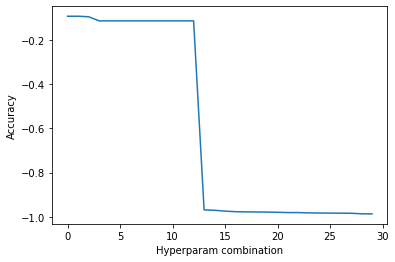

In [ ]:
results['loss'].plot()
plt.ylabel('Accuracy')
plt.xlabel('Hyperparam combination')

#### Evaluate the model

In [ ]:
# load best model

model = load_model(path_best_model)

In [ ]:
# make predictions in test set

result = model.evaluate(x=X_test,
                        y=y_test)

132/132 [==============================] - 1s 9ms/step - loss: 0.0514 - accuracy: 0.9862


In [ ]:
# print evaluation metrics

for name, value in zip(model.metrics_names, result):
    print(name, value)

loss 0.05139937251806259
accuracy 0.9861904978752136


#### Confusion matrix

In [ ]:
# Predict the values from the validation dataset
y_pred = model.predict(X_test)

# Convert predictions classes to one hot vectors 
y_pred_classes = np.argmax(y_pred, axis = 1)

# Convert validation observations to one hot vectors
y_true = np.argmax(y_test, axis = 1)

# compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes) 

cm

array([[412,   0,   0,   0,   0,   0,   4,   0,   4,   2],
       [  0, 469,   2,   0,   0,   0,   0,   1,   1,   0],
       [  1,   0, 404,   4,   0,   0,   0,   0,   0,   0],
       [  0,   0,   1, 421,   0,   1,   0,   1,   1,   1],
       [  1,   3,   0,   0, 421,   0,   4,   0,   0,   0],
       [  0,   0,   0,   1,   0, 377,   2,   0,   2,   0],
       [  0,   0,   0,   0,   0,   1, 411,   0,   0,   0],
       [  0,   1,   4,   0,   0,   1,   0, 463,   0,   0],
       [  0,   1,   1,   0,   0,   1,   1,   0, 379,   1],
       [  1,   0,   0,   1,   6,   0,   0,   1,   0, 385]], dtype=int64)

Text(0.5, 13.421126458070283, 'Predicted label')

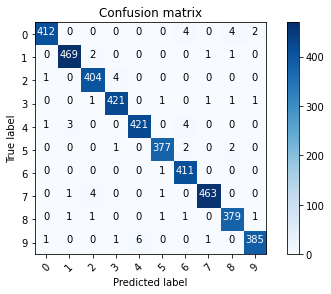

In [ ]:
# let's make it more colourful
classes = 10

plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion matrix')
plt.colorbar()
tick_marks = np.arange(classes)
plt.xticks(tick_marks, range(classes), rotation=45)
plt.yticks(tick_marks, range(classes))

for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment="center",
             color="white" if cm[i, j] > 100 else "black",
            )

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

Here we can see that our CNN performs very well on all digits.

### Optimizing a Sklearn MLPClassifier with Hyperopt

In [ ]:
import numpy as np
import pandas as pd

from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.neural_network import MLPClassifier

In [ ]:
# hp: define the hyperparameter space
# fmin: optimization function
# Trials: to evaluate the different searched hyperparameters
from hyperopt import hp, fmin

# the search algorithms
from hyperopt import tpe

In [ ]:
# load dataset

breast_cancer_X, breast_cancer_y = load_breast_cancer(return_X_y=True)
X = pd.DataFrame(breast_cancer_X)
y = pd.Series(breast_cancer_y).map({0:1, 1:0})

X.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
# the target:
# percentage of benign (0) and malign tumors (1)

y.value_counts() / len(y)

0    0.627417
1    0.372583
dtype: float64

In [ ]:
# split dataset into a train and test set

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

X_train.shape, X_test.shape

((398, 30), (171, 30))

#### Define the Hyperparameter Space

- [Hyperopt search space](http://hyperopt.github.io/hyperopt/getting-started/search_spaces/)

- [xgb.XGBClassifier hyperparameters](https://xgboost.readthedocs.io/en/latest/python/python_api.html#xgboost.XGBClassifier)

- [xgb general parameters](https://xgboost.readthedocs.io/en/latest/parameter.html)

In [ ]:
# determine the hyperparameter space

param_grid = {
    'hidden_layer_sizes': hp.choice('hidden_layer_sizes', [(10), (10, 20), (10, 20, 30)]),
    'activation': hp.choice('activation', ["tanh", "relu"]),
    'solver': hp.choice('solver', ["adam", "sgd"]),
    'learning_rate_init': hp.loguniform('learning_rate_init', np.log(0.001), np.log(1)),
}

#### Define the objective function

This is the hyperparameter response space, the function we want to minimize.

In [ ]:
# the objective function takes the hyperparameter space
# as input

def objective(params):

    # we need a dictionary to indicate which value from the space
    # to attribute to each value of the hyperparameter in the xgb
    params_dict = {
        'hidden_layer_sizes': params['hidden_layer_sizes'],
        'activation': params['activation'],
        'solver': params['solver'],
        'learning_rate_init': params['learning_rate_init'],
        'random_state': 1000,
        'max_iter': 100,
    }

    # with ** we pass the items in the dictionary as parameters
    # to the xgb
    mlp = MLPClassifier(**params_dict)

    # train with cv
    score = cross_val_score(mlp, X_train, y_train,
                            scoring='accuracy', cv=3, n_jobs=4).mean()

    # to minimize, we negate the score
    return -score

#### Test run

In [ ]:
# Before we run the hyper-parameter optimization,
# let's first check that the everything is working
# by passing some default hyper-parameters.

default_parameters = {
    'hidden_layer_sizes': (10),
    'activation': 'relu',
    'solver': 'adam',
    'learning_rate_init': 0.01,
    'random_state': 1000,
    'max_iter': 10,
}


objective(default_parameters)

-0.8944710260499734

#### TPE

In [ ]:
# fmin performs the minimization
# rand.suggest samples the parameters at random
# i.e., performs the random search

search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=50,
    rstate=np.random.RandomState(42),
    algo=tpe.suggest,  # randomized search
)

100%|███████████████████| 50/50 [00:31<00:00,  1.57trial/s, best loss: -0.9220779220779222]


In [ ]:
search

{'activation': 1,
 'hidden_layer_sizes': 1,
 'learning_rate_init': 0.00818802957397879,
 'solver': 0}